In [1]:
# General
import os, time
import requests, glob, warnings, zipfile
import numpy as np
import pandas as pd
import datetime as dt
import tables as tb
from collections import OrderedDict
pd.options.display.max_columns = 24

# Matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import mpl_toolkits.mplot3d.axes3d as p3
import matplotlib.animation as animation
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Cartopy & geopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.feature import ShapelyFeature
from cartopy.io.shapereader import Reader
from geopy import distance

%config Completer.use_jedi = False

In [2]:
import sys
sys.path.append('../src/')
import learner

import importlib
importlib.reload(learner)

l = learner.DeepLearner()

l.vc_map

OrderedDict([('01', 'SO2'),
             ('06', 'CO'),
             ('07', 'NO'),
             ('08', 'NO2'),
             ('09', 'PM25'),
             ('10', 'PM10'),
             ('12', 'NOx'),
             ('14', 'O3'),
             ('20', 'TOL'),
             ('30', 'BEN'),
             ('35', 'EBE')])

In [3]:
pd.read_csv('../notebooks/variables-stats/madrid_gases.csv').iloc[:-3]

,code,gas,min,mean,median,max,std
0,1,SO2,0.0,8.531437,7.00,199.0,7.399099
1,6,CO,0.0,0.425366,0.30,16.8,0.385224
2,7,NO,0.0,25.808452,7.00,1502.0,54.883410
3,8,NO2,0.0,41.121209,34.00,586.0,31.152513
4,9,PM25,0.0,11.112877,9.00,215.0,8.930240
5,10,PM10,0.0,22.489369,17.00,721.0,21.026431
6,12,NOx,0.0,80.683271,45.00,2755.0,108.019257
7,14,O3,0.0,46.813639,44.89,235.7,32.713721
8,20,TOL,0.1,2.987406,1.60,174.2,4.255430
9,30,BEN,0.0,0.662704,0.30,45.4,0.984969


# Experiments 01

In [8]:
def prettify_ax(ax, xlabs, ylabs):
    # x-axis
    rx = len(xlabs)
    ax.xaxis.set_major_locator(mticker.FixedLocator(np.arange(-.5, rx + .5)))
    ax.xaxis.set_minor_locator(mticker.FixedLocator(np.arange(0, rx)))
    ax.tick_params(axis='x', which='major', bottom=False)
    ax.xaxis.set_ticklabels([])
    ax.xaxis.set_ticklabels(xlabs, minor=True)
    # y-axis
    ry = len(ylabs)
    ax.yaxis.set_major_locator(mticker.FixedLocator(np.arange(-.5, ry + .5)))
    ax.yaxis.set_minor_locator(mticker.FixedLocator(np.arange(0, ry)))
    ax.tick_params(axis='y', which='major', left=False)
    ax.yaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels(ylabs, minor=True)
    #draw grid
    ax.grid()

## ST-AQF: raw vs stand vs norm

### Nearest neigbors

MAE:

<ipython-input-118-a0f935f1739e>:22: RuntimeWarning: Mean of empty slice
  arr = np.vstack([arr, np.nanmean(arr, axis=0)])


PM25 (idx 4) has no error at sensor ['57'] (idx [20])


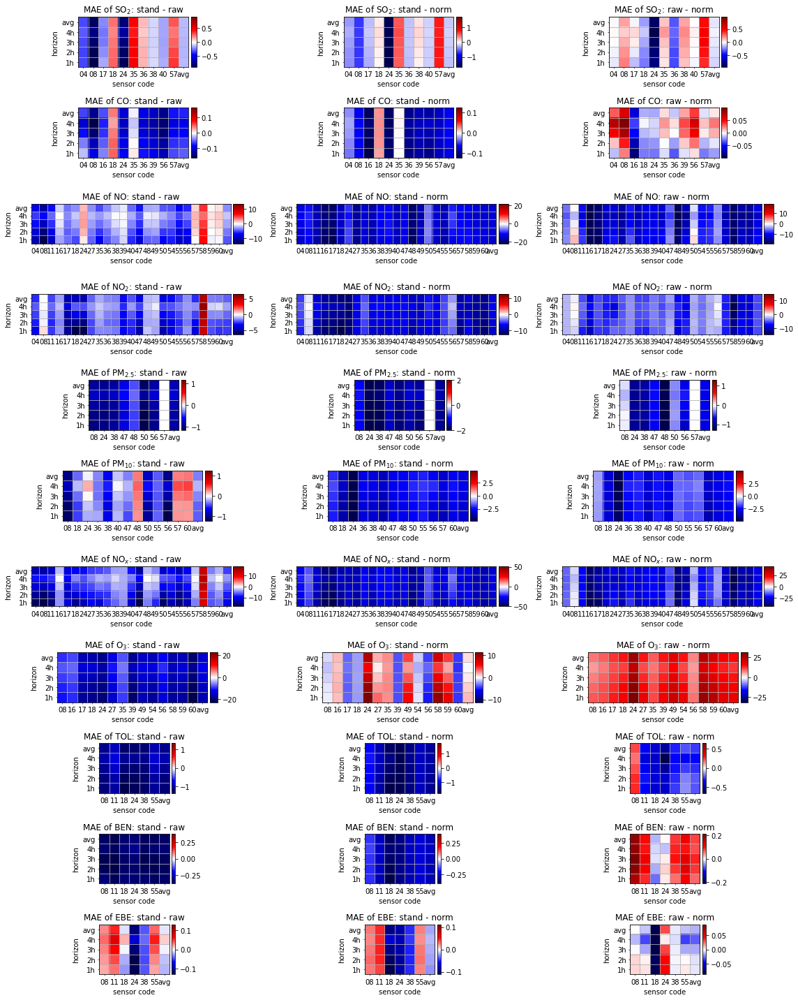

In [118]:
methods = ['nearest']
scalings = [('stand', 'raw'), ('stand', 'norm'), ('raw', 'norm')]
l.set_experiment('experiment-01')
fig, axs = plt.subplots(11, 3)
fig.set_size_inches(16, 20)

for id_v in range(11):
    vc = list(l.vc_map.keys())[id_v]
    vn = l.vc_map[vc]
    for method in methods:
        for id_s, (s1, s2) in enumerate(scalings):
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(s1, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                mae1 = h5_in.root._v_attrs['mae_mod']
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(s2, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                mae2 = h5_in.root._v_attrs['mae_mod']
            arr = (mae1[:,l.vi_si_map[id_v],id_v] - mae2[:,l.vi_si_map[id_v],id_v])
            arr = np.hstack([arr, np.expand_dims(np.nanmean(arr, axis=1), axis=1)])
            arr = np.vstack([arr, np.nanmean(arr, axis=0)])
            divider = make_axes_locatable(axs[id_v, id_s])
            cax = divider.append_axes('right', size='5%', pad=0.05)
            v_val = np.nanmax(np.abs(arr))
            im = axs[id_v, id_s].imshow(arr, vmin=-v_val, vmax=v_val, origin='lower', cmap='seismic')
            fig.colorbar(im, cax=cax, orientation='vertical')
            axs[id_v, id_s].set_title('MAE of {}: {} - {}'.format(l.vc_map_pretty[vc], s1, s2))
            axs[id_v, id_s].set_xlabel('sensor code')
            axs[id_v, id_s].set_ylabel('horizon')
            prettify_ax(axs[id_v, id_s], [list(l.sc_map.keys())[si] for si in l.vi_si_map[id_v]] + ['avg'],
                        ['{}h'.format(h+1) for h in range(l.n_y)] + ['avg'])
    if np.isnan(arr[0, :]).sum() > 0:
            sidx = [l.vi_si_map[id_v][i] for i in np.argwhere(np.isnan(arr[0, :]))[0]]
            sns = [list(l.sc_map.keys())[i] for i in sidx]
            print('{} (idx {}) has no error at sensor {} (idx {})'.format(vn, id_v,sns, sidx))
plt.tight_layout()
plt.show()

RMSE:

<ipython-input-120-a246a43c16c8>:22: RuntimeWarning: Mean of empty slice
  arr = np.vstack([arr, np.nanmean(arr, axis=0)])


PM25 (idx 4) has no error at sensor ['57'] (idx [20])


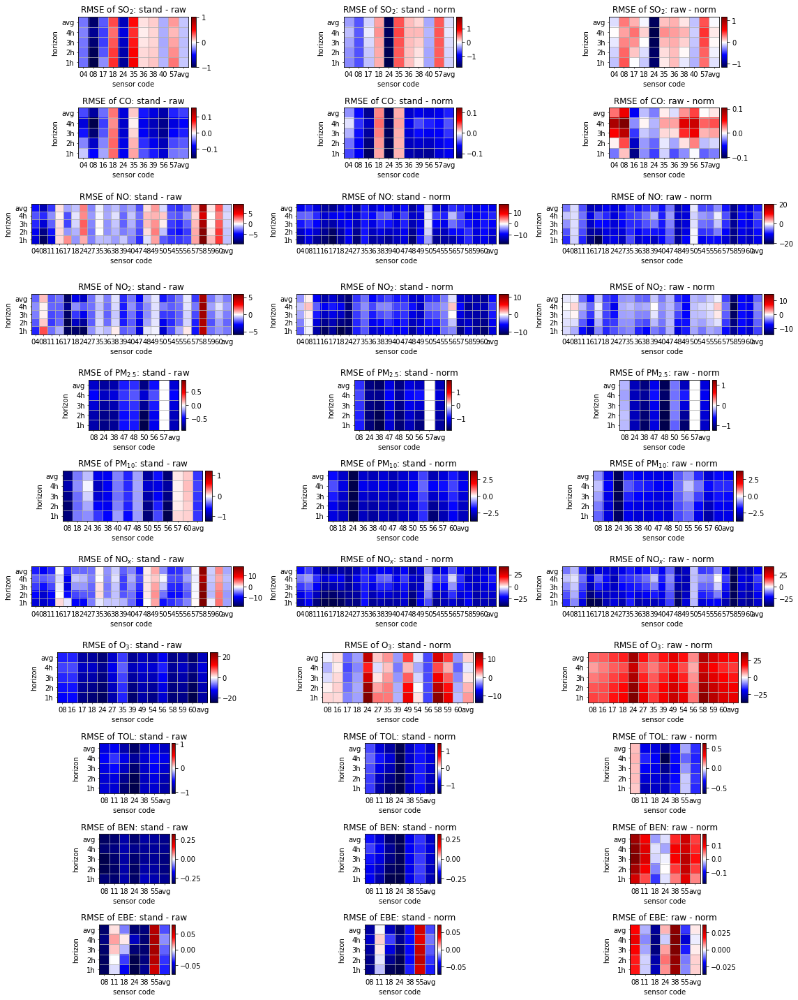

In [120]:
methods = ['nearest']
scalings = [('stand', 'raw'), ('stand', 'norm'), ('raw', 'norm')]
l.set_experiment('experiment-01')
fig, axs = plt.subplots(11, 3)
fig.set_size_inches(16, 20)

for id_v in range(11):
    vc = list(l.vc_map.keys())[id_v]
    vn = l.vc_map[vc]
    for method in methods:
        for id_s, (s1, s2) in enumerate(scalings):
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(s1, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                rmse1 = h5_in.root._v_attrs['rmse_mod']
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(s2, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                rmse2 = h5_in.root._v_attrs['rmse_mod']
            arr = (rmse1[:,l.vi_si_map[id_v],id_v] - rmse2[:,l.vi_si_map[id_v],id_v])
            arr = np.hstack([arr, np.expand_dims(np.nanmean(arr, axis=1), axis=1)])
            arr = np.vstack([arr, np.nanmean(arr, axis=0)])
            divider = make_axes_locatable(axs[id_v, id_s])
            cax = divider.append_axes('right', size='5%', pad=0.05)
            v_val = np.nanmax(np.abs(arr))
            im = axs[id_v, id_s].imshow(arr, vmin=-v_val, vmax=v_val, origin='lower', cmap='seismic')
            fig.colorbar(im, cax=cax, orientation='vertical')
            axs[id_v, id_s].set_title('RMSE of {}: {} - {}'.format(l.vc_map_pretty[list(l.vc_map.keys())[id_v]], s1, s2))
            axs[id_v, id_s].set_xlabel('sensor code')
            axs[id_v, id_s].set_ylabel('horizon')
            prettify_ax(axs[id_v, id_s], [list(l.sc_map.keys())[si] for si in l.vi_si_map[id_v]] + ['avg'],
                        ['{}h'.format(h+1) for h in range(l.n_y)] + ['avg'])
    if np.isnan(arr[0, :]).sum() > 0:
        sidx = [l.vi_si_map[id_v][i] for i in np.argwhere(np.isnan(arr[0, :]))[0]]
        sns = [list(l.sc_map.keys())[i] for i in sidx]
        print('{} (idx {}) has no error at sensor {} (idx {})'.format(vn, id_v,sns, sidx))
plt.tight_layout()
plt.show()

### Linear

MAE:

<ipython-input-119-00593bc38653>:22: RuntimeWarning: Mean of empty slice
  arr = np.vstack([arr, np.nanmean(arr, axis=0)])


PM25 (idx 4) has no error at sensor ['57'] (idx [20])


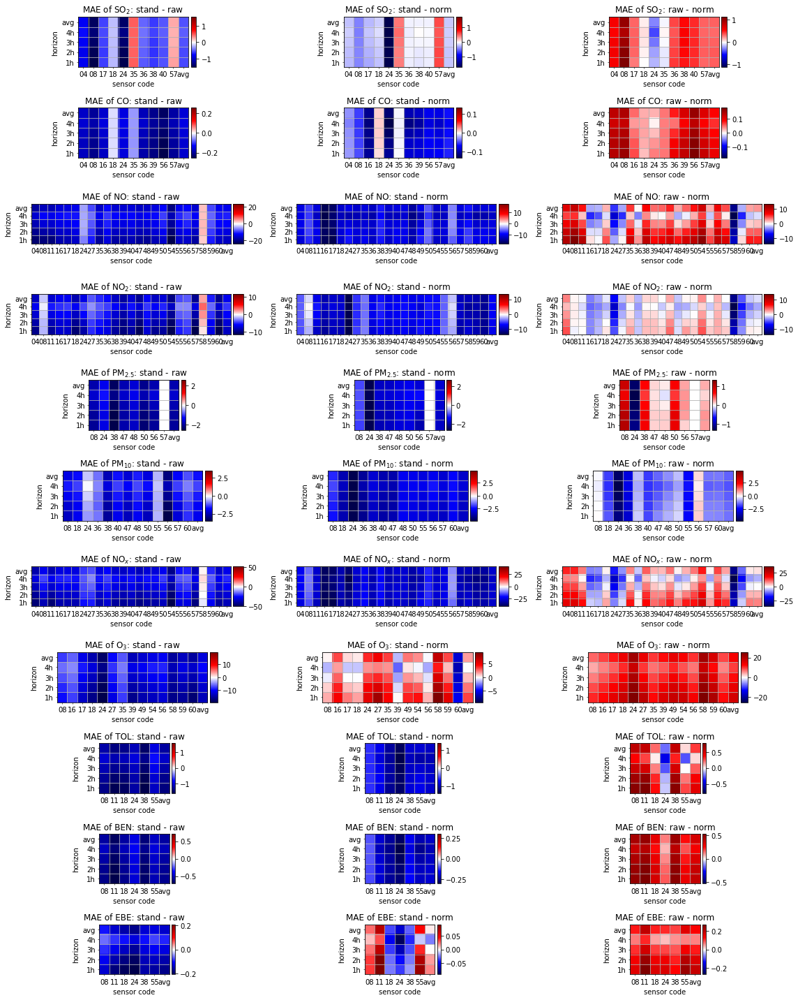

In [119]:
methods = ['linear']
scalings = [('stand', 'raw'), ('stand', 'norm'), ('raw', 'norm')]
l.set_experiment('experiment-01')
fig, axs = plt.subplots(11, 3)
fig.set_size_inches(16, 20)

for id_v in range(11):
    vc = list(l.vc_map.keys())[id_v]
    vn = l.vc_map[vc]
    for method in methods:
        for id_s, (s1, s2) in enumerate(scalings):
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(s1, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                mae1 = h5_in.root._v_attrs['mae_mod']
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(s2, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                mae2 = h5_in.root._v_attrs['mae_mod']
            arr = (mae1[:,l.vi_si_map[id_v],id_v] - mae2[:,l.vi_si_map[id_v],id_v])
            arr = np.hstack([arr, np.expand_dims(np.nanmean(arr, axis=1), axis=1)])
            arr = np.vstack([arr, np.nanmean(arr, axis=0)])
            divider = make_axes_locatable(axs[id_v, id_s])
            cax = divider.append_axes('right', size='5%', pad=0.05)
            v_val = np.nanmax(np.abs(arr))
            im = axs[id_v, id_s].imshow(arr, vmin=-v_val, vmax=v_val, origin='lower', cmap='seismic')
            fig.colorbar(im, cax=cax, orientation='vertical')
            axs[id_v, id_s].set_title('MAE of {}: {} - {}'.format(l.vc_map_pretty[vc], s1, s2))
            axs[id_v, id_s].set_xlabel('sensor code')
            axs[id_v, id_s].set_ylabel('horizon')
            prettify_ax(axs[id_v, id_s], [list(l.sc_map.keys())[si] for si in l.vi_si_map[id_v]] + ['avg'],
                        ['{}h'.format(h+1) for h in range(l.n_y)] + ['avg'])
    if np.isnan(arr[0, :]).sum() > 0:
            sidx = [l.vi_si_map[id_v][i] for i in np.argwhere(np.isnan(arr[0, :]))[0]]
            sns = [list(l.sc_map.keys())[i] for i in sidx]
            print('{} (idx {}) has no error at sensor {} (idx {})'.format(vn, id_v,sns, sidx))
plt.tight_layout()
plt.show()

RMSE:

<ipython-input-121-dafb52ad92d5>:22: RuntimeWarning: Mean of empty slice
  arr = np.vstack([arr, np.nanmean(arr, axis=0)])


PM25 (idx 4) has no error at sensor ['57'] (idx [20])


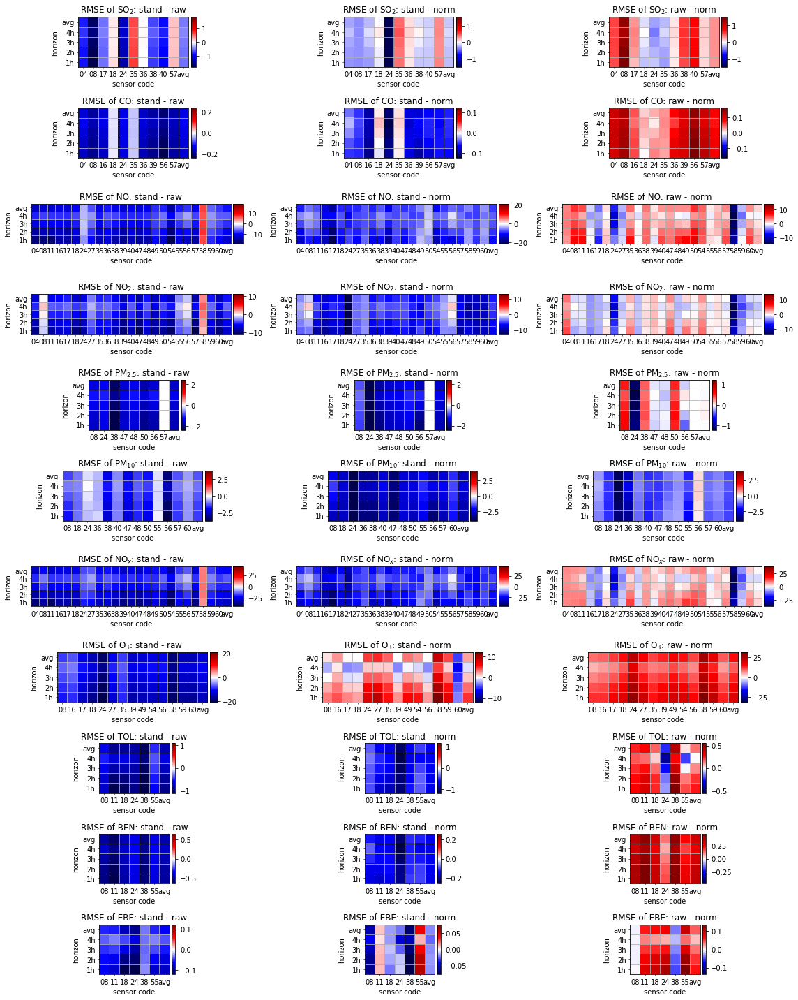

In [121]:
methods = ['linear']
scalings = [('stand', 'raw'), ('stand', 'norm'), ('raw', 'norm')]
l.set_experiment('experiment-01')
fig, axs = plt.subplots(11, 3)
fig.set_size_inches(16, 20)

for id_v in range(11):
    vc = list(l.vc_map.keys())[id_v]
    vn = l.vc_map[vc]
    for method in methods:
        for id_s, (s1, s2) in enumerate(scalings):
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(s1, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                rmse1 = h5_in.root._v_attrs['rmse_mod']
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(s2, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                rmse2 = h5_in.root._v_attrs['rmse_mod']
            arr = (rmse1[:,l.vi_si_map[id_v],id_v] - rmse2[:,l.vi_si_map[id_v],id_v])
            arr = np.hstack([arr, np.expand_dims(np.nanmean(arr, axis=1), axis=1)])
            arr = np.vstack([arr, np.nanmean(arr, axis=0)])
            divider = make_axes_locatable(axs[id_v, id_s])
            cax = divider.append_axes('right', size='5%', pad=0.05)
            v_val = np.nanmax(np.abs(arr))
            im = axs[id_v, id_s].imshow(arr, vmin=-v_val, vmax=v_val, origin='lower', cmap='seismic')
            fig.colorbar(im, cax=cax, orientation='vertical')
            axs[id_v, id_s].set_title('RMSE of {}: {} - {}'.format(l.vc_map_pretty[list(l.vc_map.keys())[id_v]], s1, s2))
            axs[id_v, id_s].set_xlabel('sensor code')
            axs[id_v, id_s].set_ylabel('horizon')
            prettify_ax(axs[id_v, id_s], [list(l.sc_map.keys())[si] for si in l.vi_si_map[id_v]] + ['avg'],
                        ['{}h'.format(h+1) for h in range(l.n_y)] + ['avg'])
    if np.isnan(arr[0, :]).sum() > 0:
        sidx = [l.vi_si_map[id_v][i] for i in np.argwhere(np.isnan(arr[0, :]))[0]]
        sns = [list(l.sc_map.keys())[i] for i in sidx]
        print('{} (idx {}) has no error at sensor {} (idx {})'.format(vn, id_v,sns, sidx))
plt.tight_layout()
plt.show()

## ST-AQF vs persistence: tables

In [6]:
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

MAE:

In [179]:
methods = ['nearest', 'linear']
scalings = ['raw', 'stand', 'norm']
models = ['ST-AQF', 'persistence']
l.set_experiment('experiment-01')

# list that records the maximum difference between comparable models
mae_v = []

for id_v in range(11):
    df = pd.DataFrame(index=pd.MultiIndex.from_product([methods, scalings, models]),
                      columns=['MAE h0', 'MAE h1', 'MAE h2', 'MAE h3', 'avg'])
    df.index.set_names([list(l.vn_map.keys())[id_v], '', ''], inplace=True)
    for method in methods:
        for scaling in scalings:
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(scaling, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                mae = h5_in.root._v_attrs['mae_mod']
            with tb.open_file(fname.replace('ST_AQF', 'persistence').replace('075', '100'), mode='r') as h5_in:
                maeP = h5_in.root._v_attrs['mae_mod']
            for h in range(4):
                df.loc[(method, scaling, 'ST-AQF'), 'MAE h'+str(h)] = np.nanmean(mae[h, :, id_v])
                df.loc[(method, scaling, 'persistence'), 'MAE h'+str(h)] = np.nanmean(maeP[h, :, id_v])
            df.loc[(method, scaling, 'ST-AQF'), 'avg'] = df.loc[(method, scaling, 'ST-AQF')].mean()
            df.loc[(method, scaling, 'persistence'), 'avg'] = df.loc[(method, scaling, 'persistence')].mean()
    mae_v.append(np.ceil((np.abs(df.iloc[0::2].values - df.iloc[1::2].values)).max()))
    display(df)

MAE h0    MAE h1    MAE h2    MAE h3       avg
SO2                                                                        
nearest raw   ST-AQF       3.171735  3.185639  3.219885  3.256369  3.208407
              persistence  0.654602  1.016810  1.283993  1.493460  1.112216
        stand ST-AQF       3.051389  3.058228  3.091196  3.131397  3.083052
              persistence  0.654602  1.016811  1.283993  1.493460  1.112216
        norm  ST-AQF       3.250437  3.245558  3.258096  3.279609  3.258425
              persistence  0.654602  1.016810  1.283993  1.493460  1.112216
linear  raw   ST-AQF       3.598285  3.602539  3.604986  3.606741  3.603138
              persistence  0.982165  1.268949  1.492796  1.672239  1.354037
        stand ST-AQF       3.051701  3.059458  3.087990  3.123330  3.080620
              persistence  0.982165  1.268949  1.492796  1.672239  1.354037
        norm  ST-AQF       3.245994  3.244544  3.259122  3.282818  3.258120
              persistence  0.982165  1.268949  1.492796  1.672239  1.354037

MAE h0    MAE h1    MAE h2    MAE h3       avg
CO                                                                         
nearest raw   ST-AQF       0.175724  0.191125  0.215675  0.229593  0.203029
              persistence  0.053017  0.083363  0.105141  0.120564  0.090521
        stand ST-AQF       0.124653  0.129418  0.135877  0.141104  0.132763
              persistence  0.053017  0.083363  0.105141  0.120564  0.090521
        norm  ST-AQF       0.194792  0.196295  0.199408  0.202650  0.198286
              persistence  0.053017  0.083364  0.105141  0.120564  0.090522
linear  raw   ST-AQF       0.284995  0.287699  0.288987  0.286241  0.286981
              persistence  0.066886  0.093496  0.113413  0.127732  0.100382
        stand ST-AQF       0.123281  0.128751  0.135709  0.141235  0.132244
              persistence  0.066886  0.093496  0.113413  0.127732  0.100382
        norm  ST-AQF       0.181033  0.187621  0.199463  0.211271  0.194847
              persistence  0.066886  0.093496  0.113413  0.127732  0.100382

MAE h0     MAE h1     MAE h2     MAE h3  \
NO                                                                      
nearest raw   ST-AQF       22.090027  21.876344  21.298668  20.583816   
              persistence   7.337045  11.682099  14.693117  16.806220   
        stand ST-AQF       17.480155  18.263797  18.828144  18.963053   
              persistence   7.337045  11.682099  14.693117  16.806220   
        norm  ST-AQF       31.629371  31.786771  32.125363  32.499518   
              persistence   7.337045  11.682099  14.693117  16.806220   
linear  raw   ST-AQF       34.358127  33.180070  31.676817  30.295652   
              persistence   7.393223  11.547125  14.501902  16.603939   
        stand ST-AQF       18.298417  19.202033  19.692786  19.665198   
              persistence   7.393223  11.547125  14.501902  16.603939   
        norm  ST-AQF       28.381622  28.879285  29.923641  31.193431   
              persistence   7.393224  11.547126  14.501903  16.603939   

                                 avg  
NO                                    
nearest raw   ST-AQF       21.462214  
              persistence  12.629620  
        stand ST-AQF       18.383787  
              persistence  12.629620  
        norm  ST-AQF       32.010256  
              persistence  12.629620  
linear  raw   ST-AQF       32.377667  
              persistence  12.511547  
        stand ST-AQF       19.214609  
              persistence  12.511547  
        norm  ST-AQF       29.594495  
              persistence  12.511548

MAE h0     MAE h1     MAE h2     MAE h3  \
NO2                                                                     
nearest raw   ST-AQF       15.732617  16.857521  17.936429  18.759737   
              persistence   8.253744  13.616018  17.652558  20.592303   
        stand ST-AQF       13.255494  14.462549  16.095462  17.569035   
              persistence   8.253744  13.616018  17.652558  20.592303   
        norm  ST-AQF       20.905369  21.797867  22.969642  23.972990   
              persistence   8.253744  13.616018  17.652558  20.592303   
linear  raw   ST-AQF       20.692481  21.342831  21.818469  22.102422   
              persistence   8.381733  13.567803  17.539854  20.447693   
        stand ST-AQF       13.106251  14.428889  16.134404  17.616237   
              persistence   8.381733  13.567803  17.539854  20.447693   
        norm  ST-AQF       20.433781  21.602664  23.052530  24.353677   
              persistence   8.381734  13.567803  17.539854  20.447693   

                                 avg  
NO2                                   
nearest raw   ST-AQF       17.321576  
              persistence  15.028656  
        stand ST-AQF       15.345635  
              persistence  15.028656  
        norm  ST-AQF       22.411467  
              persistence  15.028656  
linear  raw   ST-AQF       21.489051  
              persistence  14.984271  
        stand ST-AQF       15.321445  
              persistence  14.984271  
        norm  ST-AQF       22.360663  
              persistence  14.984271

MAE h0    MAE h1    MAE h2    MAE h3       avg
PM25                                                                       
nearest raw   ST-AQF       5.879165  5.901450  5.911582  5.914028  5.901556
              persistence  3.086369  4.023558  4.462290  4.803347  4.093891
        stand ST-AQF       5.017982  5.029306  5.105407  5.219497  5.093048
              persistence  3.086369  4.023558  4.462290  4.803347  4.093891
        norm  ST-AQF       6.621873  6.612307  6.621695  6.635185  6.622765
              persistence  3.086369  4.023558  4.462290  4.803347  4.093891
linear  raw   ST-AQF       6.844408  6.855604  6.805379  6.744540  6.812483
              persistence  2.933013  3.764942  4.190318  4.528922  3.854299
        stand ST-AQF       4.839110  4.860625  4.959645  5.095166  4.938637
              persistence  2.933013  3.764942  4.190318  4.528922  3.854299
        norm  ST-AQF       6.592284  6.581572  6.603233  6.638723  6.603953
              persistence  2.933013  3.764942  4.190318  4.528922  3.854299

MAE h0     MAE h1     MAE h2     MAE h3  \
PM10                                                                    
nearest raw   ST-AQF        9.989755  10.002853  10.072567  10.165374   
              persistence   4.796048   6.600921   7.658141   8.458765   
        stand ST-AQF        9.597967   9.619529   9.779664   9.982534   
              persistence   4.796048   6.600921   7.658141   8.458765   
        norm  ST-AQF       12.557281  12.559284  12.569282  12.573521   
              persistence   4.796048   6.600921   7.658141   8.458765   
linear  raw   ST-AQF       11.213879  11.142517  11.098517  11.085027   
              persistence   4.678331   6.391607   7.430735   8.226402   
        stand ST-AQF        9.324106   9.345043   9.537778   9.783837   
              persistence   4.678331   6.391607   7.430735   8.226402   
        norm  ST-AQF       12.538236  12.563359  12.629429  12.727167   
              persistence   4.678331   6.391607   7.430735   8.226402   

                                 avg  
PM10                                  
nearest raw   ST-AQF       10.057637  
              persistence   6.878469  
        stand ST-AQF        9.744923  
              persistence   6.878469  
        norm  ST-AQF       12.564842  
              persistence   6.878469  
linear  raw   ST-AQF       11.134985  
              persistence   6.681769  
        stand ST-AQF        9.497691  
              persistence   6.681769  
        norm  ST-AQF       12.614548  
              persistence   6.681769

MAE h0     MAE h1     MAE h2     MAE h3  \
NOx                                                                     
nearest raw   ST-AQF       42.028625  43.475361  44.495209  44.980866   
              persistence  18.998874  30.787290  39.247349  45.253339   
        stand ST-AQF       32.365793  35.304452  38.661059  41.220710   
              persistence  18.998874  30.787289  39.247349  45.253339   
        norm  ST-AQF       66.093267  66.966734  68.583410  70.190108   
              persistence  18.998874  30.787290  39.247349  45.253339   
linear  raw   ST-AQF       68.989873  67.518147  65.643292  63.895203   
              persistence  19.107051  30.446244  38.777359  44.744230   
        stand ST-AQF       33.704762  36.779978  39.890651  42.099589   
              persistence  19.107051  30.446244  38.777359  44.744230   
        norm  ST-AQF       60.266823  62.319337  65.704538  69.216141   
              persistence  19.107051  30.446244  38.777359  44.744230   

                                 avg  
NOx                                   
nearest raw   ST-AQF       43.745015  
              persistence  33.571713  
        stand ST-AQF       36.888004  
              persistence  33.571713  
        norm  ST-AQF       67.958380  
              persistence  33.571713  
linear  raw   ST-AQF       66.511629  
              persistence  33.268721  
        stand ST-AQF       38.118745  
              persistence  33.268721  
        norm  ST-AQF       64.376710  
              persistence  33.268721

MAE h0     MAE h1     MAE h2     MAE h3  \
O3                                                                      
nearest raw   ST-AQF       37.773703  37.451967  37.029692  36.620672   
              persistence   7.557099  13.039131  17.492409  21.113259   
        stand ST-AQF       21.614187  22.178983  23.124785  24.073568   
              persistence   7.557099  13.039132  17.492409  21.113260   
        norm  ST-AQF       20.117469  21.040262  22.611569  24.186143   
              persistence   7.557099  13.039131  17.492409  21.113259   
linear  raw   ST-AQF       35.575570  35.117502  34.623734  34.218785   
              persistence   7.607204  13.001490  17.418011  21.014795   
        stand ST-AQF       22.110892  22.702251  23.634417  24.524577   
              persistence   7.607204  13.001490  17.418011  21.014795   
        norm  ST-AQF       18.671321  20.253898  22.451494  24.563758   
              persistence   7.607204  13.001490  17.418011  21.014795   

                                 avg  
O3                                    
nearest raw   ST-AQF       37.219009  
              persistence  14.800474  
        stand ST-AQF       22.747881  
              persistence  14.800475  
        norm  ST-AQF       21.988860  
              persistence  14.800475  
linear  raw   ST-AQF       34.883898  
              persistence  14.760375  
        stand ST-AQF       23.243034  
              persistence  14.760375  
        norm  ST-AQF       21.485118  
              persistence  14.760375

MAE h0    MAE h1    MAE h2    MAE h3       avg
TOL                                                                        
nearest raw   ST-AQF       2.647507  2.644756  2.601291  2.558028  2.612895
              persistence  0.632776  0.959952  1.175918  1.326804  1.023862
        stand ST-AQF       1.457493  1.478341  1.519625  1.572315  1.506943
              persistence  0.632776  0.959952  1.175918  1.326804  1.023862
        norm  ST-AQF       2.863343  2.857827  2.868755  2.883862  2.868447
              persistence  0.632777  0.959953  1.175919  1.326805  1.023863
linear  raw   ST-AQF       2.846798  2.792178  2.707994  2.632442  2.744853
              persistence  0.647346  0.955122  1.163984  1.311760  1.019553
        stand ST-AQF       1.485027  1.500585  1.541820  1.598709  1.531535
              persistence  0.647346  0.955122  1.163984  1.311760  1.019553
        norm  ST-AQF       2.369304  2.376582  2.455073  2.573745  2.443676
              persistence  0.647346  0.955122  1.163984  1.311760  1.019553

MAE h0    MAE h1    MAE h2    MAE h3       avg
BEN                                                                        
nearest raw   ST-AQF       0.665562  0.686359  0.696659  0.682250  0.682707
              persistence  0.114238  0.175748  0.218045  0.247384  0.188854
        stand ST-AQF       0.321010  0.327320  0.335261  0.343549  0.331785
              persistence  0.114238  0.175748  0.218045  0.247384  0.188854
        norm  ST-AQF       0.601646  0.601304  0.604515  0.608640  0.604027
              persistence  0.114238  0.175748  0.218045  0.247385  0.188854
linear  raw   ST-AQF       0.913008  0.906464  0.883575  0.850336  0.888345
              persistence  0.121705  0.179358  0.220475  0.249398  0.192734
        stand ST-AQF       0.329494  0.335331  0.344448  0.352630  0.340476
              persistence  0.121705  0.179358  0.220475  0.249398  0.192734
        norm  ST-AQF       0.521351  0.527069  0.545193  0.565227  0.539710
              persistence  0.121705  0.179358  0.220475  0.249398  0.192734

MAE h0    MAE h1    MAE h2    MAE h3       avg
EBE                                                                        
nearest raw   ST-AQF       0.527811  0.526034  0.518407  0.509397  0.520412
              persistence  0.123388  0.183074  0.221847  0.248110  0.194105
        stand ST-AQF       0.508459  0.510185  0.515112  0.521943  0.513925
              persistence  0.123388  0.183074  0.221847  0.248110  0.194105
        norm  ST-AQF       0.532298  0.531024  0.533464  0.537492  0.533569
              persistence  0.123389  0.183075  0.221848  0.248111  0.194106
linear  raw   ST-AQF       0.692649  0.675860  0.649891  0.624393  0.660698
              persistence  0.165070  0.218258  0.253694  0.278321  0.228836
        stand ST-AQF       0.522864  0.524290  0.529003  0.534908  0.527766
              persistence  0.165070  0.218258  0.253694  0.278321  0.228836
        norm  ST-AQF       0.501037  0.506515  0.528841  0.558463  0.523714
              persistence  0.165070  0.218258  0.253694  0.278321  0.228836

RMSE:

In [180]:
methods = ['nearest', 'linear']
scalings = ['raw', 'stand', 'norm']
models = ['ST-AQF', 'persistence']
l.set_experiment('experiment-01')

# list that records the maximum difference between comparable models
rmse_v = []

for id_v in range(11):
    df = pd.DataFrame(index=pd.MultiIndex.from_product([methods, scalings, models]),
                      columns=['RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
    df.index.set_names([list(l.vn_map.keys())[id_v], '', ''], inplace=True)
    for method in methods:
        for scaling in scalings:
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(scaling, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
            with tb.open_file(fname.replace('ST_AQF', 'persistence').replace('075', '100'), mode='r') as h5_in:
                rmseP = h5_in.root._v_attrs['rmse_mod']
            for h in range(4):
                df.loc[(method, scaling, 'ST-AQF'), 'RMSE h'+str(h)] = np.nanmean(rmse[h, :, id_v])
                df.loc[(method, scaling, 'persistence'), 'RMSE h'+str(h)] = np.nanmean(rmseP[h, :, id_v])
            df.loc[(method, scaling, 'ST-AQF'), 'avg'] = df.loc[(method, scaling, 'ST-AQF')].mean()
            df.loc[(method, scaling, 'persistence'), 'avg'] = df.loc[(method, scaling, 'persistence')].mean()
    rmse_v.append(np.ceil((np.abs(df.iloc[0::2].values - df.iloc[1::2].values)).max()))
    display(df)

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
SO2                                                                        
nearest raw   ST-AQF       4.309172  4.337929  4.407147  4.481595  4.383961
              persistence  1.487715  2.148836  2.603153  2.933471  2.293294
        stand ST-AQF       4.206893  4.219330  4.279868  4.359506  4.266399
              persistence  1.487715  2.148836  2.603153  2.933471  2.293294
        norm  ST-AQF       4.372644  4.371296  4.395777  4.432957  4.393169
              persistence  1.487715  2.148836  2.603153  2.933471  2.293294
linear  raw   ST-AQF       4.724317  4.738787  4.764112  4.792294  4.754878
              persistence  1.673229  2.233608  2.639072  2.940813  2.371680
        stand ST-AQF       4.221423  4.235125  4.290427  4.358970  4.276487
              persistence  1.673229  2.233608  2.639072  2.940813  2.371680
        norm  ST-AQF       4.421320  4.422981  4.444606  4.476018  4.441231
              persistence  1.673229  2.233608  2.639072  2.940813  2.371680

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
CO                                                                         
nearest raw   ST-AQF       0.212511  0.233265  0.266532  0.288359  0.250167
              persistence  0.115602  0.168818  0.203645  0.226371  0.178609
        stand ST-AQF       0.173484  0.183166  0.197929  0.210693  0.191318
              persistence  0.115602  0.168818  0.203645  0.226371  0.178609
        norm  ST-AQF       0.239049  0.241925  0.247368  0.252439  0.245195
              persistence  0.115602  0.168818  0.203645  0.226371  0.178609
linear  raw   ST-AQF       0.319060  0.326896  0.333930  0.335804  0.328923
              persistence  0.120957  0.169612  0.202642  0.224612  0.179456
        stand ST-AQF       0.172574  0.183348  0.198128  0.209977  0.191007
              persistence  0.120957  0.169612  0.202642  0.224612  0.179456
        norm  ST-AQF       0.232374  0.238597  0.249411  0.259965  0.245087
              persistence  0.120957  0.169612  0.202642  0.224612  0.179456

RMSE h0    RMSE h1    RMSE h2    RMSE h3  \
NO                                                                      
nearest raw   ST-AQF       27.987360  29.721295  31.868846  33.566786   
              persistence  19.173895  29.427986  35.795375  39.780649   
        stand ST-AQF       26.814856  28.627319  31.010131  32.886505   
              persistence  19.173895  29.427986  35.795375  39.780650   
        norm  ST-AQF       39.209951  39.546510  40.234804  40.900510   
              persistence  19.173895  29.427986  35.795375  39.780649   
linear  raw   ST-AQF       39.975473  40.005359  40.004938  39.990017   
              persistence  18.773551  28.629923  34.910983  38.889294   
        stand ST-AQF       27.516788  29.610124  32.003466  33.635091   
              persistence  18.773551  28.629923  34.910983  38.889294   
        norm  ST-AQF       37.670513  38.152909  39.164194  40.321093   
              persistence  18.773551  28.629923  34.910983  38.889294   

                                 avg  
NO                                    
nearest raw   ST-AQF       30.786072  
              persistence  31.044476  
        stand ST-AQF       29.834703  
              persistence  31.044477  
        norm  ST-AQF       39.972944  
              persistence  31.044476  
linear  raw   ST-AQF       39.993947  
              persistence  30.300938  
        stand ST-AQF       30.691367  
              persistence  30.300938  
        norm  ST-AQF       38.827177  
              persistence  30.300938

RMSE h0    RMSE h1    RMSE h2    RMSE h3  \
NO2                                                                     
nearest raw   ST-AQF       19.385439  21.480727  23.627083  25.292954   
              persistence  12.714541  20.343854  25.547443  29.088168   
        stand ST-AQF       17.857399  19.736018  22.145776  24.140974   
              persistence  12.714541  20.343854  25.547443  29.088168   
        norm  ST-AQF       24.658108  25.843292  27.347515  28.574777   
              persistence  12.714541  20.343854  25.547443  29.088168   
linear  raw   ST-AQF       24.492770  25.554510  26.578571  27.379152   
              persistence  12.708860  20.139014  25.283666  28.798047   
        stand ST-AQF       17.542522  19.639081  22.138309  24.090145   
              persistence  12.708860  20.139014  25.283666  28.798047   
        norm  ST-AQF       24.567057  25.911187  27.563990  29.012563   
              persistence  12.708860  20.139014  25.283666  28.798047   

                                 avg  
NO2                                   
nearest raw   ST-AQF       22.446551  
              persistence  21.923502  
        stand ST-AQF       20.970042  
              persistence  21.923501  
        norm  ST-AQF       26.605923  
              persistence  21.923502  
linear  raw   ST-AQF       26.001250  
              persistence  21.732397  
        stand ST-AQF       20.852514  
              persistence  21.732397  
        norm  ST-AQF       26.763699  
              persistence  21.732397

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
PM25                                                                       
nearest raw   ST-AQF       7.274339  7.311226  7.386217  7.468673  7.360114
              persistence  4.697869  6.060112  6.664796  7.102222  6.131250
        stand ST-AQF       6.634484  6.680682  6.833373  7.011112  6.789913
              persistence  4.697869  6.060112  6.664796  7.102222  6.131250
        norm  ST-AQF       8.075758  8.072758  8.095909  8.131610  8.094009
              persistence  4.697869  6.060112  6.664796  7.102222  6.131250
linear  raw   ST-AQF       8.094131  8.135869  8.151081  8.152160  8.133310
              persistence  4.383607  5.606767  6.202818  6.643734  5.709232
        stand ST-AQF       6.398259  6.459894  6.647446  6.849872  6.588868
              persistence  4.383607  5.606767  6.202818  6.643734  5.709232
        norm  ST-AQF       8.102596  8.098531  8.126000  8.168155  8.123820
              persistence  4.383607  5.606767  6.202818  6.643734  5.709232

RMSE h0    RMSE h1    RMSE h2    RMSE h3  \
PM10                                                                    
nearest raw   ST-AQF       13.483418  13.569294  13.799686  14.047740   
              persistence   8.155295  10.782827  12.233071  13.266200   
        stand ST-AQF       13.000425  13.071408  13.318023  13.597925   
              persistence   8.155295  10.782827  12.233071  13.266199   
        norm  ST-AQF       15.554567  15.561635  15.583703  15.600951   
              persistence   8.155295  10.782827  12.233071  13.266200   
linear  raw   ST-AQF       14.118981  14.151688  14.270113  14.406507   
              persistence   7.838534  10.347185  11.779705  12.810509   
        stand ST-AQF       12.665387  12.743307  13.032574  13.352120   
              persistence   7.838534  10.347185  11.779705  12.810509   
        norm  ST-AQF       15.622654  15.639234  15.683889  15.752432   
              persistence   7.838534  10.347185  11.779705  12.810508   

                                 avg  
PM10                                  
nearest raw   ST-AQF       13.725035  
              persistence  11.109348  
        stand ST-AQF       13.246945  
              persistence  11.109348  
        norm  ST-AQF       15.575214  
              persistence  11.109348  
linear  raw   ST-AQF       14.236822  
              persistence  10.693983  
        stand ST-AQF       12.948347  
              persistence  10.693983  
        norm  ST-AQF       15.674552  
              persistence  10.693983

RMSE h0    RMSE h1    RMSE h2    RMSE h3  \
NOx                                                                     
nearest raw   ST-AQF       52.587942  58.330916  64.812158  69.840801   
              persistence  38.235378  59.692252  73.585827  82.594025   
        stand ST-AQF       49.199531  54.676391  61.779583  67.432657   
              persistence  38.235378  59.692252  73.585826  82.594024   
        norm  ST-AQF       79.415363  81.074271  83.715312  86.087808   
              persistence  38.235378  59.692252  73.585827  82.594025   
linear  raw   ST-AQF       79.749381  80.952800  82.132598  83.067425   
              persistence  37.685350  58.402705  72.126885  81.108954   
        stand ST-AQF       50.171944  56.319659  63.445475  68.565080   
              persistence  37.685350  58.402705  72.126884  81.108954   
        norm  ST-AQF       76.747922  78.978488  82.488036  85.994133   
              persistence  37.685350  58.402705  72.126884  81.108954   

                                 avg  
NOx                                   
nearest raw   ST-AQF       61.392954  
              persistence  63.526871  
        stand ST-AQF       58.272040  
              persistence  63.526870  
        norm  ST-AQF       82.573189  
              persistence  63.526871  
linear  raw   ST-AQF       81.475551  
              persistence  62.330973  
        stand ST-AQF       59.625539  
              persistence  62.330973  
        norm  ST-AQF       81.052145  
              persistence  62.330973

RMSE h0    RMSE h1    RMSE h2    RMSE h3  \
O3                                                                      
nearest raw   ST-AQF       45.316242  45.013414  44.613920  44.215365   
              persistence  11.170513  18.595195  24.307538  28.830751   
        stand ST-AQF       26.879402  27.516470  28.580837  29.665618   
              persistence  11.170513  18.595196  24.307539  28.830752   
        norm  ST-AQF       24.217596  25.530097  27.880352  30.285132   
              persistence  11.170513  18.595195  24.307539  28.830751   
linear  raw   ST-AQF       42.403954  42.016501  41.593997  41.245335   
              persistence  11.135947  18.470088  24.155637  28.661806   
        stand ST-AQF       27.998274  28.565808  29.483980  30.377616   
              persistence  11.135947  18.470088  24.155637  28.661806   
        norm  ST-AQF       23.202744  25.180738  28.129516  31.103137   
              persistence  11.135947  18.470088  24.155637  28.661806   

                                 avg  
O3                                    
nearest raw   ST-AQF       44.789735  
              persistence  20.725999  
        stand ST-AQF       28.160582  
              persistence  20.726000  
        norm  ST-AQF       26.978294  
              persistence  20.726000  
linear  raw   ST-AQF       41.814947  
              persistence  20.605869  
        stand ST-AQF       29.106419  
              persistence  20.605869  
        norm  ST-AQF       26.904034  
              persistence  20.605869

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
TOL                                                                        
nearest raw   ST-AQF       3.320969  3.329970  3.340259  3.355441  3.336660
              persistence  1.881121  2.587263  3.016441  3.274327  2.689788
        stand ST-AQF       2.557675  2.594261  2.684928  2.773314  2.652544
              persistence  1.881121  2.587263  3.016441  3.274327  2.689788
        norm  ST-AQF       3.584507  3.579453  3.599137  3.627162  3.597565
              persistence  1.881121  2.587263  3.016441  3.274327  2.689788
linear  raw   ST-AQF       3.502821  3.476077  3.442764  3.417928  3.459898
              persistence  1.809749  2.477482  2.889976  3.141661  2.579717
        stand ST-AQF       2.593684  2.619978  2.696868  2.774029  2.671140
              persistence  1.809749  2.477482  2.889976  3.141661  2.579717
        norm  ST-AQF       3.245990  3.249086  3.312734  3.410201  3.304502
              persistence  1.809749  2.477482  2.889976  3.141661  2.579717

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
BEN                                                                        
nearest raw   ST-AQF       0.720107  0.744780  0.766377  0.763111  0.748594
              persistence  0.289462  0.395640  0.461972  0.505039  0.413028
        stand ST-AQF       0.455480  0.465944  0.483135  0.497210  0.475442
              persistence  0.289462  0.395640  0.461972  0.505039  0.413028
        norm  ST-AQF       0.676375  0.675857  0.680377  0.686312  0.679730
              persistence  0.289462  0.395640  0.461972  0.505039  0.413028
linear  raw   ST-AQF       0.970924  0.970334  0.956758  0.931885  0.957475
              persistence  0.280049  0.382397  0.448082  0.491284  0.400453
        stand ST-AQF       0.463236  0.473361  0.490210  0.502385  0.482298
              persistence  0.280049  0.382397  0.448082  0.491284  0.400453
        norm  ST-AQF       0.607158  0.611948  0.629255  0.649204  0.624392
              persistence  0.280049  0.382397  0.448082  0.491284  0.400453

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
EBE                                                                        
nearest raw   ST-AQF       1.141619  1.141581  1.142129  1.142929  1.142065
              persistence  0.568925  0.734601  0.829961  0.871411  0.751224
        stand ST-AQF       1.106106  1.109298  1.117165  1.124825  1.114349
              persistence  0.568925  0.734601  0.829961  0.871411  0.751224
        norm  ST-AQF       1.138300  1.138157  1.140769  1.144346  1.140393
              persistence  0.568925  0.734601  0.829961  0.871411  0.751224
linear  raw   ST-AQF       1.196549  1.189727  1.180360  1.172257  1.184723
              persistence  0.579666  0.728855  0.816083  0.855279  0.744971
        stand ST-AQF       1.116403  1.119003  1.125541  1.131711  1.123165
              persistence  0.579666  0.728855  0.816083  0.855279  0.744971
        norm  ST-AQF       1.132857  1.134459  1.142674  1.155006  1.141249
              persistence  0.579666  0.728855  0.816083  0.855279  0.744971

Aux calculations

Dictionaries to be used in the `vmin` and `vmax` keywords later:

In [9]:
mae_d = dict(zip(l.vi_si_map.keys(), mae_v))
mae_d

{0: 3.0,
 1: 1.0,
 2: 27.0,
 3: 13.0,
 4: 4.0,
 5: 8.0,
 6: 50.0,
 7: 31.0,
 8: 3.0,
 9: 1.0,
 10: 1.0}

In [10]:
rmse_d = dict(zip(l.vi_si_map.keys(), rmse_v))
rmse_d

{0: 4.0,
 1: 1.0,
 2: 22.0,
 3: 12.0,
 4: 4.0,
 5: 8.0,
 6: 43.0,
 7: 35.0,
 8: 2.0,
 9: 1.0,
 10: 1.0}

## ST-AQF vs persistence: heat-maps

### Nearest neigbors

MAE:

<ipython-input-124-66753b7486d9>:23: RuntimeWarning: Mean of empty slice
  arr = np.vstack([arr, np.nanmean(arr, axis=0)])


PM25 (idx 4) has no error at sensor ['57'] (idx [20])


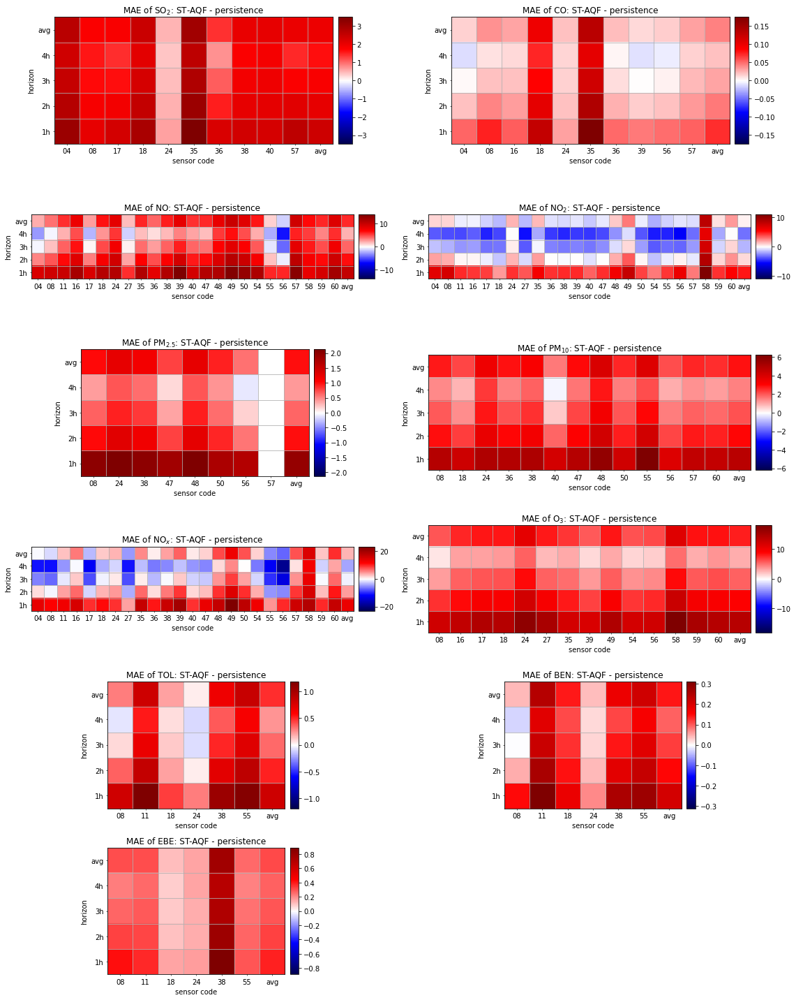

In [124]:
methods = ['nearest']
scalings = ['stand']
l.set_experiment('experiment-01')
fig, axs = plt.subplots(6, 2)
axs = axs.ravel()
fig.set_size_inches(16, 20)

for id_v in range(11):
    vc = list(l.vc_map.keys())[id_v]
    vn = l.vc_map[vc]
    for method in methods:
        for scaling in scalings:
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(scaling, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                mae1 = h5_in.root._v_attrs['mae_mod']
            mod_name = 'persistence_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep100'.format(scaling, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                mae2 = h5_in.root._v_attrs['mae_mod']
            arr = (mae1[:,l.vi_si_map[id_v],id_v] - mae2[:,l.vi_si_map[id_v],id_v])
            arr = np.hstack([arr, np.expand_dims(np.nanmean(arr, axis=1), axis=1)])
            arr = np.vstack([arr, np.nanmean(arr, axis=0)])
            divider = make_axes_locatable(axs[id_v])
            cax = divider.append_axes('right', size='5%', pad=0.1)
            v_val = np.nanmax(np.abs(arr))
            im = axs[id_v].imshow(arr, vmin=-v_val, vmax=v_val, origin='lower', cmap='seismic')
            fig.colorbar(im, cax=cax, orientation='vertical')
            axs[id_v].set_title('MAE of {}: {} - {}'.format(l.vc_map_pretty[list(l.vc_map.keys())[id_v]], 'ST-AQF', 'persistence'))
            axs[id_v].set_xlabel('sensor code')
            axs[id_v].set_ylabel('horizon')
            prettify_ax(axs[id_v], [list(l.sc_map.keys())[si] for si in l.vi_si_map[id_v]] + ['avg'],
                        ['{}h'.format(h+1) for h in range(l.n_y)] + ['avg'])
    if np.isnan(arr[0, :]).sum() > 0:
        sidx = [l.vi_si_map[id_v][i] for i in np.argwhere(np.isnan(arr[0, :]))[0]]
        sns = [list(l.sc_map.keys())[i] for i in sidx]
        print('{} (idx {}) has no error at sensor {} (idx {})'.format(vn, id_v,sns, sidx))
axs[11].set_axis_off()
plt.tight_layout()
plt.show()

RMSE:

<ipython-input-125-5a895f2d5770>:26: RuntimeWarning: Mean of empty slice
  arr = np.vstack([arr, np.nanmean(arr, axis=0)])


PM25 (idx 4) has no error at sensor ['57'] (idx [20])


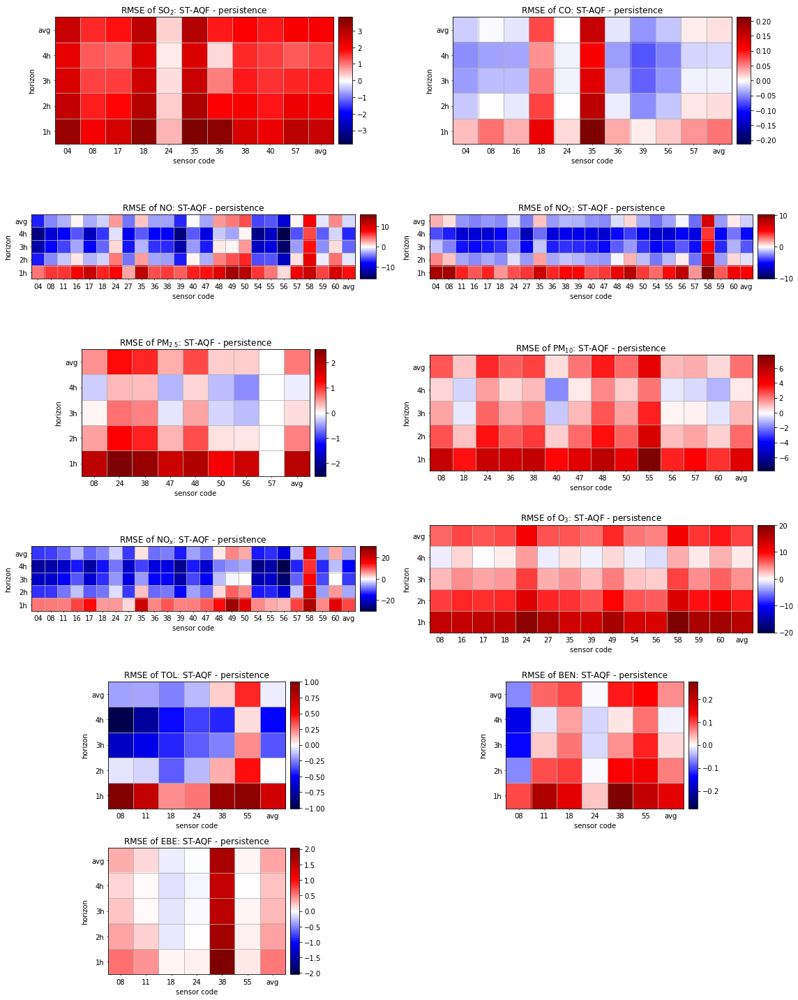

In [125]:
methods = ['nearest']
scalings = ['stand']
l.set_experiment('experiment-01')
fig, axs = plt.subplots(6, 2)
axs = axs.ravel()
fig.set_size_inches(16, 20)

for id_v in range(11):
    vc = list(l.vc_map.keys())[id_v]
    vn = l.vc_map[vc]
    for method in methods:
        for scaling in scalings:
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(scaling, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                rmse1 = h5_in.root._v_attrs['rmse_mod']
            mod_name = 'persistence_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep100'.format(scaling, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                rmse2 = h5_in.root._v_attrs['rmse_mod']
            axs[id_v].imshow((rmse1[:,l.vi_si_map[id_v],id_v] - rmse2[:,l.vi_si_map[id_v],id_v]),
                                   vmin=-rmse_d[id_v], vmax=rmse_d[id_v], 
                                   origin='lower', cmap='seismic')
            arr = (rmse1[:,l.vi_si_map[id_v],id_v] - rmse2[:,l.vi_si_map[id_v],id_v])
            arr = np.hstack([arr, np.expand_dims(np.nanmean(arr, axis=1), axis=1)])
            arr = np.vstack([arr, np.nanmean(arr, axis=0)])
            divider = make_axes_locatable(axs[id_v])
            cax = divider.append_axes('right', size='5%', pad=0.1)
            v_val = np.nanmax(np.abs(arr))
            im = axs[id_v].imshow(arr, vmin=-v_val, vmax=v_val, origin='lower', cmap='seismic')
            fig.colorbar(im, cax=cax, orientation='vertical')
            axs[id_v].set_title('RMSE of {}: {} - {}'.format(l.vc_map_pretty[list(l.vc_map.keys())[id_v]], 'ST-AQF', 'persistence'))
            axs[id_v].set_xlabel('sensor code')
            axs[id_v].set_ylabel('horizon')
            prettify_ax(axs[id_v], [list(l.sc_map.keys())[si] for si in l.vi_si_map[id_v]] + ['avg'],
                        ['{}h'.format(h+1) for h in range(l.n_y)] + ['avg'])
    if np.isnan(arr[0, :]).sum() > 0:
        sidx = [l.vi_si_map[id_v][i] for i in np.argwhere(np.isnan(arr[0, :]))[0]]
        sns = [list(l.sc_map.keys())[i] for i in sidx]
        print('{} (idx {}) has no error at sensor {} (idx {})'.format(vn, id_v,sns, sidx))
axs[11].set_axis_off()
plt.tight_layout()
plt.show()

### Linear

MAE:

<ipython-input-126-719484537516>:23: RuntimeWarning: Mean of empty slice
  arr = np.vstack([arr, np.nanmean(arr, axis=0)])


PM25 (idx 4) has no error at sensor ['57'] (idx [20])


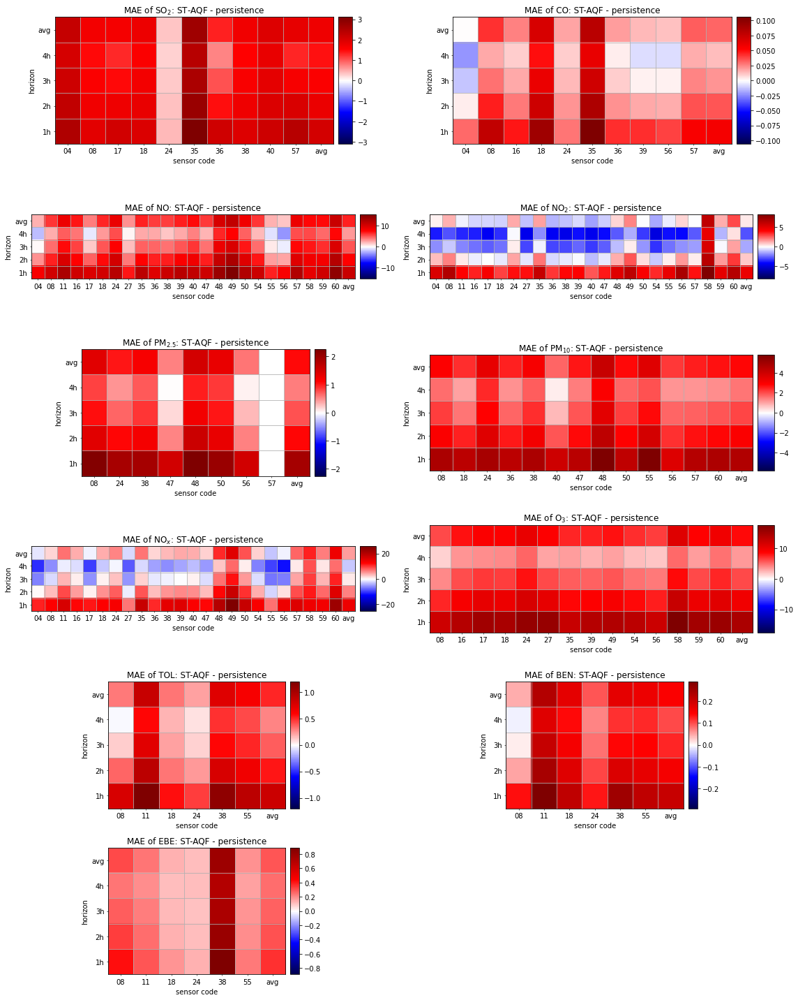

In [126]:
methods = ['linear']
scalings = ['stand']
l.set_experiment('experiment-01')
fig, axs = plt.subplots(6, 2)
axs = axs.ravel()
fig.set_size_inches(16, 20)

for id_v in range(11):
    vc = list(l.vc_map.keys())[id_v]
    vn = l.vc_map[vc]
    for method in methods:
        for scaling in scalings:
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(scaling, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                mae1 = h5_in.root._v_attrs['mae_mod']
            mod_name = 'persistence_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep100'.format(scaling, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                mae2 = h5_in.root._v_attrs['mae_mod']
            arr = (mae1[:,l.vi_si_map[id_v],id_v] - mae2[:,l.vi_si_map[id_v],id_v])
            arr = np.hstack([arr, np.expand_dims(np.nanmean(arr, axis=1), axis=1)])
            arr = np.vstack([arr, np.nanmean(arr, axis=0)])
            divider = make_axes_locatable(axs[id_v])
            cax = divider.append_axes('right', size='5%', pad=0.1)
            v_val = np.nanmax(np.abs(arr))
            im = axs[id_v].imshow(arr, vmin=-v_val, vmax=v_val, origin='lower', cmap='seismic')
            fig.colorbar(im, cax=cax, orientation='vertical')
            axs[id_v].set_title('MAE of {}: {} - {}'.format(l.vc_map_pretty[list(l.vc_map.keys())[id_v]], 'ST-AQF', 'persistence'))
            axs[id_v].set_xlabel('sensor code')
            axs[id_v].set_ylabel('horizon')
            prettify_ax(axs[id_v], [list(l.sc_map.keys())[si] for si in l.vi_si_map[id_v]] + ['avg'],
                        ['{}h'.format(h+1) for h in range(l.n_y)] + ['avg'])
    if np.isnan(arr[0, :]).sum() > 0:
        sidx = [l.vi_si_map[id_v][i] for i in np.argwhere(np.isnan(arr[0, :]))[0]]
        sns = [list(l.sc_map.keys())[i] for i in sidx]
        print('{} (idx {}) has no error at sensor {} (idx {})'.format(vn, id_v,sns, sidx))
axs[11].set_axis_off()
plt.tight_layout()
plt.show()

RMSE:

<ipython-input-127-3e23f00cfd51>:26: RuntimeWarning: Mean of empty slice
  arr = np.vstack([arr, np.nanmean(arr, axis=0)])


PM25 (idx 4) has no error at sensor ['57'] (idx [20])


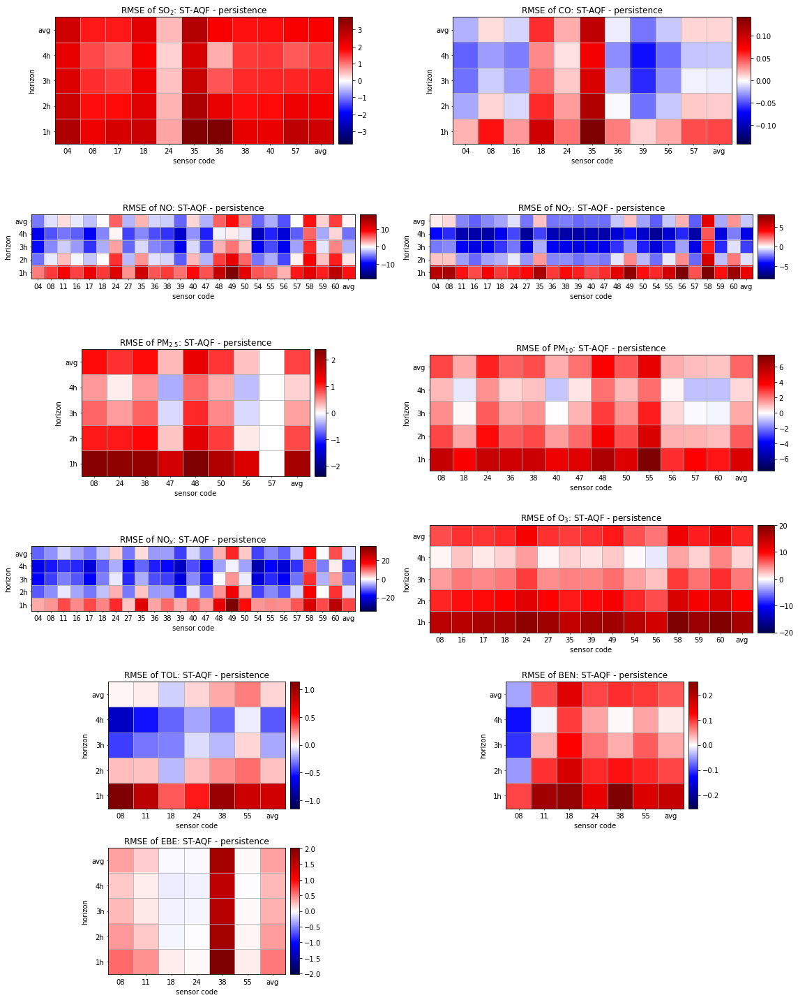

In [127]:
methods = ['linear']
scalings = ['stand']
l.set_experiment('experiment-01')
fig, axs = plt.subplots(6, 2)
axs = axs.ravel()
fig.set_size_inches(16, 20)

for id_v in range(11):
    vc = list(l.vc_map.keys())[id_v]
    vn = l.vc_map[vc]
    for method in methods:
        for scaling in scalings:
            mod_name = 'ST_AQF_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep075'.format(scaling, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                rmse1 = h5_in.root._v_attrs['rmse_mod']
            mod_name = 'persistence_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep100'.format(scaling, method)
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            with tb.open_file(fname, mode='r') as h5_in:
                rmse2 = h5_in.root._v_attrs['rmse_mod']
            axs[id_v].imshow((rmse1[:,l.vi_si_map[id_v],id_v] - rmse2[:,l.vi_si_map[id_v],id_v]),
                                   vmin=-rmse_d[id_v], vmax=rmse_d[id_v], 
                                   origin='lower', cmap='seismic')
            arr = (rmse1[:,l.vi_si_map[id_v],id_v] - rmse2[:,l.vi_si_map[id_v],id_v])
            arr = np.hstack([arr, np.expand_dims(np.nanmean(arr, axis=1), axis=1)])
            arr = np.vstack([arr, np.nanmean(arr, axis=0)])
            divider = make_axes_locatable(axs[id_v])
            cax = divider.append_axes('right', size='5%', pad=0.1)
            v_val = np.nanmax(np.abs(arr))
            im = axs[id_v].imshow(arr, vmin=-v_val, vmax=v_val, origin='lower', cmap='seismic')
            fig.colorbar(im, cax=cax, orientation='vertical')
            axs[id_v].set_title('RMSE of {}: {} - {}'.format(l.vc_map_pretty[list(l.vc_map.keys())[id_v]], 'ST-AQF', 'persistence'))
            axs[id_v].set_xlabel('sensor code')
            axs[id_v].set_ylabel('horizon')
            prettify_ax(axs[id_v], [list(l.sc_map.keys())[si] for si in l.vi_si_map[id_v]] + ['avg'],
                        ['{}h'.format(h+1) for h in range(l.n_y)] + ['avg'])
    if np.isnan(arr[0, :]).sum() > 0:
        sidx = [l.vi_si_map[id_v][i] for i in np.argwhere(np.isnan(arr[0, :]))[0]]
        sns = [list(l.sc_map.keys())[i] for i in sidx]
        print('{} (idx {}) has no error at sensor {} (idx {})'.format(vn, id_v,sns, sidx))
axs[11].set_axis_off()
plt.tight_layout()
plt.show()

# Compare optimizer, loss and lr

## Table comparison

MAE:

In [79]:
l.set_experiment('compare-opt-loss-lr')

with pd.ExcelWriter('./results-analysis/compare-opt-loss-lr-MAE.xlsx', mode='w') as writer:
    for id_v in range(11):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'opt', 'MAE h0', 'MAE h1', 'MAE h2', 'MAE h3', 'avg'])
        #df.index.set_names([list(l.vn_map.keys())[id_v], '', ''], inplace=True)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname): 
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['mae_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'MAE h'+str(h)] = np.nanmean(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr', 'opt']] = loss, lr, opt
            df.loc[id_m, 'avg'] = df.iloc[id_m, 3:7].mean()
        df.set_index(['loss', 'lr', 'opt'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index.set_names([vc, '', ''], inplace=True)
        display(df)
        df.to_excel(writer, sheet_name=vc)

MAE h0    MAE h1    MAE h2    MAE h3       avg
SO2                                                                    
mse  0.001000 RMSprop  3.035297  3.033895  3.055607  3.088222  3.053255
     0.000100 RMSprop  3.027667  3.039660  3.069803  3.108057  3.061297
              Adamax   3.007858  3.025063  3.091680  3.131049  3.063913
              Adam     3.041102  3.045043  3.076984  3.117888  3.070254
     0.000005 RMSprop  3.025636  3.059082  3.104744  3.136120  3.081395
...                         ...       ...       ...       ...       ...
mae  0.001000 Ftrl     3.371863  3.372080  3.372265  3.372381  3.372147
msle 0.001000 SGD      3.378625  3.354057  3.380918  3.384127  3.374432
mae  0.001000 SGD      3.412005  3.400714  3.409009  3.410495  3.408056
NaN  NaN      NaN           NaN       NaN       NaN       NaN       NaN
              NaN           NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

MAE h0    MAE h1    MAE h2    MAE h3       avg
CO                                                                    
mae  0.001000 Adamax  0.110921  0.115809  0.123365  0.130644  0.120184
     0.000100 Nadam   0.109674  0.115472  0.123801  0.132229  0.120294
              Adam    0.111091  0.115798  0.123709  0.131176  0.120443
mse  0.001000 Adamax  0.113214  0.116999  0.123967  0.131874  0.121514
mae  0.001000 Adam    0.111686  0.117972  0.126215  0.133578  0.122363
...                        ...       ...       ...       ...       ...
msle 0.001000 Ftrl    0.170637  0.170686  0.170730  0.170762  0.170704
     0.000005 Ftrl    0.170637  0.170686  0.170730  0.170762  0.170704
     0.001000 SGD     0.171995  0.172043  0.172103  0.173186  0.172332
NaN  NaN      NaN          NaN       NaN       NaN       NaN       NaN
              NaN          NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

MAE h0     MAE h1     MAE h2     MAE h3        avg
NO                                                                          
mae  0.000100 Nadam    11.605497  12.272600  13.235355  14.236897  12.837587
              Adam     11.932671  12.597699  13.300751  14.288754  13.029969
     0.001000 Adamax   12.306924  12.727741  13.506436  14.325983  13.216771
              Adam     12.079826  12.777781  13.741080  14.654528  13.313304
     0.000100 RMSprop  12.422539  12.926443  13.643593  14.598148  13.397681
...                          ...        ...        ...        ...        ...
msle 0.000010 Ftrl     24.472275  24.480749  24.488202  24.494109  24.483834
     0.000005 Ftrl     24.472297  24.480771  24.488224  24.494132  24.483856
     0.001000 SGD      24.948580  24.544364  25.133857  24.990357  24.904289
NaN  NaN      NaN            NaN        NaN        NaN        NaN        NaN
              NaN            NaN        NaN        NaN        NaN        NaN

[98 rows x 5 columns]

MAE h0     MAE h1     MAE h2     MAE h3        avg
NO2                                                                         
mae  0.001000 Adam     11.724847  13.519459  15.508373  17.164667  14.479337
              Nadam    11.627815  13.593187  15.827082  17.652603  14.675172
     0.000100 Adam     12.423850  13.790063  15.566514  17.182611  14.740759
     0.001000 Adamax   12.597961  13.882154  15.575060  17.159453  14.803657
     0.000100 Nadam    12.610729  14.025874  15.734895  17.191767  14.890816
...                          ...        ...        ...        ...        ...
msle 0.000005 Ftrl     23.222767  23.224860  23.226650  23.227881  23.225539
     0.001000 Adagrad  23.131116  23.255020  23.290289  23.335074  23.252875
              SGD      23.679664  23.761124  23.734409  23.693844  23.717260
NaN  NaN      NaN            NaN        NaN        NaN        NaN        NaN
              NaN            NaN        NaN        NaN        NaN        NaN

[98 rows x 5 columns]

MAE h0    MAE h1    MAE h2    MAE h3       avg
PM25                                                                   
mae  0.000100 RMSprop  4.452344  4.491519  4.640590  4.843441  4.606974
     0.000010 Adamax   4.332343  4.509965  4.733353  4.880527  4.614047
     0.000100 Nadam    4.507108  4.518845  4.662219  4.863214  4.637847
     0.001000 Adamax   4.588742  4.579089  4.680774  4.840594  4.672300
              RMSprop  4.558224  4.572068  4.706181  4.898672  4.683786
...                         ...       ...       ...       ...       ...
msle 0.000005 Ftrl     6.138106  6.140166  6.141955  6.143818  6.141011
     0.001000 RMSprop  6.014784  6.151225  6.207730  6.268154  6.160473
              SGD      6.338713  6.318742  6.275566  6.311463  6.311121
NaN  NaN      NaN           NaN       NaN       NaN       NaN       NaN
              NaN           NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

MAE h0     MAE h1     MAE h2     MAE h3        avg
PM10                                                                       
mae  0.00010 RMSprop   8.493796   8.592970   8.871936   9.227995   8.796674
     0.00100 RMSprop   8.562767   8.622582   8.890510   9.228877   8.826184
             Adamax    8.655146   8.682438   8.901091   9.189258   8.856983
             Adam      8.621986   8.689142   8.930450   9.208873   8.862613
     0.00010 Nadam     8.598850   8.677145   8.943416   9.272066   8.872869
...                         ...        ...        ...        ...        ...
msle 0.00100 Adamax   11.958283  12.000721  12.120785  12.238545  12.079583
             Nadam    11.952497  11.999792  12.141074  12.275581  12.092236
     0.00001 Adam     10.942093  12.792070  12.875549  12.947510  12.389305
NaN  NaN     NaN            NaN        NaN        NaN        NaN        NaN
             NaN            NaN        NaN        NaN        NaN        NaN

[98 rows x 5 columns]

MAE h0     MAE h1     MAE h2     MAE h3        avg
NOx                                                                         
mae  0.000100 Nadam    25.145794  28.565627  32.427004  36.185035  30.580865
              Adam     25.679777  28.432446  32.522286  36.322783  30.739323
     0.001000 Adam     25.042042  28.858345  33.283861  37.028127  31.053094
              Adamax   26.469386  29.268970  33.000405  36.417105  31.288966
     0.000100 RMSprop  26.447223  29.798921  34.002835  37.276442  31.881355
...                          ...        ...        ...        ...        ...
msle 0.001000 Ftrl     56.676467  56.691696  56.704953  56.715381  56.697124
     0.000005 Ftrl     56.676534  56.691764  56.705021  56.715449  56.697192
     0.001000 SGD      57.574368  58.097401  58.108450  57.554111  57.833582
NaN  NaN      NaN            NaN        NaN        NaN        NaN        NaN
              NaN            NaN        NaN        NaN        NaN        NaN

[98 rows x 5 columns]

MAE h0     MAE h1     MAE h2     MAE h3        avg
O3                                                                           
msle 0.000010 Nadam     17.074217  19.874216  21.795549  23.093786  20.459442
mae  0.001000 Adamax    19.992957  20.998314  22.392537  23.562996  21.736701
msle 0.000100 Adam      19.874489  20.940827  22.367002  23.766994  21.737328
     0.001000 Adam      19.593031  20.812428  22.597205  24.209582  21.803062
     0.000005 Adam      19.228295  21.593141  22.823493  23.746218  21.847787
...                           ...        ...        ...        ...        ...
     0.001000 SGD       28.167053  28.246252  28.417720  28.359231  28.297564
mae  0.000005 Adadelta  28.395471  28.265569  28.284507  28.265165  28.302678
msle 0.000010 RMSprop   29.270135  29.335677  29.368392  29.194771  29.292244
NaN  NaN      NaN             NaN        NaN        NaN        NaN        NaN
              NaN             NaN        NaN        NaN        NaN        NaN

[98 rows x 5 columns]

MAE h0    MAE h1    MAE h2    MAE h3       avg
TOL                                                                    
mae  0.001000 Adamax   1.095035  1.097598  1.166696  1.261403  1.155183
     0.000100 RMSprop  1.065736  1.093344  1.190892  1.308753  1.164681
              Adamax   1.051833  1.103054  1.215108  1.330159  1.175038
              Nadam    1.109386  1.128729  1.216839  1.332859  1.196954
     0.001000 Adam     1.130205  1.147240  1.225781  1.320133  1.205840
...                         ...       ...       ...       ...       ...
msle 0.000005 Ftrl     2.089878  2.089948  2.089976  2.090022  2.089956
     0.001000 Adagrad  2.065371  2.116277  2.118464  2.103044  2.100789
              SGD      2.156662  2.203976  2.148348  2.177113  2.171525
NaN  NaN      NaN           NaN       NaN       NaN       NaN       NaN
              NaN           NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

MAE h0    MAE h1    MAE h2    MAE h3       avg
BEN                                                                  
mae  0.0001 Adamax   0.204446  0.217089  0.245749  0.266201  0.233371
            Nadam    0.214583  0.219969  0.242230  0.266944  0.235932
            Adam     0.217850  0.222052  0.242578  0.267369  0.237462
     0.0010 Adamax   0.225787  0.228717  0.244324  0.262204  0.240258
     0.0001 RMSprop  0.218985  0.225457  0.248959  0.273936  0.241834
...                       ...       ...       ...       ...       ...
msle 0.0010 Adagrad  0.441698  0.446264  0.443914  0.446614  0.444622
            RMSprop  0.436621  0.437858  0.460321  0.446514  0.445328
            SGD      0.470065  0.465786  0.454937  0.461961  0.463187
NaN  NaN    NaN           NaN       NaN       NaN       NaN       NaN
            NaN           NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

MAE h0    MAE h1    MAE h2    MAE h3       avg
EBE                                                                  
mae  0.0010 Adamax   0.420265  0.419413  0.428156  0.442142  0.427494
            RMSprop  0.422348  0.424147  0.439452  0.461501  0.436862
            Adam     0.435742  0.436724  0.443706  0.452609  0.442195
     0.0001 Nadam    0.450820  0.453586  0.468562  0.489105  0.465518
            Adam     0.451645  0.453756  0.470085  0.489007  0.466123
...                       ...       ...       ...       ...       ...
msle 0.0010 Adagrad  0.673259  0.679954  0.675027  0.678856  0.676774
     0.0001 Nadam    0.670894  0.674405  0.680294  0.684725  0.677579
     0.0010 SGD      0.683984  0.698314  0.690070  0.692363  0.691183
NaN  NaN    NaN           NaN       NaN       NaN       NaN       NaN
            NaN           NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

RMSE:

In [80]:
l.set_experiment('compare-opt-loss-lr')

with pd.ExcelWriter('./results-analysis/compare-opt-loss-lr-RMSE.xlsx', mode='w') as writer:
    for id_v in range(11):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'opt', 'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        #df.index.set_names([list(l.vn_map.keys())[id_v], '', ''], inplace=True)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname): 
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmean(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr', 'opt']] = loss, lr, opt
            df.loc[id_m, 'avg'] = df.iloc[id_m, 3:7].mean()
        df.set_index(['loss', 'lr', 'opt'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index.set_names([vc, '', ''], inplace=True)
        display(df)    
        df.to_excel(writer, sheet_name=vc)

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
SO2                                                                    
mse  0.001000 RMSprop  4.180513  4.182166  4.227482  4.294562  4.221181
msle 0.001000 Nadam    4.154273  4.177462  4.242821  4.318420  4.223244
              RMSprop  4.204891  4.207167  4.244408  4.295976  4.238110
mse  0.000100 Adamax   4.157190  4.191517  4.296025  4.371554  4.254072
              RMSprop  4.190865  4.222557  4.278762  4.351406  4.260898
...                         ...       ...       ...       ...       ...
mae  0.000005 Ftrl     4.721447  4.721743  4.722020  4.722202  4.721853
     0.001000 Ftrl     4.721447  4.721743  4.722020  4.722203  4.721853
              SGD      4.811300  4.799151  4.813709  4.812110  4.809067
NaN  NaN      NaN           NaN       NaN       NaN       NaN       NaN
              NaN           NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
CO                                                                     
mse  0.001000 Adamax   0.165271  0.173986  0.189386  0.203458  0.183025
     0.000100 Nadam    0.166490  0.176683  0.192702  0.205669  0.185386
              Adam     0.169413  0.178498  0.194220  0.207045  0.187294
mae  0.001000 Adamax   0.168843  0.179395  0.195101  0.208428  0.187942
mse  0.000100 RMSprop  0.168151  0.180446  0.196266  0.208688  0.188388
...                         ...       ...       ...       ...       ...
msle 0.001000 Ftrl     0.239050  0.239190  0.239303  0.239377  0.239230
     0.000005 Ftrl     0.239050  0.239190  0.239303  0.239377  0.239230
     0.001000 SGD      0.239624  0.239579  0.240382  0.240897  0.240120
NaN  NaN      NaN           NaN       NaN       NaN       NaN       NaN
              NaN           NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

RMSE h0    RMSE h1    RMSE h2    RMSE h3        avg
NO                                                                          
mse  0.001000 Adamax   24.981730  26.482891  29.027120  31.269461  27.940301
     0.000100 Nadam    25.100591  26.950661  29.627629  31.674562  28.338361
msle 0.001000 Adamax   24.423923  26.980412  30.132472  32.508019  28.511207
mae  0.001000 RMSprop  25.383113  27.270627  29.927546  32.181268  28.690638
msle 0.000100 Nadam    25.169927  27.427096  30.227505  32.409151  28.808420
...                          ...        ...        ...        ...        ...
     0.000010 Ftrl     37.581889  37.606589  37.627024  37.643987  37.614872
     0.000005 Ftrl     37.581898  37.606597  37.627033  37.643996  37.614881
     0.001000 SGD      37.789014  37.629076  37.861084  37.885969  37.791286
NaN  NaN      NaN            NaN        NaN        NaN        NaN        NaN
              NaN            NaN        NaN        NaN        NaN        NaN

[98 rows x 5 columns]

RMSE h0    RMSE h1    RMSE h2    RMSE h3        avg
NO2                                                                         
mse  0.001000 RMSprop  17.597853  19.206269  21.677136  23.777764  20.564755
mae  0.001000 Nadam    16.058247  19.256765  22.437154  24.672148  20.606078
mse  0.001000 Nadam    16.755896  19.362818  22.136981  24.194438  20.612533
mae  0.001000 Adam     16.688097  19.615277  22.555539  24.684278  20.885798
mse  0.001000 Adamax   17.881897  19.668274  22.070285  23.966805  20.896815
...                          ...        ...        ...        ...        ...
msle 0.000005 Ftrl     28.612279  28.615968  28.618745  28.620498  28.616873
     0.001000 Adagrad  28.470077  28.625022  28.673216  28.729689  28.624501
              SGD      28.897317  28.961981  28.958235  28.892161  28.927423
NaN  NaN      NaN            NaN        NaN        NaN        NaN        NaN
              NaN            NaN        NaN        NaN        NaN        NaN

[98 rows x 5 columns]

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
PM25                                                                   
mse  0.000100 RMSprop  6.204376  6.274206  6.506729  6.750479  6.433948
mae  0.000100 Nadam    6.252635  6.300007  6.499252  6.732402  6.446074
              RMSprop  6.242397  6.310984  6.513124  6.738015  6.451130
mse  0.001000 Adamax   6.295481  6.319866  6.494191  6.714993  6.456132
     0.000100 Adam     6.290918  6.321937  6.514913  6.729686  6.464364
...                         ...       ...       ...       ...       ...
msle 0.001000 Ftrl     7.901123  7.906010  7.909860  7.913964  7.907739
     0.000005 Ftrl     7.901124  7.906011  7.909861  7.913966  7.907740
     0.001000 SGD      8.039811  8.031651  7.967987  8.005845  8.011324
NaN  NaN      NaN           NaN       NaN       NaN       NaN       NaN
              NaN           NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

RMSE h0    RMSE h1    RMSE h2    RMSE h3        avg
PM10                                                                       
mse  0.00100 Nadam    12.568907  12.741648  13.095793  13.450803  12.964288
             RMSprop  12.798147  12.839580  13.081340  13.380392  13.024865
             Adamax   12.717033  12.822384  13.114216  13.469199  13.030708
     0.00010 RMSprop  12.655683  12.802675  13.151002  13.519023  13.032096
             Adam     12.700161  12.810075  13.136247  13.488843  13.033831
...                         ...        ...        ...        ...        ...
msle 0.00100 Adamax   14.768968  14.853419  15.043023  15.210206  14.968904
             SGD      15.210100  15.191749  15.186747  15.197467  15.196516
     0.00001 Adam     14.258454  16.907642  16.980404  16.953659  16.275040
NaN  NaN     NaN            NaN        NaN        NaN        NaN        NaN
             NaN            NaN        NaN        NaN        NaN        NaN

[98 rows x 5 columns]

RMSE h0    RMSE h1    RMSE h2    RMSE h3        avg
NOx                                                                        
mse  0.001000 Adamax  46.406395  51.345089  58.578776  64.879616  55.302469
     0.000100 Nadam   47.115795  52.437143  59.910792  65.735761  56.299873
mae  0.001000 Adam    46.715804  53.206303  60.845348  66.693273  56.865182
     0.000100 Adam    48.148046  53.372576  60.378679  66.079378  56.994670
              Nadam   47.783937  53.626248  60.499227  66.094705  57.001029
...                         ...        ...        ...        ...        ...
msle 0.001000 Ftrl    80.818385  80.859381  80.892519  80.918752  80.872259
     0.000005 Ftrl    80.818414  80.859410  80.892548  80.918781  80.872288
     0.001000 SGD     81.205147  81.561720  81.665685  81.319721  81.438068
NaN  NaN      NaN           NaN        NaN        NaN        NaN        NaN
              NaN           NaN        NaN        NaN        NaN        NaN

[98 rows x 5 columns]

RMSE h0    RMSE h1    RMSE h2    RMSE h3        avg
O3                                                                          
msle 0.000010 Nadam    22.048832  24.743826  27.484739  29.077071  25.838617
mae  0.001000 Adamax   25.487917  26.502563  28.004467  29.295117  27.322516
msle 0.000005 Adam     24.293962  26.928565  28.847107  29.949235  27.504717
mae  0.000100 Adam     25.773710  26.698646  28.074396  29.475058  27.505453
mse  0.001000 Adam     26.030369  27.044791  28.486768  29.791763  27.838423
...                          ...        ...        ...        ...        ...
msle 0.000100 RMSprop  40.292052  39.871068  38.275603  36.157464  38.649046
     0.001000 Nadam    43.874938  44.706048  44.131124  42.625570  43.834420
              Adamax   49.455177  49.468195  48.232138  46.302957  48.364617
NaN  NaN      NaN            NaN        NaN        NaN        NaN        NaN
              NaN            NaN        NaN        NaN        NaN        NaN

[98 rows x 5 columns]

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
TOL                                                                    
mae  0.000100 RMSprop  2.330100  2.371605  2.487447  2.614212  2.450841
     0.001000 Adamax   2.357079  2.374883  2.480230  2.602686  2.453719
     0.000100 Adamax   2.309651  2.376405  2.506528  2.624612  2.454299
              Nadam    2.347559  2.383912  2.499571  2.628721  2.464941
     0.001000 Adam     2.363308  2.393353  2.503179  2.619817  2.469914
...                         ...       ...       ...       ...       ...
msle 0.000005 Ftrl     3.153010  3.153108  3.153133  3.153223  3.153118
     0.001000 Adagrad  3.114144  3.184966  3.178965  3.169570  3.161912
              SGD      3.193058  3.229416  3.189137  3.198935  3.202636
NaN  NaN      NaN           NaN       NaN       NaN       NaN       NaN
              NaN           NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
BEN                                                                    
mae  0.000100 Adamax   0.332513  0.354406  0.392761  0.424260  0.375985
              Nadam    0.343618  0.353919  0.389393  0.425145  0.378019
              Adam     0.349206  0.356264  0.389940  0.425391  0.380201
              RMSprop  0.348980  0.361617  0.396435  0.430839  0.384468
     0.001000 Adamax   0.359012  0.364836  0.394208  0.425158  0.385804
...                         ...       ...       ...       ...       ...
msle 0.000005 Ftrl     0.558071  0.558268  0.558408  0.558590  0.558334
     0.001000 Adagrad  0.557757  0.566200  0.561368  0.566288  0.562903
              SGD      0.581851  0.579377  0.566796  0.573057  0.575270
NaN  NaN      NaN           NaN       NaN       NaN       NaN       NaN
              NaN           NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

RMSE h0   RMSE h1   RMSE h2   RMSE h3       avg
EBE                                                                   
mae  0.00100 Adamax   1.086634  1.089931  1.096772  1.105908  1.094811
             RMSprop  1.091835  1.095201  1.104978  1.116082  1.102024
             Adam     1.098028  1.101368  1.109691  1.116590  1.106419
     0.00010 Nadam    1.101945  1.105667  1.115145  1.124812  1.111892
             Adamax   1.099090  1.105906  1.115000  1.128326  1.112081
...                        ...       ...       ...       ...       ...
msle 0.00001 Ftrl     1.211892  1.211897  1.211898  1.211909  1.211899
     0.00100 Adagrad  1.209114  1.214064  1.213820  1.211462  1.212115
             SGD      1.215703  1.220674  1.217651  1.221790  1.218954
NaN  NaN     NaN           NaN       NaN       NaN       NaN       NaN
             NaN           NaN       NaN       NaN       NaN       NaN

[98 rows x 5 columns]

## Combine

In [81]:
with tb.open_file(l.dataset_d['time_series'].replace('raw', 'stand'), mode='r') as h5_file:
    vc_mean_map = h5_file.root._v_attrs['vc_mean_map']
    #vc_std_map = h5_file.root._v_attrs['vc_std_map']

MAE:

In [82]:
l.set_experiment('compare-opt-loss-lr')
l_df = list()

with pd.ExcelWriter('./results-analysis/compare-opt-loss-lr-MAE-norm.xlsx', mode='w') as writer:
    for id_v in range(11):
        vn = list(l.vn_map.keys())[id_v]
        vc = list(l.vc_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'opt', 'MAE h0', 'MAE h1', 'MAE h2', 'MAE h3', 'avg'])
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname): 
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                mae = h5_in.root._v_attrs['mae_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'MAE h'+str(h)] = np.nanmean(mae[h, :, id_v])
            df.loc[id_m, ['loss', 'lr', 'opt']] = loss, lr, opt
        df.set_index(['loss', 'lr', 'opt'], inplace=True)
        df.sort_index(inplace=True)
        df.index.set_names([vn, '', ''], inplace=True)
        df = df / vc_mean_map[vc]
        l_df.append(df)
    for id_v in range(1, 11):
        l_df[0] += l_df[id_v]
    l_df[0].index.set_names(['combined', '', ''], inplace=True)
    l_df[0].loc[:, 'avg'] = l_df[0].iloc[:, 0:4].mean(axis=1)
    l_df[0].sort_values('avg', inplace=True)
    l_df[0].to_excel(writer, sheet_name='norm')

RMSE:

In [84]:
l.set_experiment('compare-opt-loss-lr')
l_df = list()

with pd.ExcelWriter('./results-analysis/compare-opt-loss-lr-RMSE-norm.xlsx', mode='w') as writer:
    for id_v in range(11):
        vn = list(l.vn_map.keys())[id_v]
        vc = list(l.vc_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'opt', 'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname): 
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmean(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr', 'opt']] = loss, lr, opt
        df.set_index(['loss', 'lr', 'opt'], inplace=True)
        df.sort_index(inplace=True)
        df.index.set_names([vn, '', ''], inplace=True)
        df = df / vc_mean_map[vc]
        l_df.append(df)
    for id_v in range(1, 11):
        l_df[0] += l_df[id_v]
    l_df[0].index.set_names(['combined', '', ''], inplace=True)
    l_df[0].loc[:, 'avg'] = l_df[0].iloc[:, 0:4].mean(axis=1)
    l_df[0].sort_values('avg', inplace=True)
    l_df[0].to_excel(writer, sheet_name='norm')

# True vs predicted

## ST-AQF linear stand

In [5]:
def true_vs_pred(l, experiment, mod_name, vi, h=0, si=None, n_days=7, jump=0):
    l.set_experiment(experiment)
    fname = os.path.join(l.models_path, mod_name, 'pred_truth.h5')
    slc = slice(jump, jump + n_days * 24)
    with tb.open_file(fname, mode='r') as h5_in:
        preds = h5_in.root.preds[:]
        truth = h5_in.root.truth[:]
    
    if si is None:
        fig, axs = plt.subplots(8,3)
        axs = axs.ravel()
        fig.set_size_inches(18, 30)
        for si in range(24):
            axs[si].plot(preds[slc, h, si, vi], lw=3, label='pred')
            axs[si].plot(truth[slc, h, si, vi], lw=1, label='truth')
            for d in range(n_days+1):
                axs[si].axvline(d * 24, lw=1, c='gray', alpha=0.3)
            axs[si].legend()
            axs[si].set_title('{} at s{} - sensor index {}'.format(list(l.vn_map.keys())[vi],
                                                                   list(l.sc_map.keys())[si], si))
    else:
        fig, ax = plt.subplots(4, 1)
        fig.set_size_inches(18, 18)
        for h_i in range(l.n_y):
            ax[h_i].plot(preds[slc, h_i, si, vi], lw=5, label='pred')
            ax[h_i].plot(truth[slc, h_i, si, vi], lw=3, label='truth')
            for d in range(n_days + 1):
                ax[h_i].axvline(d * 24, lw=1, c='gray', alpha=0.3)
            ax[h_i].legend()
            ax[h_i].set_title('{} at s{} - sensor index {} - {}h'.format(list(l.vn_map.keys())[vi],
                                                                         list(l.sc_map.keys())[si], si, h_i+1))
    plt.show()

All sensors:

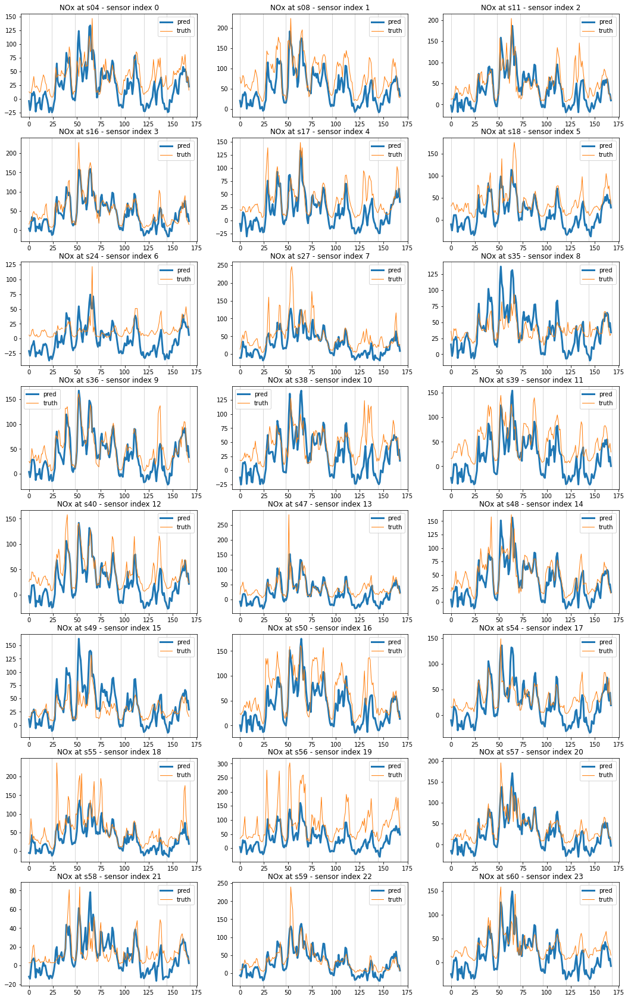

In [39]:
experiment = 'experiment-01'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 75
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep{:03}'.format(model, scaling, method, ep)
vi = 6
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

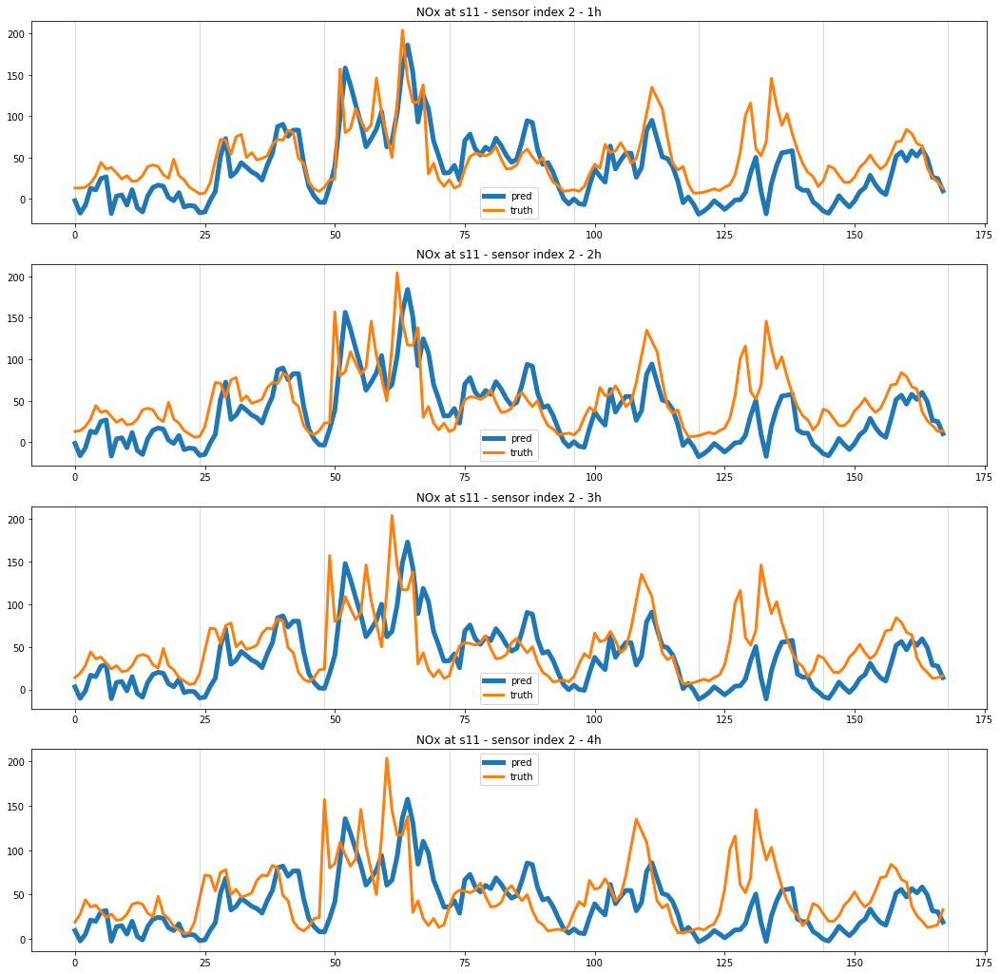

In [178]:
experiment = 'experiment-01'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 75
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_Nadam_mse_ep{:03}'.format(model, scaling, method, ep)
vi = 6
h = 0
si = 2

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

# Less variables

## NO$_2$

In [90]:
# ------------------------------ #
l.set_idx_v([3]) # --> Only NO2
# ------------------------------ #

### Table comparison

MAE:

In [47]:
l.set_experiment('less-variables')

with pd.ExcelWriter('./results-analysis/less-variables-MAE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'opt', 'ep', 'MAE h0', 'MAE h1', 'MAE h2', 'MAE h3', 'avg'])
        #df.index.set_names([list(l.vn_map.keys())[id_v], '', ''], inplace=True)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'O3' in mod_name or 'PM10' in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                mae = h5_in.root._v_attrs['mae_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                ep = h5_in.root._v_attrs['epochs']
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'MAE h'+str(h)] = np.nanmean(mae[h, :, id_v])
            df.loc[id_m, ['loss', 'lr', 'opt', 'ep']] = loss, lr, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 4:8].mean()
        df.set_index(['loss', 'lr', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index.set_names([vc, '', '', ''], inplace=True)
        display(df)
        df.to_excel(writer, sheet_name=vc)

MAE h0     MAE h1     MAE h2     MAE h3        avg
NO2                                                                         
mse 0.001 RMSprop 100  10.303373  12.496783  15.466402  17.992565  14.064781
          Nadam   25   12.483129  14.168259  16.876547  19.212115  15.685013
                  20   12.474460  14.392322  17.108563  19.392221  15.841891
NaN NaN   NaN     NaN        NaN        NaN        NaN        NaN        NaN
                  NaN        NaN        NaN        NaN        NaN        NaN

RMSE:

In [48]:
l.set_experiment('less-variables')

with pd.ExcelWriter('./results-analysis/less-variables-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'opt', 'ep', 'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        #df.index.set_names([list(l.vn_map.keys())[id_v], '', ''], inplace=True)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'O3' in mod_name or 'PM10' in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                ep = h5_in.root._v_attrs['epochs']
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmean(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr', 'opt', 'ep']] = loss, lr, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 4:8].mean()
        df.set_index(['loss', 'lr', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index.set_names([vc, '', '', ''], inplace=True)
        display(df)    
        df.to_excel(writer, sheet_name=vc)

RMSE h0    RMSE h1    RMSE h2    RMSE h3        avg
NO2                                                                         
mse 0.001 RMSprop 100  13.853707  17.320331  21.237691  24.039014  19.112686
          Nadam   25   16.511124  19.255482  22.846809  25.482677  21.024023
                  20   16.570942  19.556790  23.161804  25.777078  21.266653
NaN NaN   NaN     NaN        NaN        NaN        NaN        NaN        NaN
                  NaN        NaN        NaN        NaN        NaN        NaN

### True vs predicted

All sensors:

Exception ignored in: <function ZipFile.__del__ at 0x7fe5ffdff9d0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/zipfile.py", line 1821, in __del__
    self.close()
  File "/usr/local/lib/python3.8/zipfile.py", line 1838, in close
    self.fp.seek(self.start_dir)
ValueError: seek of closed file
Exception ignored in: <function ZipFile.__del__ at 0x7fe5ffdff9d0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/zipfile.py", line 1821, in __del__
    self.close()
  File "/usr/local/lib/python3.8/zipfile.py", line 1838, in close
    self.fp.seek(self.start_dir)
ValueError: seek of closed file


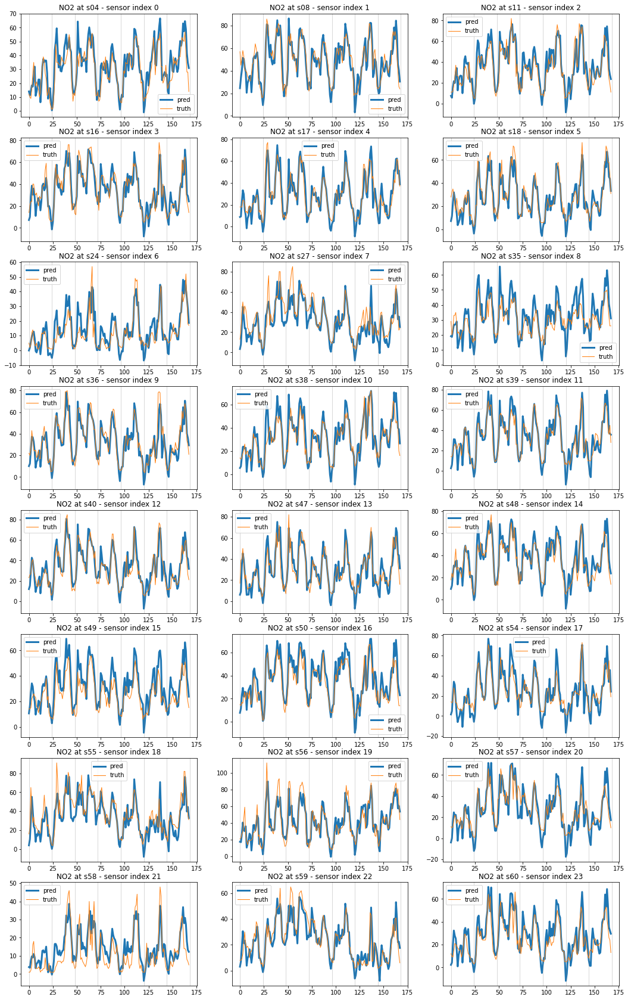

In [49]:
experiment = 'less-variables'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_RMSprop_ep{:03}_NO2'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

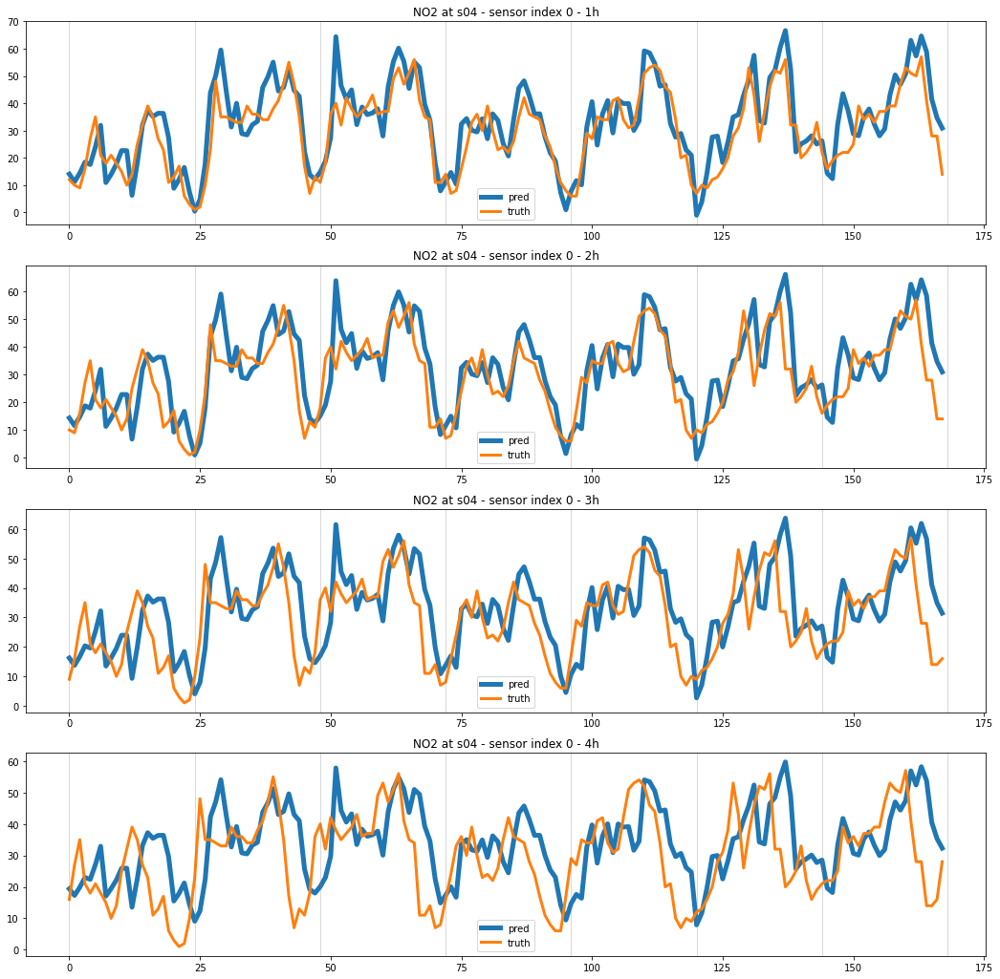

In [91]:
experiment = 'less-variables'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_RMSprop_ep{:03}_NO2'.format(model, scaling, method, ep)
vi = 0
si = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## O$_3$

In [52]:
# ------------------------------ #
l.set_idx_v([7]) # --> Only O3
# ------------------------------ #

### Table comparison

MAE:

In [55]:
l.set_experiment('less-variables')

with pd.ExcelWriter('./results-analysis/less-variables-MAE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'opt', 'ep', 'MAE h0', 'MAE h1', 'MAE h2', 'MAE h3', 'avg'])
        #df.index.set_names([list(l.vn_map.keys())[id_v], '', ''], inplace=True)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'NO2' in mod_name or 'ep02' in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                mae = h5_in.root._v_attrs['mae_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                ep = h5_in.root._v_attrs['epochs']
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'MAE h'+str(h)] = np.nanmean(mae[h, :, id_v])
            df.loc[id_m, ['loss', 'lr', 'opt', 'ep']] = loss, lr, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 4:8].mean()
        df.set_index(['loss', 'lr', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index.set_names([vc, '', '', ''], inplace=True)
        display(df)
        df.to_excel(writer, sheet_name=vc)

MAE h0     MAE h1    MAE h2     MAE h3        avg
O3                                                                        
mse 0.001 RMSprop 100  9.778967  11.853206  14.99018  18.006068  13.657106
NaN NaN   NaN     NaN       NaN        NaN       NaN        NaN        NaN
                  NaN       NaN        NaN       NaN        NaN        NaN
                  NaN       NaN        NaN       NaN        NaN        NaN
                  NaN       NaN        NaN       NaN        NaN        NaN

RMSE:

In [56]:
l.set_experiment('less-variables')

with pd.ExcelWriter('./results-analysis/less-variables-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'opt', 'ep', 'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        #df.index.set_names([list(l.vn_map.keys())[id_v], '', ''], inplace=True)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'NO2' in mod_name or 'ep02' in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                ep = h5_in.root._v_attrs['epochs']
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmean(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr', 'opt', 'ep']] = loss, lr, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 4:8].mean()
        df.set_index(['loss', 'lr', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index.set_names([vc, '', '', ''], inplace=True)
        display(df)    
        df.to_excel(writer, sheet_name=vc)

RMSE h0    RMSE h1    RMSE h2    RMSE h3        avg
O3                                                                          
mse 0.001 RMSprop 100  12.611519  15.586718  19.918903  23.973166  18.022576
NaN NaN   NaN     NaN        NaN        NaN        NaN        NaN        NaN
                  NaN        NaN        NaN        NaN        NaN        NaN
                  NaN        NaN        NaN        NaN        NaN        NaN
                  NaN        NaN        NaN        NaN        NaN        NaN

### True vs predicted

All sensors:

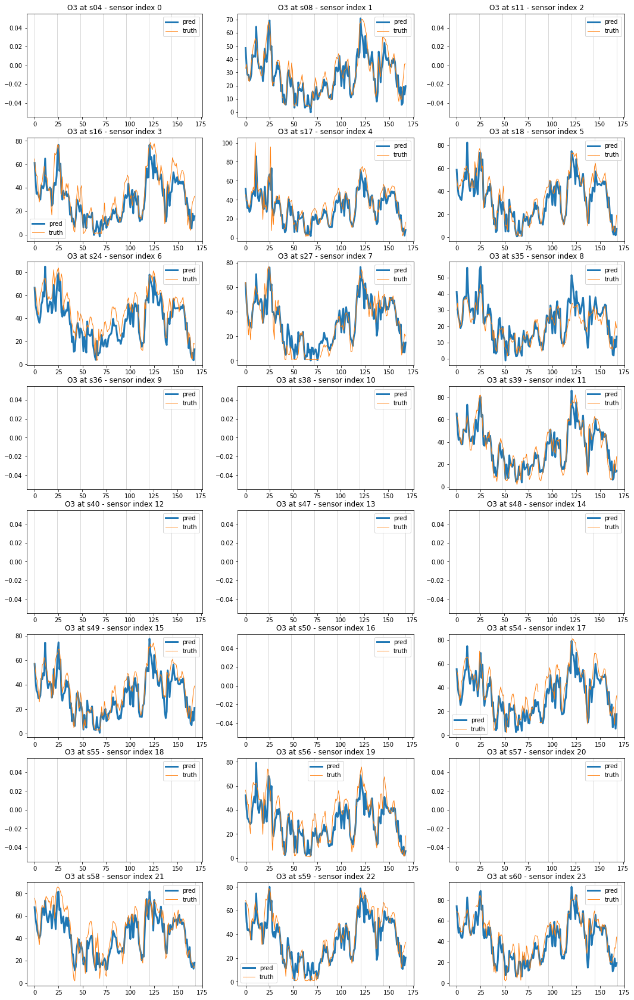

In [57]:
experiment = 'less-variables'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_RMSprop_ep{:03}_O3'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

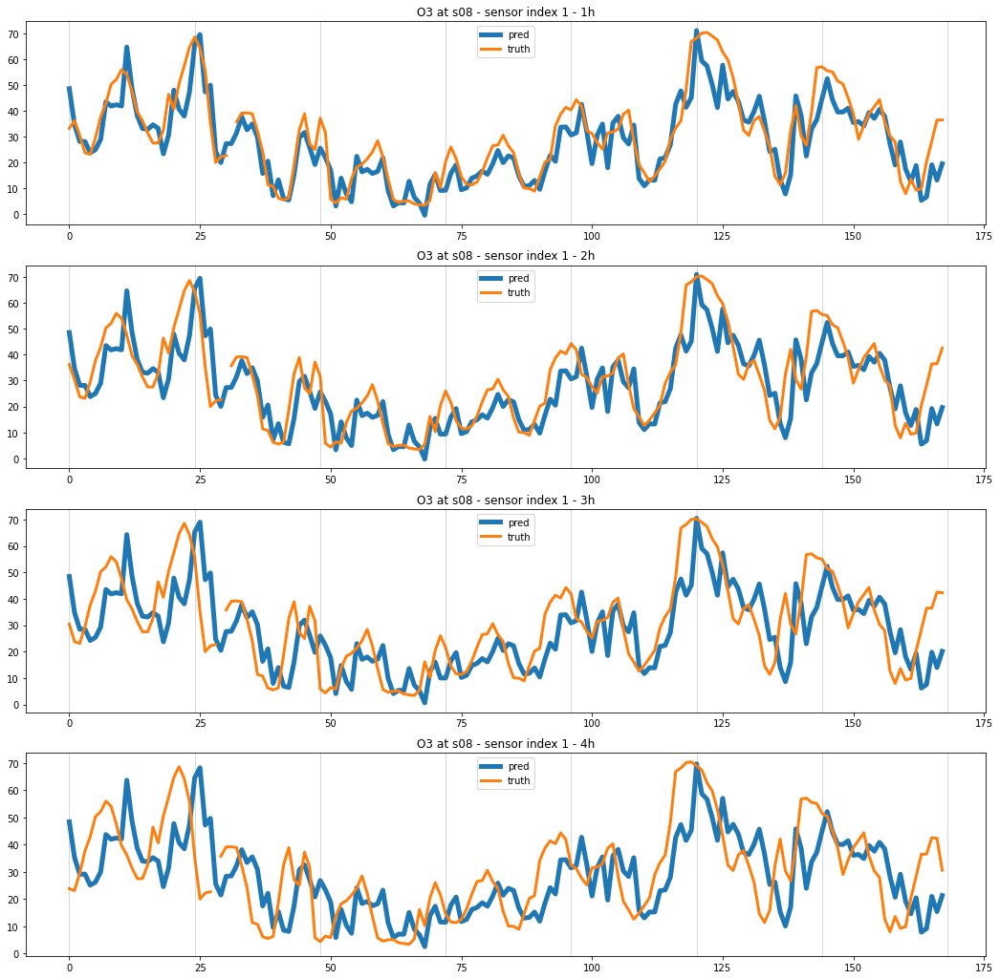

In [59]:
experiment = 'less-variables'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_RMSprop_ep{:03}_O3'.format(model, scaling, method, ep)
vi = 0
si = 1

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## SO$_2$, CO, NO$_2$, PM$_{10}$

In [63]:
# ------------------------------ #
l.set_idx_v([0, 1, 3, 5]) # --> SO2, CO, NO2, PM10
# ------------------------------ #

### Table comparison

MAE:

In [68]:
l.set_experiment('less-variables')

with pd.ExcelWriter('./results-analysis/less-variables-MAE.xlsx', mode='w') as writer:
    df = pd.DataFrame(columns=['loss', 'lr', 'opt', 'ep', 'vn', 'MAE h0', 'MAE h1', 'MAE h2', 'MAE h3', 'avg'])
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        mod_name = 'ST_AQF_stand_linear_J0.0_nx04_ny04_sh01_mse_lr0.001_RMSprop_ep100_SO2_CO_NO2_PM10'
        fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
        with tb.open_file(fname, mode='r') as h5_in:
            mae = h5_in.root._v_attrs['mae_mod']
            loss = h5_in.root._v_attrs['loss']
            lr = h5_in.root._v_attrs['lr']
            ep = h5_in.root._v_attrs['epochs']
            opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
        for h in range(4):
            df.loc[id_v, 'MAE h'+str(h)] = np.nanmean(mae[h, :, id_v])
        df.loc[id_v, ['loss', 'lr', 'opt', 'ep', 'vn']] = loss, lr, opt, ep, vc
        df.loc[id_v, 'avg'] = df.iloc[id_v, 5:9].mean()
    df.set_index(['loss', 'lr', 'opt', 'ep', 'vn'], inplace=True)
    df.sort_index(inplace=True)
    df.sort_values('avg', inplace=True)
    display(df)
    df.to_excel(writer, sheet_name=vc)

MAE h0     MAE h1     MAE h2     MAE h3  \
loss lr    opt     ep  vn                                                 
mse  0.001 RMSprop 100 CO     0.177372   0.182253   0.186927   0.189366   
                       SO2    3.164423   3.180129   3.197728   3.211405   
                       PM10   8.205537   8.213588   8.392136   8.652506   
                       NO2   13.991495  15.141979  16.799642  18.383492   

                                   avg  
loss lr    opt     ep  vn               
mse  0.001 RMSprop 100 CO     0.183980  
                       SO2    3.188421  
                       PM10   8.365942  
                       NO2   16.079152

RMSE:

In [70]:
l.set_experiment('less-variables')

with pd.ExcelWriter('./results-analysis/less-variables-RMSE.xlsx', mode='w') as writer:
    df = pd.DataFrame(columns=['loss', 'lr', 'opt', 'ep', 'vn', 'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        mod_name = 'ST_AQF_stand_linear_J0.0_nx04_ny04_sh01_mse_lr0.001_RMSprop_ep100_SO2_CO_NO2_PM10'
        fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
        with tb.open_file(fname, mode='r') as h5_in:
            rmse = h5_in.root._v_attrs['rmse_mod']
            loss = h5_in.root._v_attrs['loss']
            lr = h5_in.root._v_attrs['lr']
            ep = h5_in.root._v_attrs['epochs']
            opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
        for h in range(4):
            df.loc[id_v, 'RMSE h'+str(h)] = np.nanmean(rmse[h, :, id_v])
        df.loc[id_v, ['loss', 'lr', 'opt', 'ep', 'vn']] = loss, lr, opt, ep, vc
        df.loc[id_v, 'avg'] = df.iloc[id_v, 5:9].mean()
    df.set_index(['loss', 'lr', 'opt', 'ep', 'vn'], inplace=True)
    df.sort_index(inplace=True)
    df.sort_values('avg', inplace=True)
    display(df)
    df.to_excel(writer, sheet_name=vc)

RMSE h0    RMSE h1    RMSE h2    RMSE h3  \
loss lr    opt     ep  vn                                                 
mse  0.001 RMSprop 100 CO     0.227489   0.234257   0.243683   0.250896   
                       SO2    4.268731   4.289834   4.332628   4.380183   
                       PM10  11.786828  11.843976  12.148194  12.559429   
                       NO2   18.174840  19.830250  22.299738  24.567222   

                                   avg  
loss lr    opt     ep  vn               
mse  0.001 RMSprop 100 CO     0.239081  
                       SO2    4.317844  
                       PM10  12.084607  
                       NO2   21.218012

### True vs predicted

All sensors:

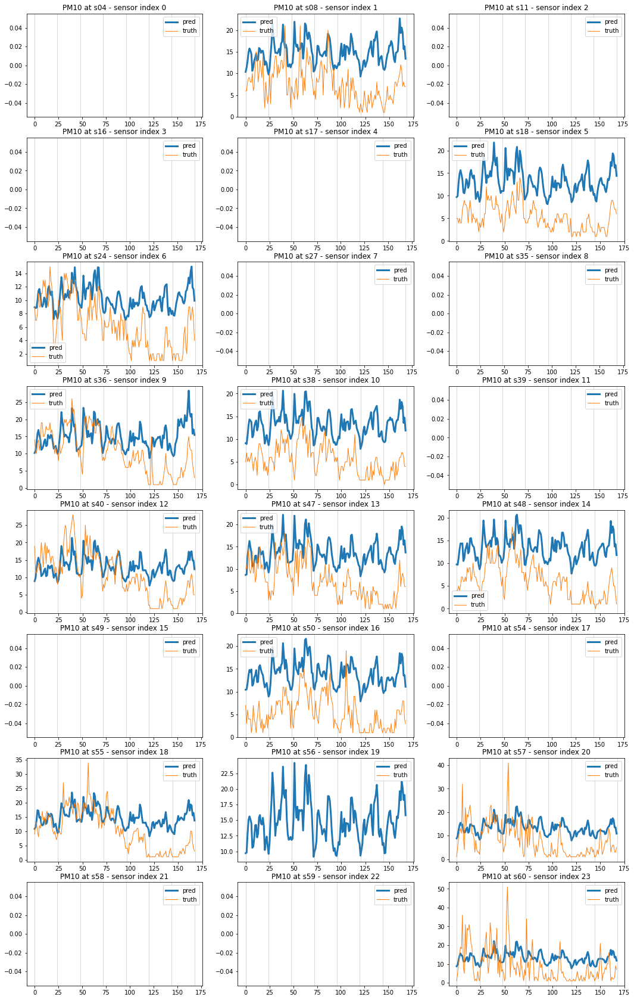

In [74]:
experiment = 'less-variables'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_RMSprop_ep{:03}_SO2_CO_NO2_PM10'.format(model, scaling, method, ep)
vi = 3
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

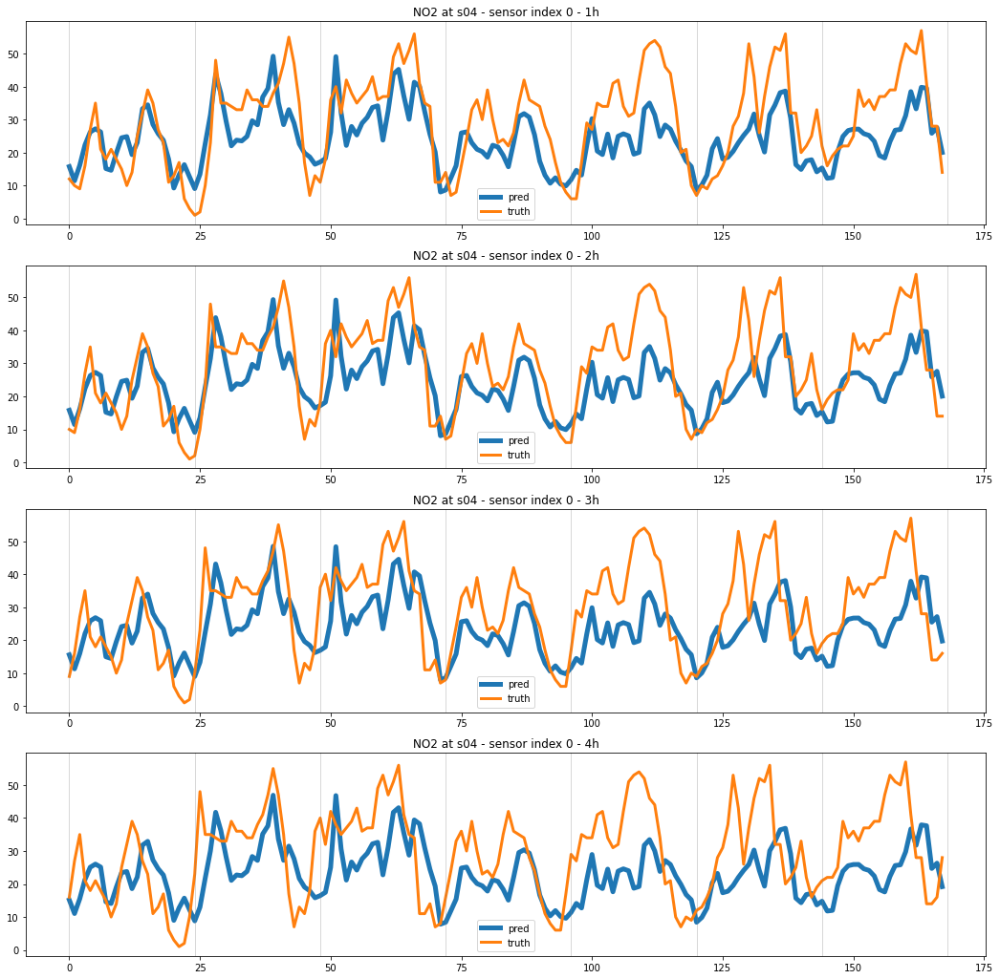

In [77]:
experiment = 'less-variables'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_RMSprop_ep{:03}_SO2_CO_NO2_PM10'.format(model, scaling, method, ep)
vi = 2
si = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

# Single variable

$$\text{nRMSE} = \frac{\text{RMSE}}{\text{mean}\left({x_{v, s}^{\text{test}}}\right)},\quad v \in \mathcal{V}, s \in \mathcal{S}$$

In [129]:
import sys
sys.path.append('../src/')
import learner

import importlib
importlib.reload(learner)

l = learner.DeepLearner()

l.vc_map

OrderedDict([('01', 'SO2'),
             ('06', 'CO'),
             ('07', 'NO'),
             ('08', 'NO2'),
             ('09', 'PM25'),
             ('10', 'PM10'),
             ('12', 'NOx'),
             ('14', 'O3'),
             ('20', 'TOL'),
             ('30', 'BEN'),
             ('35', 'EBE')])

In [273]:
def result_table(experiment, idx_v, normalized=True):
    # Preparation
    l = learner.DeepLearner()
    l.set_idx_v([idx_v])
    l.set_experiment(experiment)
    err = 'nRMSE' if normalized else 'RMSE'
    # Actual table
    with pd.ExcelWriter('./results-analysis/single-variable-{}-{}.xlsx'.format(g, err), mode='w') as writer:
        for id_v in range(len(l.idx_v)):
            vc = list(l.vc_map.keys())[id_v]
            vn = list(l.vn_map.keys())[id_v]
            df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'n_x', 'ep', 'time', 'model',
                                       err + ' h0', err + ' h1', err + ' h2', err + ' h3', 'avg'])
            df.iloc[:, 9:13] = df.iloc[:, 9:13].astype(float)
            # Compute average value of test set:
            with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
                avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0) if normalized else 1
            if normalized:
                print('Avg on the test set per sensor:\n', avg_t.round(2))
            for id_m, mod_name in enumerate(os.listdir(l.models_path)):
                fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
                if not os.path.exists(fname) or (vn+'.h5') not in fname:
                    df.loc[id_m] = np.nan
                    continue
                with tb.open_file(fname, mode='r') as h5_in:
                    rmse = h5_in.root._v_attrs['rmse_mod']
                    loss = h5_in.root._v_attrs['loss']
                    lr = h5_in.root._v_attrs['lr']
                    interp = h5_in.root._v_attrs['interp']
                    scaling = h5_in.root._v_attrs['scaling']
                    n_x = h5_in.root._v_attrs['n_x']
                    ep = h5_in.root._v_attrs['epochs']
                    t = time.strftime('%H:%M', time.gmtime(h5_in.root._v_attrs['train_duration_s']))
                    model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                    opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
                for h in range(4):
                    df.loc[id_m, err+' h'+str(h)] = np.nanmedian(rmse[h, l.vi_si_map[id_v], id_v] / avg_t)
                df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'n_x', 'ep', 'time']] = \
                    loss, lr, model, interp, scaling, opt, n_x, ep, t
                df.loc[id_m, 'avg'] = df.iloc[id_m, 9:13].mean()
            df.dropna(inplace=True)
            df.iloc[:, 5] = df.iloc[:, 5].astype(int)
            df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'n_x', 'ep', 'time'], inplace=True)
            df.sort_index(inplace=True)
            df.sort_values('avg', inplace=True)
            df.index = df.index.set_levels(df.index.levels[-2].astype(int), level=-2)
            #df.index = df.index.set_levels(df.index.levels[-3].astype(int), level=-3)
            df.index.set_names([vn, '', '', '', '', '', 'n_x', 'ep', 'time'], inplace=True)
            display(df.round(3))
            df.to_excel(writer, sheet_name=vn)

## NO$_2$

In [76]:
# ------------------------------ #
l.set_idx_v([3]) # --> Only NO2
# ------------------------------ #

### Table comparison

RMSE:

In [269]:
result_table(experiment='experiment-n_x', idx_v=3, normalized=False)
result_table(experiment='experiment-n_x', idx_v=3, normalized=True)

RMSE h0  RMSE h1  \
NO2                                   n_x ep  time                      
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:04   14.087   15.439   
                                      20  100 02:41   13.635   15.391   
                                      8   100 01:20   12.555   15.416   
                                      12  100 01:47   12.810   15.262   
                                      16  100 02:14   13.490   15.347   
                                      4   100 00:54   12.286   15.715   
                                      3   100 00:47   12.299   15.614   
                                      2   100 00:40   11.965   15.890   
                                      1   100 00:33   12.292   17.432   

                                                     RMSE h2  RMSE h3     avg  
NO2                                   n_x ep  time                             
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:04   18.095   20.828  17.112  
                                      20  100 02:41   18.344   21.306  17.169  
                                      8   100 01:20   18.996   21.940  17.227  
                                      12  100 01:47   18.889   22.083  17.261  
                                      16  100 02:14   18.673   21.619  17.282  
                                      4   100 00:54   19.683   22.816  17.625  
                                      3   100 00:47   19.872   23.090  17.719  
                                      2   100 00:40   20.272   23.449  17.894  
                                      1   100 00:33   21.547   24.243  18.879

Avg on the test set per sensor:
 [41.38 53.16 41.   35.44 37.95 33.12 20.05 36.03 40.31 37.39 39.95 37.26
 36.37 34.24 36.49 27.03 38.23 36.99 39.58 52.99 31.27 15.39 25.48 26.68]


nRMSE h0  nRMSE h1  \
NO2                                   n_x ep  time                        
mse 0.001 ST-AQF nearest stand Adamax 20  100 02:41     0.367     0.410   
                                      12  100 01:47     0.349     0.409   
                                      8   100 01:20     0.354     0.419   
                                      16  100 02:14     0.374     0.420   
                                      24  100 03:04     0.398     0.422   
                                      4   100 00:54     0.340     0.423   
                                      3   100 00:47     0.342     0.432   
                                      2   100 00:40     0.336     0.446   
                                      1   100 00:33     0.349     0.482   

                                                     nRMSE h2  nRMSE h3    avg  
NO2                                   n_x ep  time                              
mse 0.001 ST-AQF nearest stand Adamax 20  100 02:41     0.493     0.587  0.464  
                                      12  100 01:47     0.512     0.613  0.471  
                                      8   100 01:20     0.516     0.609  0.474  
                                      16  100 02:14     0.510     0.596  0.475  
                                      24  100 03:04     0.501     0.582  0.475  
                                      4   100 00:54     0.539     0.632  0.484  
                                      3   100 00:47     0.543     0.636  0.488  
                                      2   100 00:40     0.561     0.648  0.498  
                                      1   100 00:33     0.592     0.676  0.525

In [310]:
l.set_experiment('single-variable')

with pd.ExcelWriter('./results-analysis/single-variable-NO2-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'ep', 'model',
                                   'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        df.iloc[:, 7:11] = df.iloc[:, 7:11].astype(float)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'NO2' not in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                interp = h5_in.root._v_attrs['interp']
                scaling = h5_in.root._v_attrs['scaling']
                ep = h5_in.root._v_attrs['epochs']
                model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmedian(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'ep']] = loss, lr, model, interp, scaling, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 7:11].mean()
        df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index = df.index.set_levels(df.index.levels[-1].astype(int), level=-1)
        df.index.set_names([vc, '', '', '', '', '', ''], inplace=True)
        df.dropna(inplace=True)
        display(df.round(3))
        df.to_excel(writer, sheet_name=vc)

RMSE h0  RMSE h1  RMSE h2  \
NO2                                                                         
mse 0.001 ST-AQF      nearest stand Adamax 200   12.161   15.394   19.549   
                      linear  stand Adamax 200   12.076   15.448   19.755   
                      nearest stand Adamax 100   12.257   15.535   19.755   
                      linear  stand Adamax 100   12.312   15.839   19.943   
                      nearest stand Nadam  100   12.470   16.361   20.438   
                              raw   Adamax 200   13.732   16.603   20.383   
                      linear  raw   Adamax 200   14.321   17.211   20.435   
                              stand Adam   100   13.730   18.034   21.884   
                              norm  Adamax 200   15.250   18.307   22.072   
                              stand Nadam  100   15.041   18.859   22.629   
                      nearest norm  Adamax 200   16.822   19.909   23.305   
          persistence nearest stand Adamax 0     13.000   20.941   26.295   

                                                RMSE h3     avg  
NO2                                                              
mse 0.001 ST-AQF      nearest stand Adamax 200   22.840  17.486  
                      linear  stand Adamax 200   23.031  17.578  
                      nearest stand Adamax 100   22.939  17.621  
                      linear  stand Adamax 100   23.150  17.811  
                      nearest stand Nadam  100   23.383  18.163  
                              raw   Adamax 200   23.646  18.591  
                      linear  raw   Adamax 200   23.588  18.889  
                              stand Adam   100   24.491  19.535  
                              norm  Adamax 200   24.957  20.146  
                              stand Nadam  100   25.017  20.387  
                      nearest norm  Adamax 200   26.642  21.669  
          persistence nearest stand Adamax 0     29.946  22.546

### True vs predicted

All sensors:

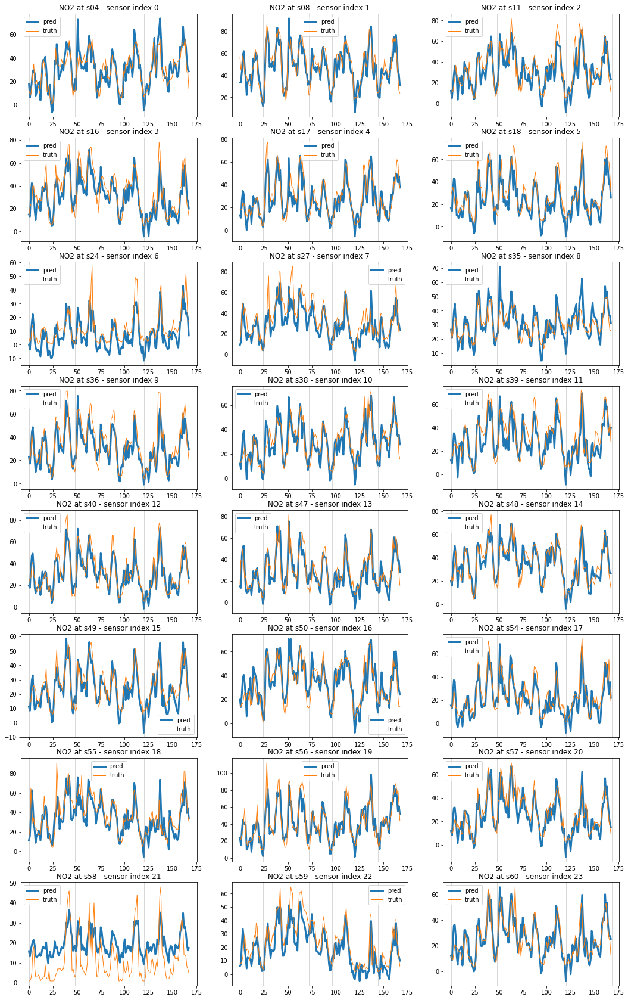

In [183]:
experiment = 'single-variable'
model = 'ST_AQF'
method = 'nearest'
scaling = 'stand'
ep = 200
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_NO2'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

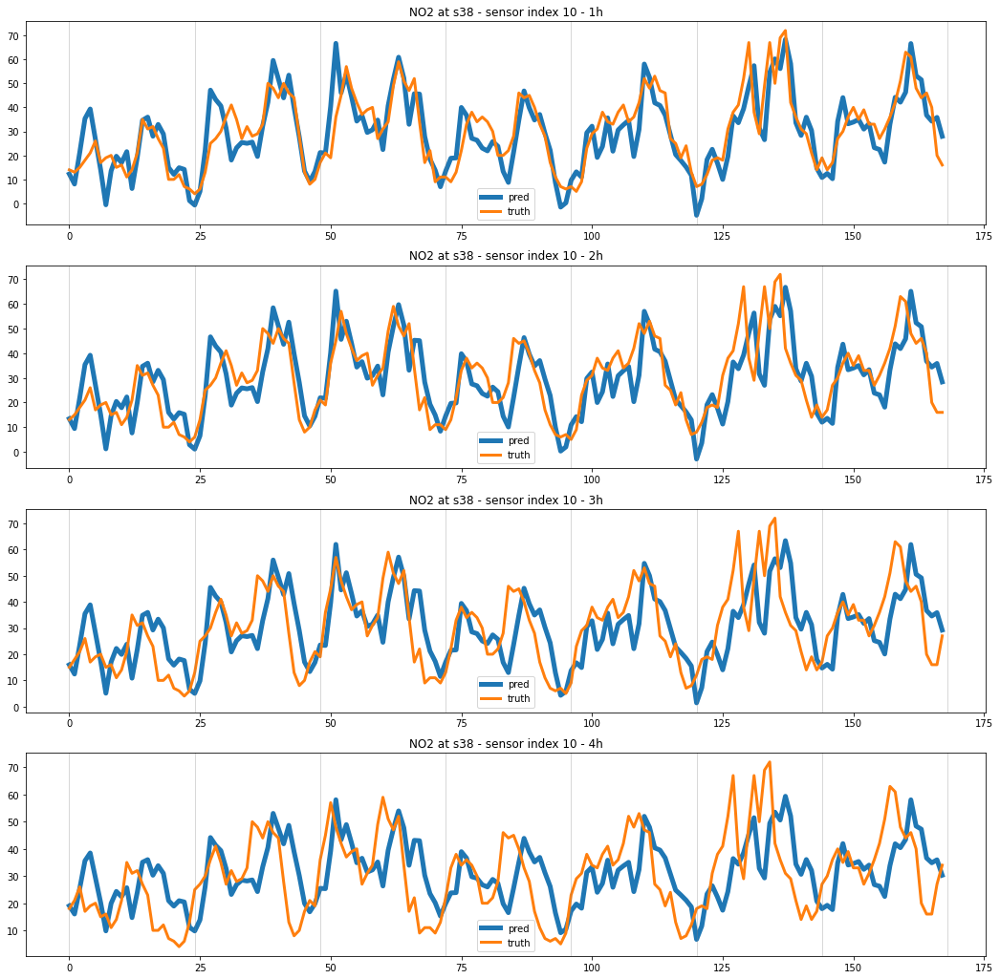

In [186]:
experiment = 'single-variable'
model = 'ST_AQF'
method = 'nearest'
scaling = 'stand'
ep = 200
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_NO2'.format(model, scaling, method, ep)
vi = 0
si = 10

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## O$_3$

In [50]:
# ------------------------------ #
l.set_idx_v([7]) # --> Only O3
# ------------------------------ #

### Table comparison

RMSE:

In [249]:
result_table(experiment='experiment-n_x', idx_v=7, normalized=False)
result_table(experiment='experiment-n_x', idx_v=7, normalized=True)

RMSE h0  RMSE h1  \
O3                                    n_x ep  time                      
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:18   13.647   13.599   
                                      16  100 02:23   13.070   13.968   
                                      20  100 01:47   15.062   14.342   
                                      12  100 01:54   13.457   14.441   
                                      8   100 01:25   12.216   14.275   
                                      4   100 00:56   11.785   14.534   
                                      3   100 00:48   11.592   14.823   
                                      2   100 00:41   12.308   15.232   
                                      1   100 00:14   12.011   17.977   

                                                     RMSE h2  RMSE h3     avg  
O3                                    n_x ep  time                             
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:18   15.984   19.074  15.576  
                                      16  100 02:23   16.787   20.129  15.989  
                                      20  100 01:47   16.091   18.715  16.053  
                                      12  100 01:54   17.021   20.195  16.278  
                                      8   100 01:25   17.602   21.083  16.294  
                                      4   100 00:56   18.853   22.615  16.947  
                                      3   100 00:48   19.008   22.786  17.052  
                                      2   100 00:41   19.335   23.134  17.502  
                                      1   100 00:14   22.165   25.637  19.447

Avg on the test set per sensor:
 [46.58 42.02 49.02 53.57 59.52 50.86 42.61 53.66 52.54 51.49 44.99 58.33
 55.54 61.8 ]


nRMSE h0  nRMSE h1  \
O3                                    n_x ep  time                        
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:18     0.262     0.260   
                                      16  100 02:23     0.258     0.266   
                                      20  100 01:47     0.295     0.285   
                                      12  100 01:54     0.276     0.282   
                                      8   100 01:25     0.253     0.277   
                                      4   100 00:56     0.225     0.272   
                                      3   100 00:48     0.225     0.276   
                                      2   100 00:41     0.234     0.284   
                                      1   100 00:14     0.247     0.341   

                                                     nRMSE h2  nRMSE h3    avg  
O3                                    n_x ep  time                              
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:18     0.302     0.366  0.298  
                                      16  100 02:23     0.315     0.382  0.305  
                                      20  100 01:47     0.312     0.361  0.313  
                                      12  100 01:54     0.327     0.388  0.318  
                                      8   100 01:25     0.339     0.404  0.318  
                                      4   100 00:56     0.358     0.433  0.322  
                                      3   100 00:48     0.364     0.438  0.326  
                                      2   100 00:41     0.369     0.444  0.333  
                                      1   100 00:14     0.432     0.498  0.380

In [313]:
l.set_experiment('single-variable')

with pd.ExcelWriter('./results-analysis/single-variable-O3-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'ep', 'model',
                                   'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        df.iloc[:, 7:11] = df.iloc[:, 7:11].astype(float)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'O3' not in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                interp = h5_in.root._v_attrs['interp']
                scaling = h5_in.root._v_attrs['scaling']
                ep = h5_in.root._v_attrs['epochs']
                model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmedian(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'ep']] = loss, lr, model, interp, scaling, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 7:11].mean()
        df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index = df.index.set_levels(df.index.levels[-1].astype(int), level=-1)
        df.index.set_names([vc, '', '', '', '', '', ''], inplace=True)
        df.dropna(inplace=True)
        display(df.round(3))
        df.to_excel(writer, sheet_name=vc)

RMSE h0  RMSE h1  RMSE h2  \
O3                                                                          
mse 0.001 ST-AQF      nearest stand Adamax 200   11.495   14.351   18.557   
                                           100   11.687   14.460   18.579   
                      linear  stand Adamax 200   11.662   14.390   18.577   
                      nearest stand Nadam  100   11.940   14.785   18.701   
                      linear  stand Adamax 100   12.055   14.661   18.755   
                                    Adam   100   13.440   15.787   19.502   
                                    Nadam  100   14.449   16.275   19.215   
                              raw   Adamax 100   13.835   16.373   20.165   
          persistence nearest stand Adamax 0     11.367   18.981   24.830   
          ST-AQF      linear  norm  Adamax 100   16.513   19.321   23.158   
                      nearest raw   Adamax 100   17.831   19.936   23.234   
                              norm  Adamax 100   19.377   21.604   24.358   

                                                RMSE h3     avg  
O3                                                               
mse 0.001 ST-AQF      nearest stand Adamax 200   22.297  16.675  
                                           100   22.259  16.746  
                      linear  stand Adamax 200   22.410  16.760  
                      nearest stand Nadam  100   22.248  16.918  
                      linear  stand Adamax 100   22.625  17.024  
                                    Adam   100   23.066  17.949  
                                    Nadam  100   22.603  18.135  
                              raw   Adamax 100   23.840  18.553  
          persistence nearest stand Adamax 0     29.378  21.139  
          ST-AQF      linear  norm  Adamax 100   26.429  21.355  
                      nearest raw   Adamax 100   26.901  21.975  
                              norm  Adamax 100   27.897  23.309

### True vs predicted

All sensors:

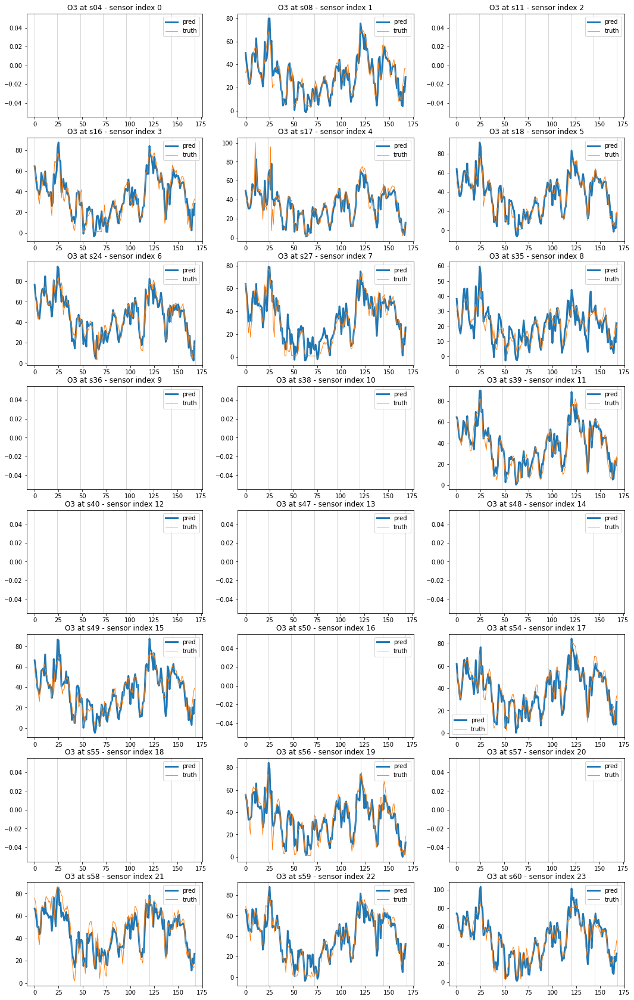

In [190]:
experiment = 'single-variable'
model = 'ST_AQF'
method = 'nearest'
scaling = 'stand'
ep = 200
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_O3'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

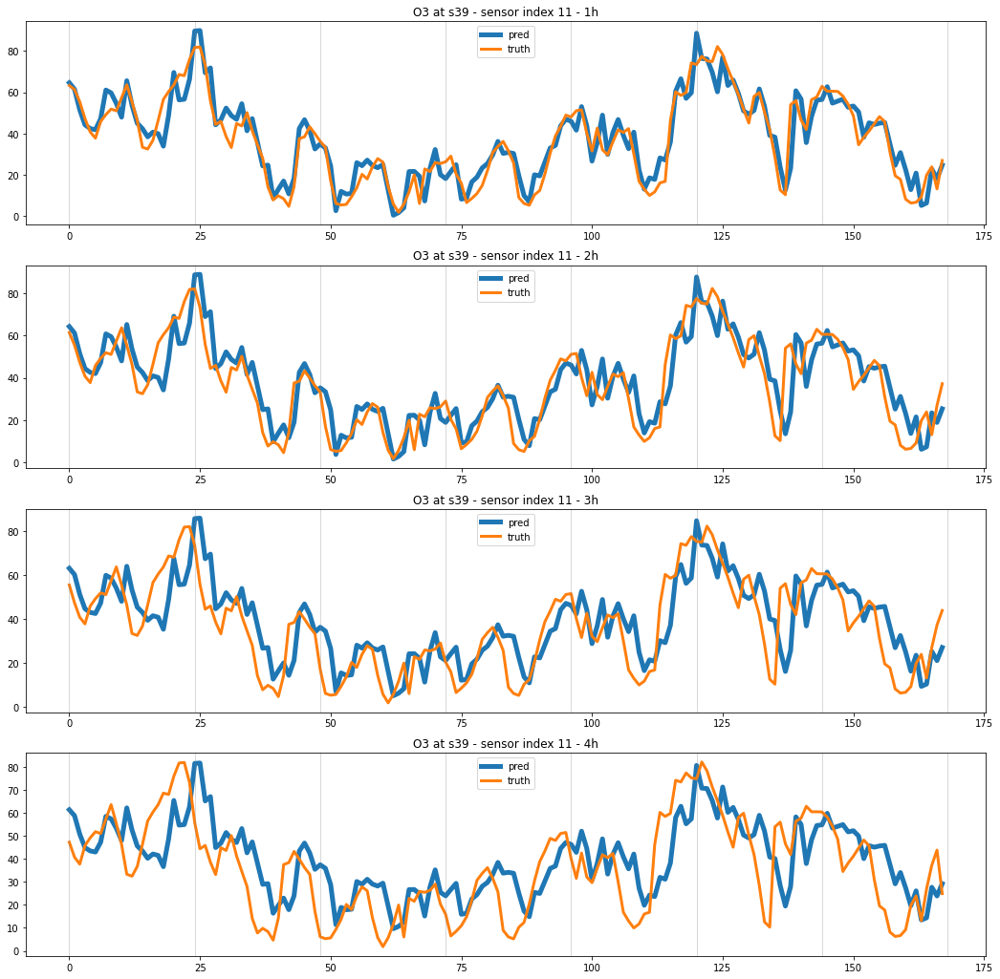

In [191]:
experiment = 'single-variable'
model = 'ST_AQF'
method = 'nearest'
scaling = 'stand'
ep = 200
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_O3'.format(model, scaling, method, ep)
vi = 0
si = 11

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## SO$_2$

In [53]:
# ------------------------------ #
l.set_idx_v([0]) # --> Only SO2
# ------------------------------ #

### Table comparison

RMSE:

In [250]:
result_table(experiment='experiment-n_x', idx_v=0, normalized=False)
result_table(experiment='experiment-n_x', idx_v=0, normalized=True)

RMSE h0  RMSE h1  \
SO2                                   n_x ep  time                      
mse 0.001 ST-AQF nearest stand Adamax 20  100 02:23    1.610    1.873   
                                      16  100 01:19    1.642    1.953   
                                      24  100 01:16    1.717    1.956   
                                      12  100 01:53    1.656    1.990   
                                      8   100 01:24    1.654    1.962   
                                      4   100 00:52    1.692    1.970   
                                      3   100 00:48    1.666    2.048   
                                      2   100 00:40    1.658    2.051   
                                      1   100 00:33    1.703    2.119   

                                                     RMSE h2  RMSE h3    avg  
SO2                                   n_x ep  time                            
mse 0.001 ST-AQF nearest stand Adamax 20  100 02:23    2.149    2.357  1.997  
                                      16  100 01:19    2.156    2.344  2.024  
                                      24  100 01:16    2.215    2.448  2.084  
                                      12  100 01:53    2.264    2.472  2.096  
                                      8   100 01:24    2.263    2.513  2.098  
                                      4   100 00:52    2.313    2.591  2.142  
                                      3   100 00:48    2.355    2.606  2.169  
                                      2   100 00:40    2.443    2.710  2.215  
                                      1   100 00:33    2.460    2.692  2.243

Avg on the test set per sensor:
 [ 7.37  6.39  7.39  8.08  4.22 10.04  8.57  7.93  6.66  8.61]


nRMSE h0  nRMSE h1  \
SO2                                   n_x ep  time                        
mse 0.001 ST-AQF nearest stand Adamax 16  100 01:19     0.207     0.238   
                                      20  100 02:23     0.216     0.246   
                                      8   100 01:24     0.216     0.247   
                                      4   100 00:52     0.205     0.249   
                                      12  100 01:53     0.212     0.247   
                                      24  100 01:16     0.220     0.246   
                                      3   100 00:48     0.216     0.251   
                                      2   100 00:40     0.215     0.261   
                                      1   100 00:33     0.211     0.264   

                                                     nRMSE h2  nRMSE h3    avg  
SO2                                   n_x ep  time                              
mse 0.001 ST-AQF nearest stand Adamax 16  100 01:19     0.268     0.292  0.251  
                                      20  100 02:23     0.271     0.295  0.257  
                                      8   100 01:24     0.272     0.297  0.258  
                                      4   100 00:52     0.279     0.304  0.259  
                                      12  100 01:53     0.278     0.305  0.260  
                                      24  100 01:16     0.278     0.307  0.263  
                                      3   100 00:48     0.289     0.317  0.268  
                                      2   100 00:40     0.297     0.329  0.276  
                                      1   100 00:33     0.305     0.339  0.280

In [316]:
l.set_experiment('single-variable')

with pd.ExcelWriter('./results-analysis/single-variable-SO2-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'ep', 'model',
                                   'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        df.iloc[:, 7:11] = df.iloc[:, 7:11].astype(float)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'SO2' not in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                interp = h5_in.root._v_attrs['interp']
                scaling = h5_in.root._v_attrs['scaling']
                ep = h5_in.root._v_attrs['epochs']
                model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmedian(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'ep']] = loss, lr, model, interp, scaling, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 7:11].mean()
        df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index = df.index.set_levels(df.index.levels[-1].astype(int), level=-1)
        df.index.set_names([vc, '', '', '', '', '', ''], inplace=True)
        df.dropna(inplace=True)
        display(df.round(3))
        df.to_excel(writer, sheet_name=vc)

RMSE h0  RMSE h1  RMSE h2  \
SO2                                                                         
mse 0.001 persistence nearest stand Adamax 0      1.261    1.874    2.284   
          ST-AQF      linear  stand Adamax 200    1.767    2.044    2.437   

                                                RMSE h3    avg  
SO2                                                             
mse 0.001 persistence nearest stand Adamax 0      2.573  1.998  
          ST-AQF      linear  stand Adamax 200    2.725  2.243

### True vs predicted

All sensors:

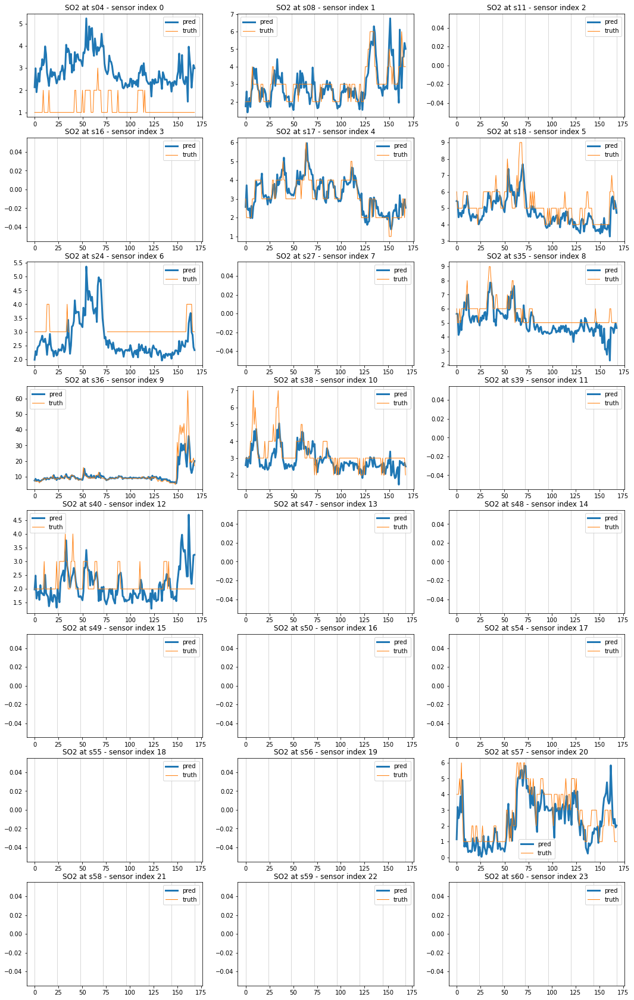

In [194]:
experiment = 'single-variable'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 200
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_SO2'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

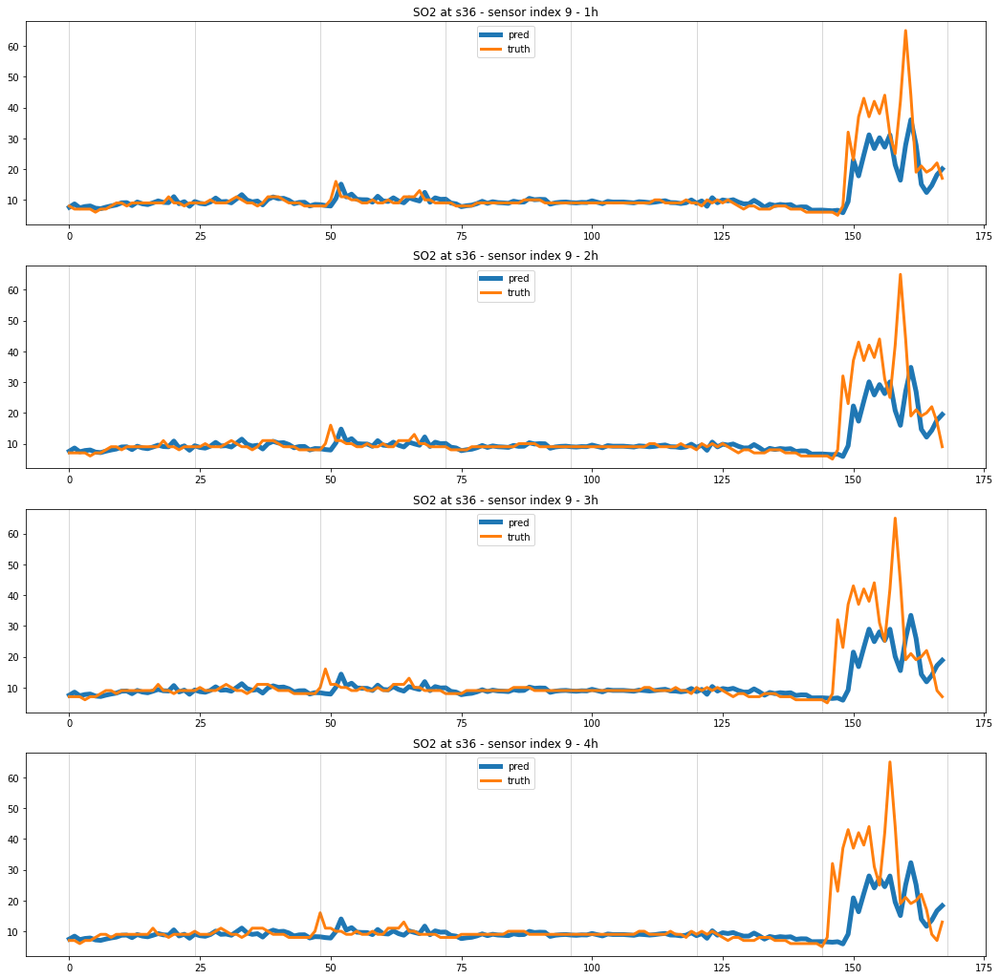

In [196]:
experiment = 'single-variable'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 200
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_SO2'.format(model, scaling, method, ep)
vi = 0
si = 9

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## PM$_{10}$

In [56]:
# ------------------------------ #
l.set_idx_v([5]) # --> Only PM10
# ------------------------------ #

### Table comparison

RMSE:

In [251]:
result_table(experiment='experiment-n_x', idx_v=5, normalized=False)
result_table(experiment='experiment-n_x', idx_v=5, normalized=True)

RMSE h0  RMSE h1  \
PM10                                   n_x ep  time                      
mse  0.001 ST-AQF nearest stand Adamax 20  100 02:51    8.214    9.169   
                                       1   100 00:32    7.589    9.127   
                                       2   100 00:41    7.916    9.105   
                                       24  100 02:24    8.669    9.112   
                                       3   100 00:39    8.052    9.082   
                                       12  100 01:36    8.325    9.309   
                                       16  100 02:22    8.379    9.361   
                                       4   100 00:56    8.198    9.288   
                                       8   100 01:24    8.781    9.971   

                                                      RMSE h2  RMSE h3    avg  
PM10                                   n_x ep  time                            
mse  0.001 ST-AQF nearest stand Adamax 20  100 02:51   10.085   10.722  9.548  
                                       1   100 00:32   10.330   11.172  9.555  
                                       2   100 00:41   10.211   11.089  9.580  
                                       24  100 02:24    9.884   10.702  9.592  
                                       3   100 00:39   10.187   11.080  9.600  
                                       12  100 01:36   10.263   10.989  9.722  
                                       16  100 02:22   10.218   10.991  9.737  
                                       4   100 00:56   10.291   11.196  9.743  
                                       8   100 01:24   10.280   10.898  9.982

Avg on the test set per sensor:
 [20.8  16.7  14.24 20.46 18.64 17.63 16.8  16.82 17.62 21.22 17.94 15.34
 15.4 ]


nRMSE h0  nRMSE h1  \
PM10                                   n_x ep  time                        
mse  0.001 ST-AQF nearest stand Adamax 20  100 02:51     0.420     0.493   
                                       24  100 02:24     0.448     0.499   
                                       2   100 00:41     0.423     0.512   
                                       3   100 00:39     0.423     0.507   
                                       8   100 01:24     0.428     0.516   
                                       16  100 02:22     0.435     0.512   
                                       12  100 01:36     0.439     0.509   
                                       1   100 00:32     0.419     0.515   
                                       4   100 00:56     0.435     0.516   

                                                      nRMSE h2  nRMSE h3  \
PM10                                   n_x ep  time                        
mse  0.001 ST-AQF nearest stand Adamax 20  100 02:51     0.542     0.581   
                                       24  100 02:24     0.527     0.564   
                                       2   100 00:41     0.557     0.600   
                                       3   100 00:39     0.560     0.601   
                                       8   100 01:24     0.573     0.586   
                                       16  100 02:22     0.560     0.597   
                                       12  100 01:36     0.558     0.599   
                                       1   100 00:32     0.570     0.606   
                                       4   100 00:56     0.563     0.601   

                                                        avg  
PM10                                   n_x ep  time          
mse  0.001 ST-AQF nearest stand Adamax 20  100 02:51  0.509  
                                       24  100 02:24  0.510  
                                       2   100 00:41  0.523  
                                       3   100 00:39  0.523  
                                       8   100 01:24  0.526  
                                       16  100 02:22  0.526  
                                       12  100 01:36  0.526  
                                       1   100 00:32  0.528  
                                       4   100 00:56  0.529

In [319]:
l.set_experiment('single-variable')

with pd.ExcelWriter('./results-analysis/single-variable-PM10-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'ep', 'model',
                                   'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        df.iloc[:, 7:11] = df.iloc[:, 7:11].astype(float)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'PM10' not in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                interp = h5_in.root._v_attrs['interp']
                scaling = h5_in.root._v_attrs['scaling']
                ep = h5_in.root._v_attrs['epochs']
                model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmedian(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'ep']] = loss, lr, model, interp, scaling, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 7:11].mean()
        df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index = df.index.set_levels(df.index.levels[-1].astype(int), level=-1)
        df.index.set_names([vc, '', '', '', '', '', ''], inplace=True)
        df.dropna(inplace=True)
        display(df.round(3))
        df.to_excel(writer, sheet_name=vc)

RMSE h0  RMSE h1  RMSE h2  \
PM10                                                                         
mse  0.001 ST-AQF      linear  stand Adamax 200    7.968    9.190   10.283   
           persistence nearest stand Adamax 0      7.440   10.085   11.514   

                                                 RMSE h3     avg  
PM10                                                              
mse  0.001 ST-AQF      linear  stand Adamax 200   11.124   9.641  
           persistence nearest stand Adamax 0     12.667  10.426

### True vs predicted

All sensors:

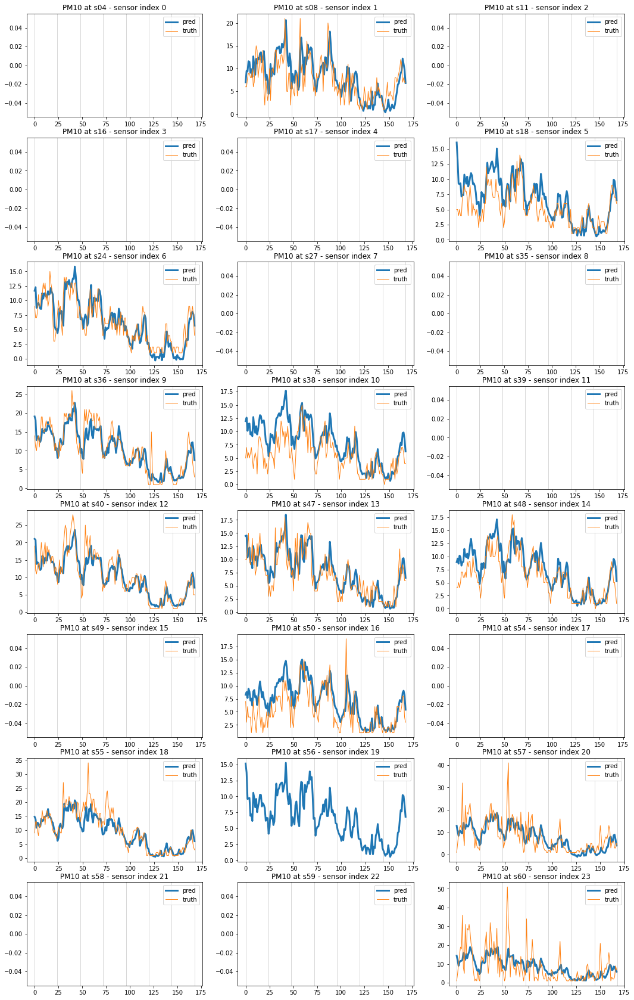

In [199]:
experiment = 'single-variable'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 200
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_PM10'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

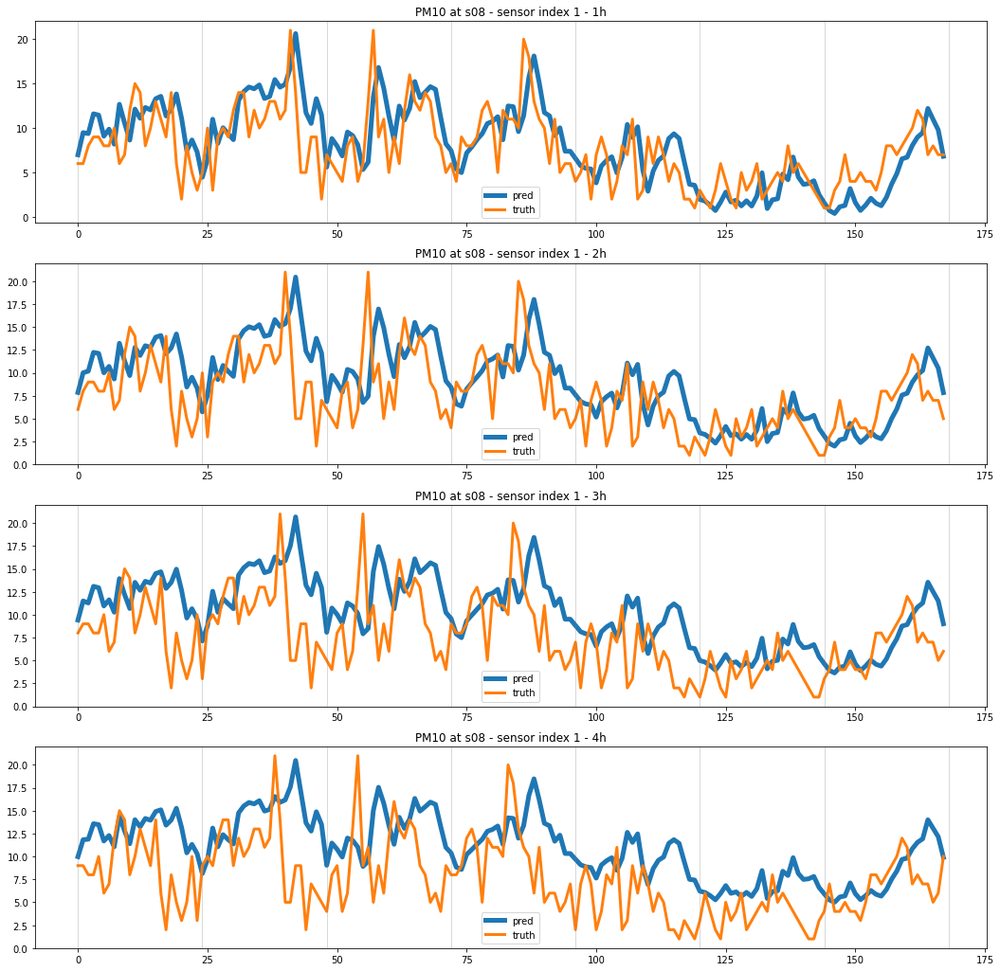

In [200]:
experiment = 'single-variable'
model = 'ST_AQF'
method = 'linear'
scaling = 'stand'
ep = 200
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_PM10'.format(model, scaling, method, ep)
vi = 0
si = 1

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## CO

In [321]:
# ------------------------------ #
l.set_idx_v([1]) # --> Only CO
# ------------------------------ #

### Table comparison

RMSE:

In [252]:
result_table(experiment='experiment-n_x', idx_v=1, normalized=False)
result_table(experiment='experiment-n_x', idx_v=1, normalized=True)

RMSE h0  RMSE h1  \
CO                                    n_x ep  time                      
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:04    0.125    0.137   
                                      12  100 01:47    0.123    0.136   
                                      16  100 02:10    0.124    0.139   
                                      8   100 01:19    0.121    0.138   
                                      20  100 02:40    0.131    0.141   
                                      4   100 00:54    0.121    0.141   
                                      3   100 00:48    0.121    0.142   
                                      2   100 00:41    0.124    0.147   
                                      1   100 00:33    0.121    0.151   

                                                     RMSE h2  RMSE h3    avg  
CO                                    n_x ep  time                            
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:04    0.156    0.176  0.148  
                                      12  100 01:47    0.159    0.178  0.149  
                                      16  100 02:10    0.160    0.179  0.150  
                                      8   100 01:19    0.162    0.181  0.151  
                                      20  100 02:40    0.161    0.180  0.153  
                                      4   100 00:54    0.166    0.186  0.153  
                                      3   100 00:48    0.167    0.186  0.154  
                                      2   100 00:41    0.172    0.190  0.158  
                                      1   100 00:33    0.176    0.194  0.160

Avg on the test set per sensor:
 [0.41 0.33 0.3  0.45 0.21 0.46 0.3  0.33 0.35 0.29]


nRMSE h0  nRMSE h1  \
CO                                    n_x ep  time                        
mse 0.001 ST-AQF nearest stand Adamax 16  100 02:10     0.372     0.410   
                                      12  100 01:47     0.364     0.414   
                                      24  100 03:04     0.383     0.416   
                                      8   100 01:19     0.354     0.415   
                                      4   100 00:54     0.354     0.424   
                                      3   100 00:48     0.354     0.427   
                                      2   100 00:41     0.356     0.431   
                                      20  100 02:40     0.400     0.433   
                                      1   100 00:33     0.352     0.461   

                                                     nRMSE h2  nRMSE h3    avg  
CO                                    n_x ep  time                              
mse 0.001 ST-AQF nearest stand Adamax 16  100 02:10     0.471     0.529  0.445  
                                      12  100 01:47     0.483     0.539  0.450  
                                      24  100 03:04     0.479     0.531  0.452  
                                      8   100 01:19     0.497     0.563  0.457  
                                      4   100 00:54     0.500     0.560  0.459  
                                      3   100 00:48     0.508     0.569  0.465  
                                      2   100 00:41     0.509     0.572  0.467  
                                      20  100 02:40     0.492     0.546  0.468  
                                      1   100 00:33     0.537     0.592  0.486

In [322]:
l.set_experiment('single-variable')

with pd.ExcelWriter('./results-analysis/single-variable-CO-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'ep', 'model',
                                   'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        df.iloc[:, 7:11] = df.iloc[:, 7:11].astype(float)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'CO' not in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                interp = h5_in.root._v_attrs['interp']
                scaling = h5_in.root._v_attrs['scaling']
                ep = h5_in.root._v_attrs['epochs']
                model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmedian(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'ep']] = loss, lr, model, interp, scaling, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 7:11].mean()
        df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index = df.index.set_levels(df.index.levels[-1].astype(int), level=-1)
        df.index.set_names([vc, '', '', '', '', '', ''], inplace=True)
        df.dropna(inplace=True)
        display(df.round(3))
        df.to_excel(writer, sheet_name=vc)

RMSE h0  RMSE h1  RMSE h2  \
CO                                                                          
mse 0.001 ST-AQF      nearest stand Adamax 100    0.123    0.140    0.164   
          persistence nearest stand Adamax 0      0.119    0.175    0.212   

                                                RMSE h3    avg  
CO                                                              
mse 0.001 ST-AQF      nearest stand Adamax 100    0.184  0.153  
          persistence nearest stand Adamax 0      0.237  0.186

### True vs predicted

All sensors:

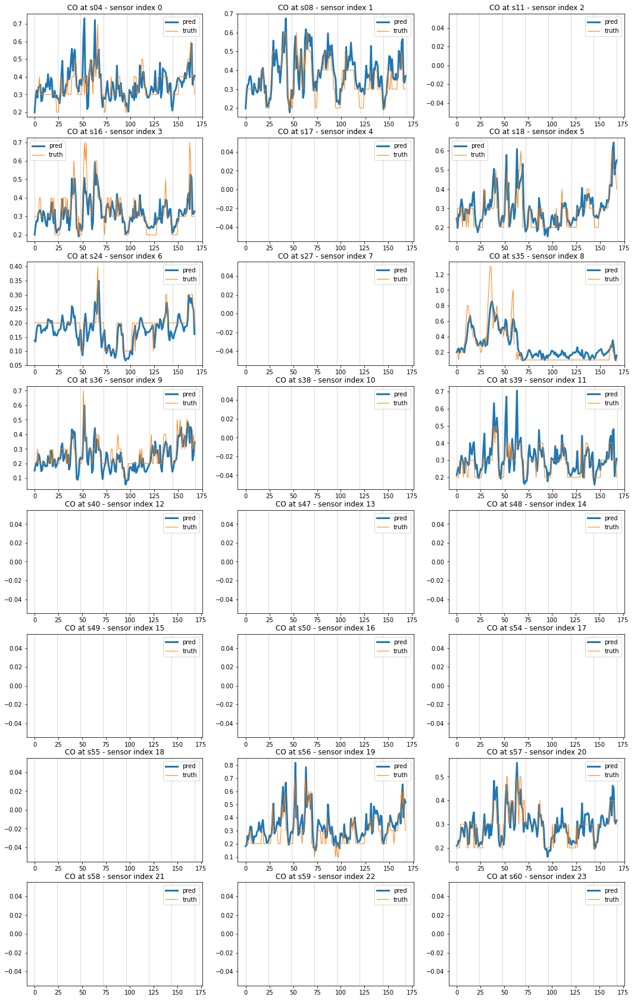

In [324]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_CO'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

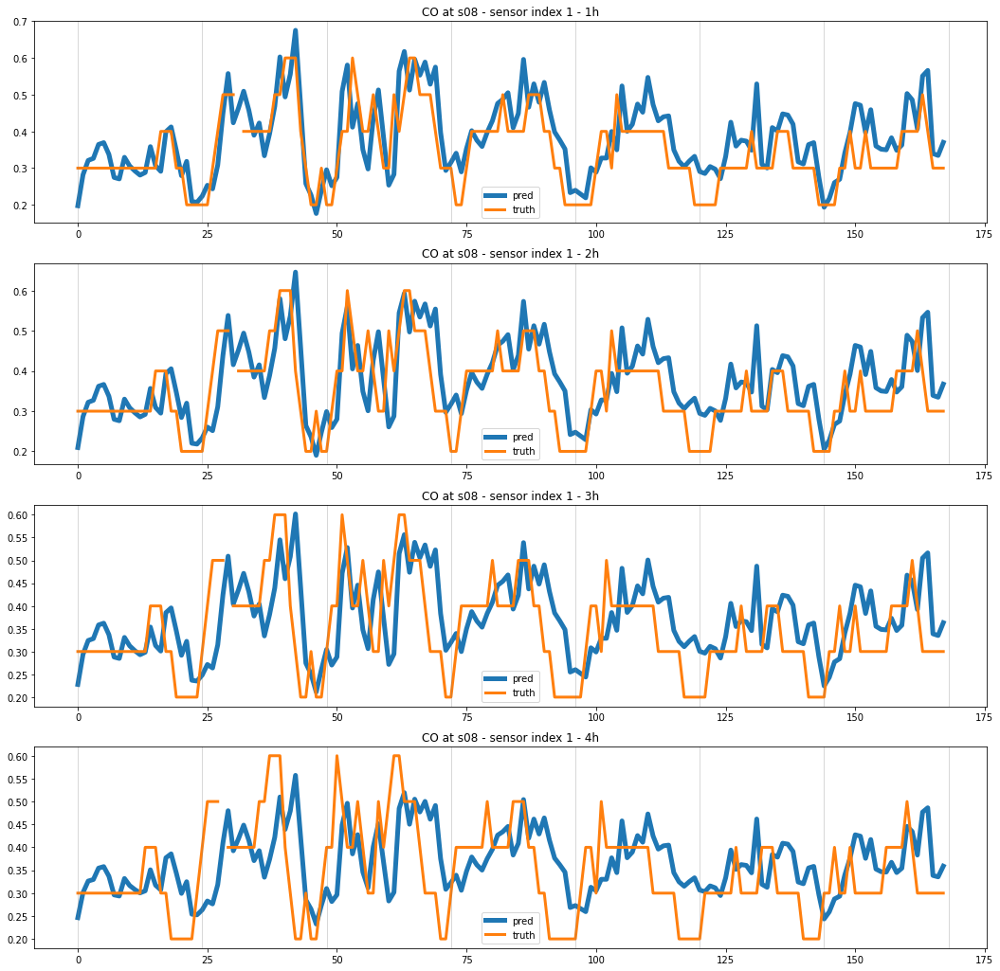

In [325]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_CO'.format(model, scaling, method, ep)
vi = 0
si = 1

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## PM$_{2.5}$

In [327]:
# ------------------------------ #
l.set_idx_v([4]) # --> Only PM25
# ------------------------------ #

### Table comparison

RMSE:

In [253]:
result_table(experiment='experiment-n_x', idx_v=4, normalized=False)
result_table(experiment='experiment-n_x', idx_v=4, normalized=True)

RMSE h0  RMSE h1  \
PM25                                   n_x ep  time                      
mse  0.001 ST-AQF nearest stand Adamax 24  100 02:27    4.659    5.303   
                                       16  100 01:45    4.685    5.366   
                                       20  100 02:26    4.778    5.413   
                                       12  100 01:53    4.759    5.445   
                                       8   100 01:24    4.751    5.458   
                                       3   100 00:49    4.734    5.534   
                                       2   100 00:40    4.716    5.553   
                                       1   100 00:32    4.716    5.567   
                                       4   100 00:17    4.839    5.624   

                                                      RMSE h2  RMSE h3    avg  
PM25                                   n_x ep  time                            
mse  0.001 ST-AQF nearest stand Adamax 24  100 02:27    5.662    5.962  5.396  
                                       16  100 01:45    5.728    6.034  5.453  
                                       20  100 02:26    5.740    6.017  5.487  
                                       12  100 01:53    5.811    6.132  5.537  
                                       8   100 01:24    5.833    6.145  5.547  
                                       3   100 00:49    5.943    6.259  5.617  
                                       2   100 00:40    5.975    6.285  5.632  
                                       1   100 00:32    5.989    6.297  5.642  
                                       4   100 00:17    6.024    6.323  5.703

<ipython-input-247-c9752eda8d82>:17: RuntimeWarning: Mean of empty slice
  avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0) if normalized else 1


Avg on the test set per sensor:
 [10.84  8.7   9.84 10.14  9.61  9.26 11.89   nan]


nRMSE h0  nRMSE h1  \
PM25                                   n_x ep  time                        
mse  0.001 ST-AQF nearest stand Adamax 24  100 02:27     0.443     0.508   
                                       20  100 02:26     0.453     0.515   
                                       8   100 01:24     0.463     0.522   
                                       16  100 01:45     0.462     0.527   
                                       4   100 00:17     0.462     0.521   
                                       2   100 00:40     0.465     0.531   
                                       3   100 00:49     0.467     0.533   
                                       1   100 00:32     0.465     0.535   
                                       12  100 01:53     0.469     0.537   

                                                      nRMSE h2  nRMSE h3  \
PM25                                   n_x ep  time                        
mse  0.001 ST-AQF nearest stand Adamax 24  100 02:27     0.545     0.566   
                                       20  100 02:26     0.546     0.571   
                                       8   100 01:24     0.552     0.575   
                                       16  100 01:45     0.559     0.579   
                                       4   100 00:17     0.560     0.593   
                                       2   100 00:40     0.561     0.582   
                                       3   100 00:49     0.565     0.586   
                                       1   100 00:32     0.568     0.587   
                                       12  100 01:53     0.573     0.598   

                                                        avg  
PM25                                   n_x ep  time          
mse  0.001 ST-AQF nearest stand Adamax 24  100 02:27  0.516  
                                       20  100 02:26  0.521  
                                       8   100 01:24  0.528  
                                       16  100 01:45  0.532  
                                       4   100 00:17  0.534  
                                       2   100 00:40  0.535  
                                       3   100 00:49  0.538  
                                       1   100 00:32  0.539  
                                       12  100 01:53  0.544

In [328]:
l.set_experiment('single-variable')

with pd.ExcelWriter('./results-analysis/single-variable-PM25-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'ep', 'model',
                                   'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        df.iloc[:, 7:11] = df.iloc[:, 7:11].astype(float)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'PM25' not in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                interp = h5_in.root._v_attrs['interp']
                scaling = h5_in.root._v_attrs['scaling']
                ep = h5_in.root._v_attrs['epochs']
                model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmedian(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'ep']] = loss, lr, model, interp, scaling, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 7:11].mean()
        df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index = df.index.set_levels(df.index.levels[-1].astype(int), level=-1)
        df.index.set_names([vc, '', '', '', '', '', ''], inplace=True)
        df.dropna(inplace=True)
        display(df.round(3))
        df.to_excel(writer, sheet_name=vc)

RMSE h0  RMSE h1  RMSE h2  \
PM25                                                                         
mse  0.001 ST-AQF      nearest stand Adamax 100    4.740    5.509    5.901   
           persistence nearest stand Adamax 0      4.808    6.382    6.957   

                                                 RMSE h3    avg  
PM25                                                             
mse  0.001 ST-AQF      nearest stand Adamax 100    6.204  5.589  
           persistence nearest stand Adamax 0      7.378  6.381

### True vs predicted

All sensors:

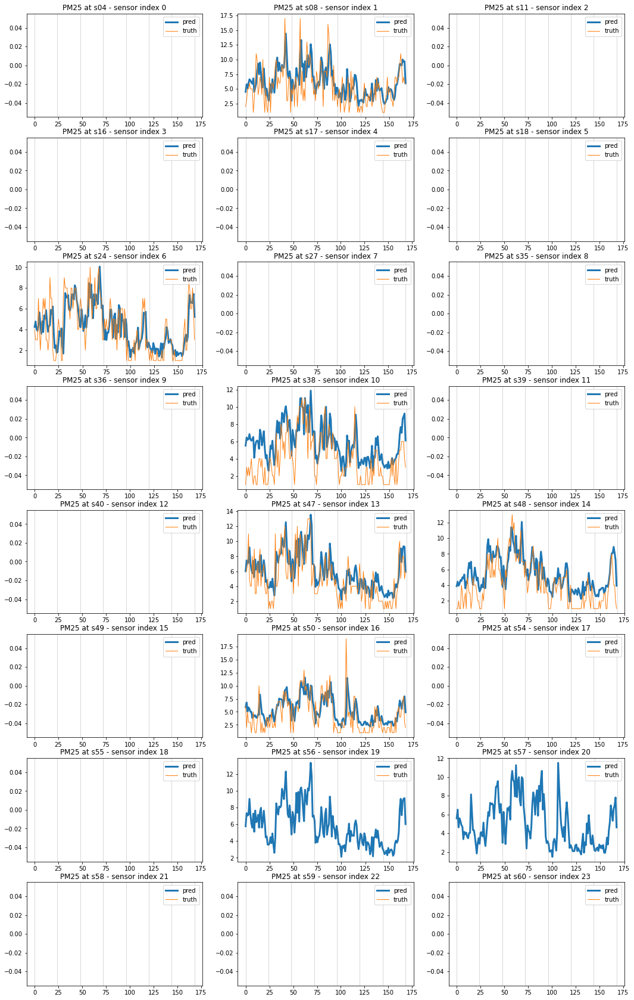

In [331]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_PM25'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

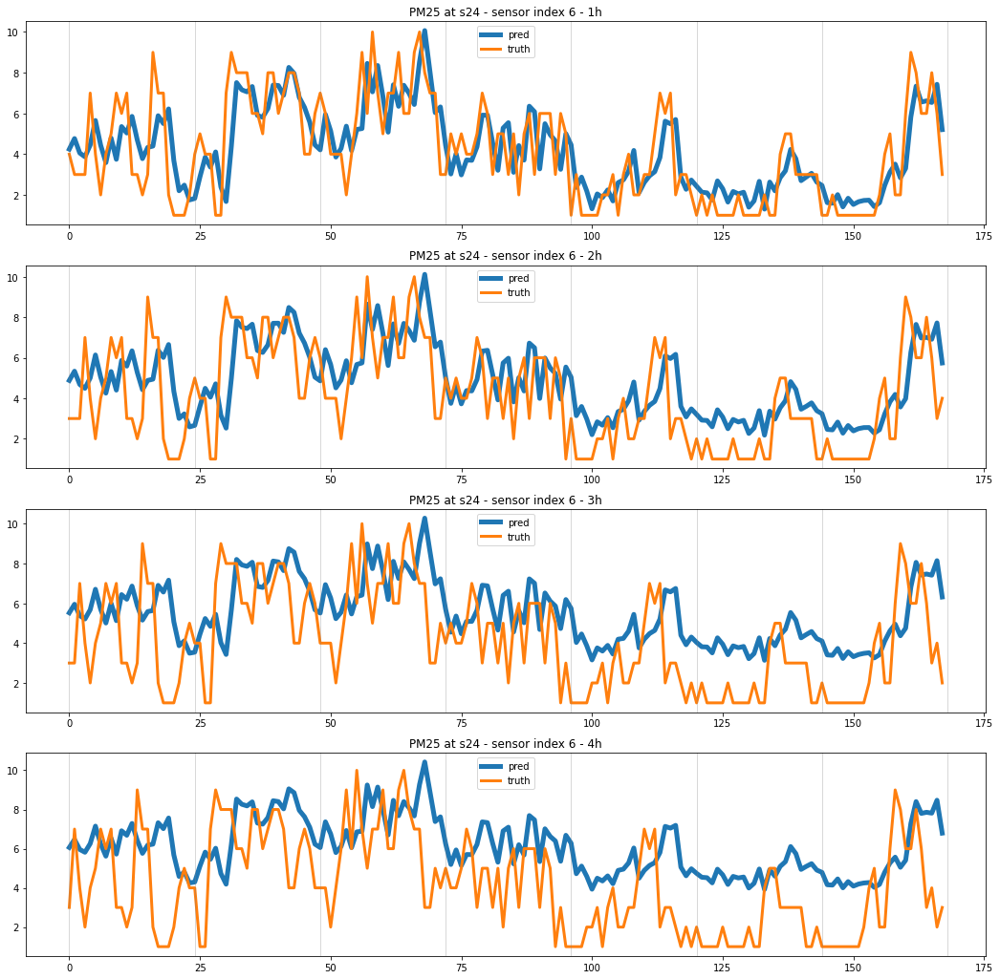

In [333]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_PM25'.format(model, scaling, method, ep)
vi = 0
si = 6

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## TOL

In [335]:
# ------------------------------ #
l.set_idx_v([8]) # --> Only TOL
# ------------------------------ #

### Table comparison

RMSE:

In [254]:
result_table(experiment='experiment-n_x', idx_v=8, normalized=False)
result_table(experiment='experiment-n_x', idx_v=8, normalized=True)

RMSE h0  RMSE h1  \
TOL                                   n_x ep  time                      
mse 0.001 ST-AQF nearest stand Adamax 20  100 02:42    1.728    1.972   
                                      24  100 02:24    1.753    1.970   
                                      16  100 02:16    1.750    1.993   
                                      8   100 01:21    1.715    2.005   
                                      12  100 01:48    1.740    2.002   
                                      2   100 00:41    1.615    2.023   
                                      3   100 00:49    1.647    2.032   
                                      4   100 00:56    1.678    2.035   
                                      1   100 00:33    1.645    2.056   

                                                     RMSE h2  RMSE h3    avg  
TOL                                   n_x ep  time                            
mse 0.001 ST-AQF nearest stand Adamax 20  100 02:42    2.156    2.285  2.035  
                                      24  100 02:24    2.142    2.282  2.037  
                                      16  100 02:16    2.186    2.327  2.064  
                                      8   100 01:21    2.210    2.353  2.071  
                                      12  100 01:48    2.204    2.351  2.074  
                                      2   100 00:41    2.274    2.433  2.086  
                                      3   100 00:49    2.278    2.433  2.097  
                                      4   100 00:56    2.272    2.422  2.102  
                                      1   100 00:33    2.304    2.452  2.114

Avg on the test set per sensor:
 [2.82 1.92 1.76 1.3  1.89 1.64]


nRMSE h0  nRMSE h1  \
TOL                                   n_x ep  time                        
mse 0.001 ST-AQF nearest stand Adamax 24  100 02:24     0.976     1.094   
                                      20  100 02:42     0.966     1.097   
                                      8   100 01:21     0.945     1.118   
                                      16  100 02:16     0.981     1.113   
                                      12  100 01:48     0.972     1.105   
                                      2   100 00:41     0.903     1.129   
                                      4   100 00:56     0.927     1.125   
                                      3   100 00:49     0.916     1.127   
                                      1   100 00:33     0.927     1.149   

                                                     nRMSE h2  nRMSE h3    avg  
TOL                                   n_x ep  time                              
mse 0.001 ST-AQF nearest stand Adamax 24  100 02:24     1.182     1.252  1.126  
                                      20  100 02:42     1.191     1.254  1.127  
                                      8   100 01:21     1.214     1.291  1.142  
                                      16  100 02:16     1.205     1.277  1.144  
                                      12  100 01:48     1.209     1.290  1.144  
                                      2   100 00:41     1.249     1.335  1.154  
                                      4   100 00:56     1.247     1.329  1.157  
                                      3   100 00:49     1.251     1.336  1.157  
                                      1   100 00:33     1.265     1.346  1.172

In [336]:
l.set_experiment('single-variable')

with pd.ExcelWriter('./results-analysis/single-variable-TOL-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'ep', 'model',
                                   'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        df.iloc[:, 7:11] = df.iloc[:, 7:11].astype(float)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'TOL' not in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                interp = h5_in.root._v_attrs['interp']
                scaling = h5_in.root._v_attrs['scaling']
                ep = h5_in.root._v_attrs['epochs']
                model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmedian(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'ep']] = loss, lr, model, interp, scaling, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 7:11].mean()
        df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index = df.index.set_levels(df.index.levels[-1].astype(int), level=-1)
        df.index.set_names([vc, '', '', '', '', '', ''], inplace=True)
        df.dropna(inplace=True)
        display(df.round(3))
        df.to_excel(writer, sheet_name=vc)

RMSE h0  RMSE h1  RMSE h2  \
TOL                                                                         
mse 0.001 ST-AQF      nearest stand Adamax 100    1.672    2.037    2.268   
          persistence nearest stand Adamax 0      1.723    2.404    2.774   

                                                RMSE h3    avg  
TOL                                                             
mse 0.001 ST-AQF      nearest stand Adamax 100    2.418  2.099  
          persistence nearest stand Adamax 0      2.990  2.472

### True vs predicted

All sensors:

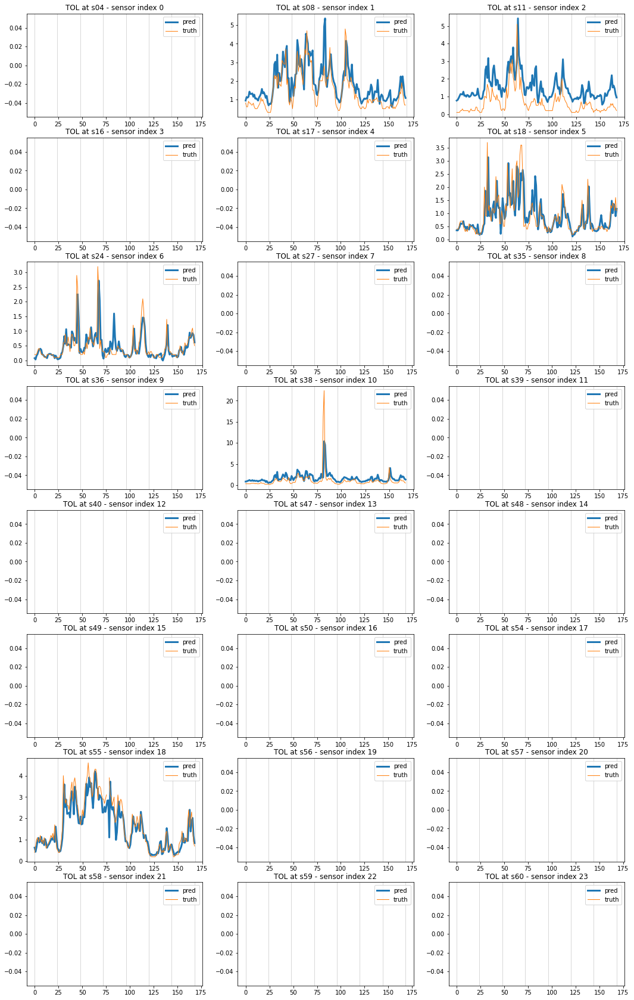

In [337]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_TOL'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

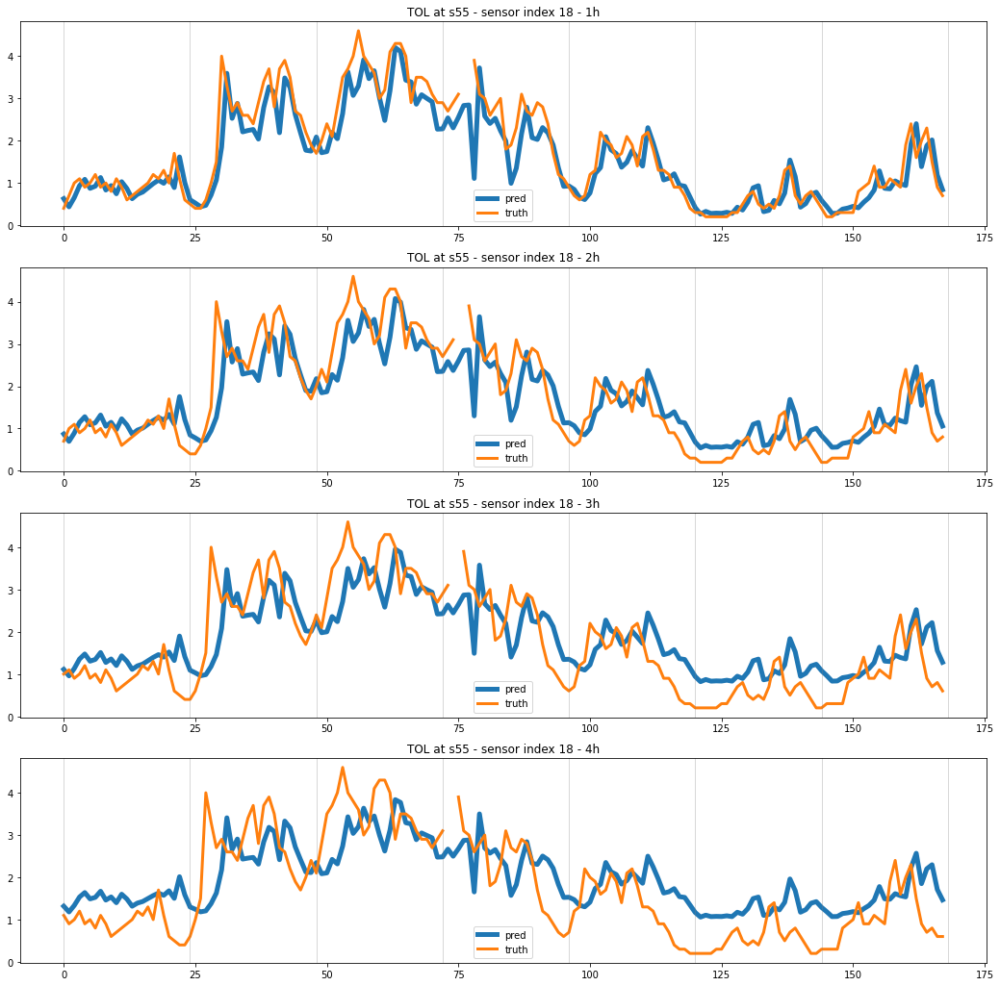

In [340]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_TOL'.format(model, scaling, method, ep)
vi = 0
si = 18

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## BEN

In [342]:
# ------------------------------ #
l.set_idx_v([9]) # --> Only BEN
# ------------------------------ #

### Table comparison

RMSE:

In [255]:
result_table(experiment='experiment-n_x', idx_v=9, normalized=False)
result_table(experiment='experiment-n_x', idx_v=9, normalized=True)

RMSE h0  RMSE h1  \
BEN                                   n_x ep  time                      
mse 0.001 ST-AQF nearest stand Adamax 12  100 01:12    0.314    0.357   
                                      16  100 01:38    0.328    0.357   
                                      8   100 01:19    0.310    0.361   
                                      3   100 00:47    0.293    0.361   
                                      24  100 03:03    0.356    0.366   
                                      2   100 00:40    0.293    0.367   
                                      4   100 00:55    0.304    0.373   
                                      20  100 01:05    0.356    0.379   
                                      1   100 00:33    0.312    0.383   

                                                     RMSE h2  RMSE h3    avg  
BEN                                   n_x ep  time                            
mse 0.001 ST-AQF nearest stand Adamax 12  100 01:12    0.390    0.416  0.369  
                                      16  100 01:38    0.384    0.409  0.369  
                                      8   100 01:19    0.392    0.417  0.370  
                                      3   100 00:47    0.403    0.432  0.372  
                                      24  100 03:03    0.378    0.394  0.374  
                                      2   100 00:40    0.413    0.444  0.379  
                                      4   100 00:55    0.411    0.436  0.381  
                                      20  100 01:05    0.395    0.410  0.385  
                                      1   100 00:33    0.424    0.450  0.392

Avg on the test set per sensor:
 [0.69 0.4  0.34 0.33 0.48 0.4 ]


nRMSE h0  nRMSE h1  \
BEN                                   n_x ep  time                        
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:03     0.740     0.741   
                                      16  100 01:38     0.676     0.740   
                                      12  100 01:12     0.666     0.756   
                                      8   100 01:19     0.674     0.761   
                                      20  100 01:05     0.759     0.805   
                                      3   100 00:47     0.644     0.794   
                                      4   100 00:55     0.672     0.812   
                                      2   100 00:40     0.654     0.829   
                                      1   100 00:33     0.697     0.871   

                                                     nRMSE h2  nRMSE h3    avg  
BEN                                   n_x ep  time                              
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:03     0.777     0.835  0.773  
                                      16  100 01:38     0.820     0.894  0.783  
                                      12  100 01:12     0.845     0.915  0.796  
                                      8   100 01:19     0.851     0.920  0.802  
                                      20  100 01:05     0.848     0.895  0.827  
                                      3   100 00:47     0.914     0.992  0.836  
                                      4   100 00:55     0.919     0.989  0.848  
                                      2   100 00:40     0.951     1.021  0.864  
                                      1   100 00:33     0.975     1.034  0.894

In [343]:
l.set_experiment('single-variable')

with pd.ExcelWriter('./results-analysis/single-variable-BEN-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'ep', 'model',
                                   'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        df.iloc[:, 7:11] = df.iloc[:, 7:11].astype(float)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'BEN' not in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                interp = h5_in.root._v_attrs['interp']
                scaling = h5_in.root._v_attrs['scaling']
                ep = h5_in.root._v_attrs['epochs']
                model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmedian(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'ep']] = loss, lr, model, interp, scaling, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 7:11].mean()
        df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index = df.index.set_levels(df.index.levels[-1].astype(int), level=-1)
        df.index.set_names([vc, '', '', '', '', '', ''], inplace=True)
        df.dropna(inplace=True)
        display(df.round(3))
        df.to_excel(writer, sheet_name=vc)

RMSE h0  RMSE h1  RMSE h2  \
BEN                                                                         
mse 0.001 ST-AQF      nearest stand Adamax 100    0.301    0.364    0.404   
          persistence nearest stand Adamax 0      0.300    0.429    0.484   

                                                RMSE h3    avg  
BEN                                                             
mse 0.001 ST-AQF      nearest stand Adamax 100    0.432  0.375  
          persistence nearest stand Adamax 0      0.524  0.434

### True vs predicted

All sensors:

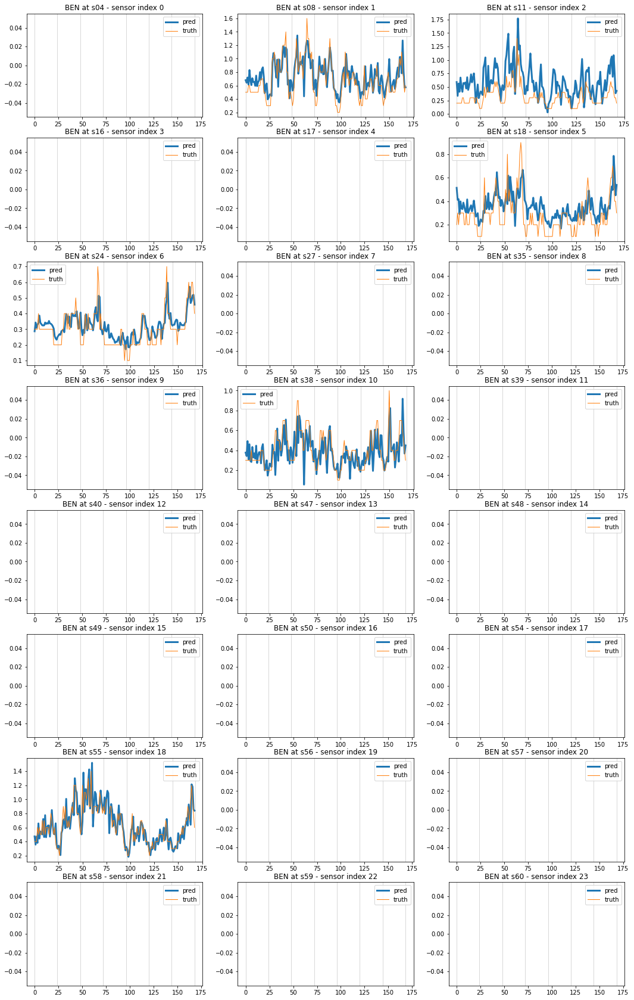

In [344]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_BEN'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

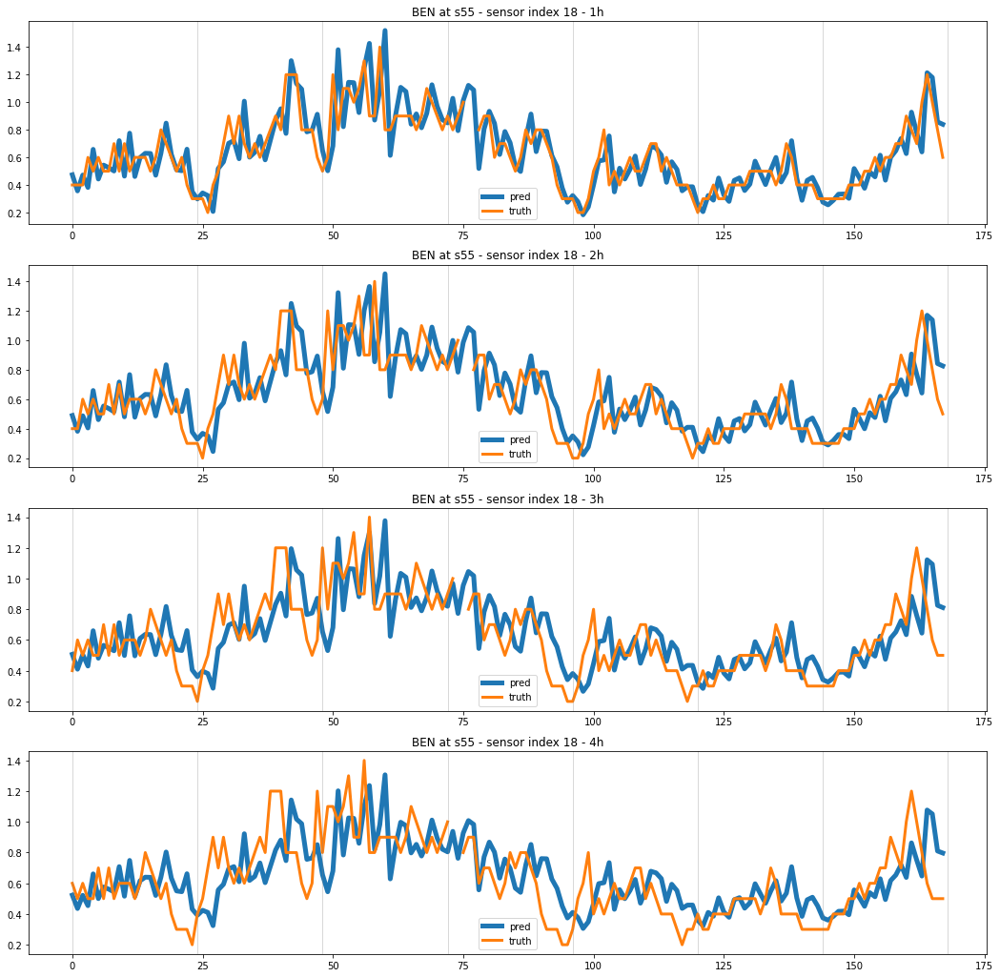

In [346]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_BEN'.format(model, scaling, method, ep)
vi = 0
si = 18

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## EBE

In [348]:
# ------------------------------ #
l.set_idx_v([10]) # --> Only EBE
# ------------------------------ #

### Table comparison

RMSE:

In [256]:
result_table(experiment='experiment-n_x', idx_v=10, normalized=False)
result_table(experiment='experiment-n_x', idx_v=10, normalized=True)

RMSE h0  RMSE h1  \
EBE                                   n_x ep  time                      
mse 0.001 ST-AQF nearest stand Adamax 20  100 01:43    0.554    0.617   
                                      16  100 01:36    0.549    0.615   
                                      24  100 03:12    0.574    0.621   
                                      8   100 01:22    0.550    0.626   
                                      12  100 01:00    0.567    0.631   
                                      3   100 00:47    0.548    0.632   
                                      4   100 00:54    0.551    0.633   
                                      2   100 00:40    0.553    0.636   
                                      1   100 00:28    0.586    0.665   

                                                     RMSE h2  RMSE h3    avg  
EBE                                   n_x ep  time                            
mse 0.001 ST-AQF nearest stand Adamax 20  100 01:43    0.661    0.690  0.631  
                                      16  100 01:36    0.665    0.700  0.632  
                                      24  100 03:12    0.659    0.688  0.636  
                                      8   100 01:22    0.679    0.714  0.642  
                                      12  100 01:00    0.680    0.720  0.650  
                                      3   100 00:47    0.690    0.729  0.650  
                                      4   100 00:54    0.690    0.730  0.651  
                                      2   100 00:40    0.694    0.732  0.653  
                                      1   100 00:28    0.719    0.754  0.681

Avg on the test set per sensor:
 [0.7  0.3  0.3  0.18 1.27 0.28]


nRMSE h0  nRMSE h1  \
EBE                                   n_x ep  time                        
mse 0.001 ST-AQF nearest stand Adamax 8   100 01:22     1.480     1.615   
                                      24  100 03:12     1.512     1.619   
                                      20  100 01:43     1.508     1.631   
                                      4   100 00:54     1.504     1.626   
                                      16  100 01:36     1.538     1.632   
                                      12  100 01:00     1.543     1.650   
                                      3   100 00:47     1.542     1.647   
                                      2   100 00:40     1.538     1.644   
                                      1   100 00:28     1.549     1.668   

                                                     nRMSE h2  nRMSE h3    avg  
EBE                                   n_x ep  time                              
mse 0.001 ST-AQF nearest stand Adamax 8   100 01:22     1.674     1.730  1.625  
                                      24  100 03:12     1.666     1.719  1.629  
                                      20  100 01:43     1.684     1.730  1.638  
                                      4   100 00:54     1.692     1.754  1.644  
                                      16  100 01:36     1.695     1.761  1.656  
                                      12  100 01:00     1.697     1.769  1.665  
                                      3   100 00:47     1.710     1.779  1.670  
                                      2   100 00:40     1.714     1.795  1.673  
                                      1   100 00:28     1.742     1.811  1.692

In [349]:
l.set_experiment('single-variable')

with pd.ExcelWriter('./results-analysis/single-variable-EBE-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'ep', 'model',
                                   'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        df.iloc[:, 7:11] = df.iloc[:, 7:11].astype(float)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'EBE' not in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                interp = h5_in.root._v_attrs['interp']
                scaling = h5_in.root._v_attrs['scaling']
                ep = h5_in.root._v_attrs['epochs']
                model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmedian(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'ep']] = loss, lr, model, interp, scaling, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 7:11].mean()
        df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index = df.index.set_levels(df.index.levels[-1].astype(int), level=-1)
        df.index.set_names([vc, '', '', '', '', '', ''], inplace=True)
        df.dropna(inplace=True)
        display(df.round(3))
        df.to_excel(writer, sheet_name=vc)

RMSE h0  RMSE h1  RMSE h2  \
EBE                                                                         
mse 0.001 ST-AQF      nearest stand Adamax 100    0.548    0.631    0.688   
          persistence nearest stand Adamax 0      0.573    0.710    0.801   

                                                RMSE h3    avg  
EBE                                                             
mse 0.001 ST-AQF      nearest stand Adamax 100    0.726  0.648  
          persistence nearest stand Adamax 0      0.852  0.734

### True vs predicted

All sensors:

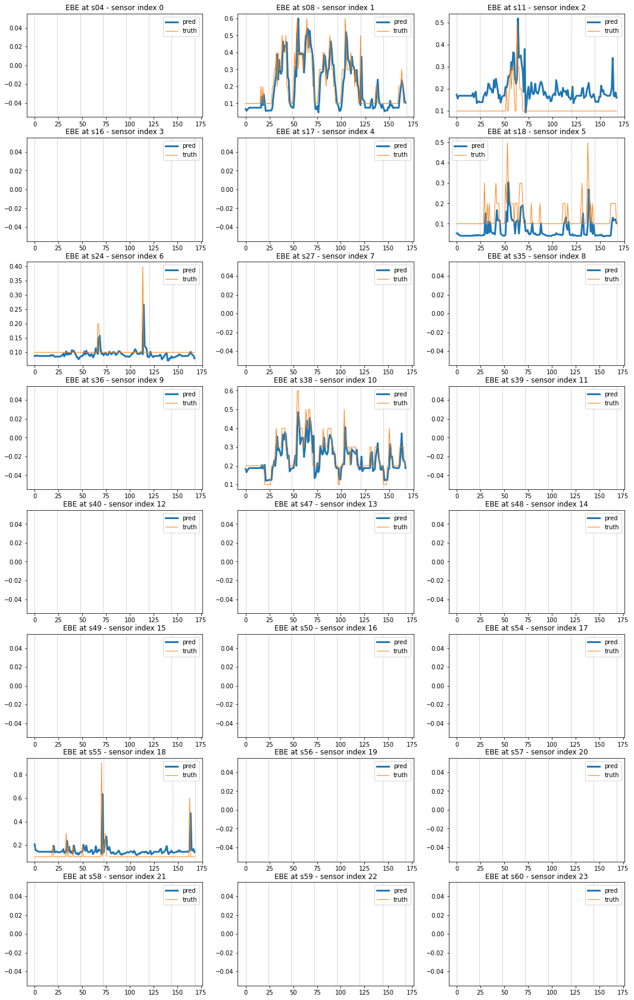

In [350]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_EBE'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

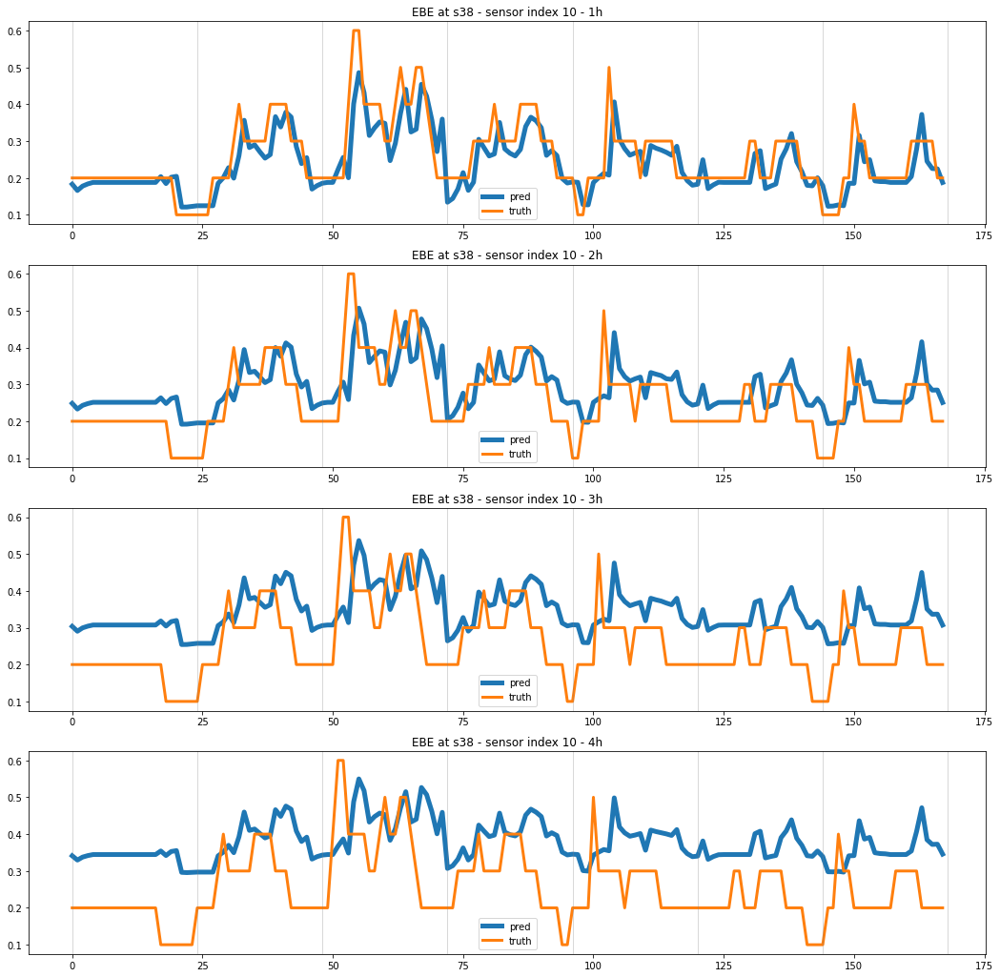

In [351]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_EBE'.format(model, scaling, method, ep)
vi = 0
si = 10

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## NO

In [353]:
# ------------------------------ #
l.set_idx_v([2]) # --> Only NO
# ------------------------------ #

### Table comparison

RMSE:

In [274]:
result_table(experiment='experiment-n_x', idx_v=2, normalized=False)
result_table(experiment='experiment-n_x', idx_v=2, normalized=True)

RMSE h0  RMSE h1  \
NO                                    n_x ep  time                      
mse 0.001 ST-AQF nearest stand Adamax 20  100 02:49   18.166   20.130   
                                      8   100 01:24   17.653   20.335   
                                      16  100 02:22   18.491   20.243   
                                      12  100 01:53   18.444   20.521   
                                      4   100 00:56   17.778   20.797   
                                      24  100 03:16   19.344   21.172   
                                      3   100 00:48   17.805   20.803   
                                      2   100 00:42   17.216   20.976   
                                      1   100 00:34   16.921   22.152   

                                                     RMSE h2  RMSE h3     avg  
NO                                    n_x ep  time                             
mse 0.001 ST-AQF nearest stand Adamax 20  100 02:49   23.942   27.304  22.385  
                                      8   100 01:24   24.146   27.513  22.412  
                                      16  100 02:22   24.344   27.488  22.642  
                                      12  100 01:53   24.345   27.371  22.670  
                                      4   100 00:56   24.747   27.995  22.829  
                                      24  100 03:16   24.268   26.988  22.943  
                                      3   100 00:48   24.943   28.246  22.949  
                                      2   100 00:42   25.608   29.022  23.205  
                                      1   100 00:34   26.727   29.845  23.911

Avg on the test set per sensor:
 [26.21 24.03 17.42 13.36 27.53 15.72  6.87 14.72 18.74 16.64 21.36 19.95
 13.83 16.03 12.27  8.65 20.39 15.86 19.15 38.26 12.51  4.45  9.47 10.71]


nRMSE h0  nRMSE h1  \
NO                                    n_x ep  time                        
mse 0.001 ST-AQF nearest stand Adamax 8   100 01:24     1.203     1.305   
                                      12  100 01:53     1.232     1.328   
                                      20  100 02:49     1.239     1.313   
                                      16  100 02:22     1.216     1.341   
                                      24  100 03:16     1.292     1.328   
                                      3   100 00:48     1.138     1.318   
                                      4   100 00:56     1.166     1.319   
                                      2   100 00:42     1.110     1.363   
                                      1   100 00:34     1.101     1.442   

                                                     nRMSE h2  nRMSE h3    avg  
NO                                    n_x ep  time                              
mse 0.001 ST-AQF nearest stand Adamax 8   100 01:24     1.528     1.746  1.445  
                                      12  100 01:53     1.521     1.735  1.454  
                                      20  100 02:49     1.544     1.750  1.461  
                                      16  100 02:22     1.538     1.770  1.466  
                                      24  100 03:16     1.516     1.740  1.469  
                                      3   100 00:48     1.610     1.815  1.470  
                                      4   100 00:56     1.590     1.819  1.474  
                                      2   100 00:42     1.663     1.856  1.498  
                                      1   100 00:34     1.735     1.919  1.549

In [354]:
l.set_experiment('single-variable')

with pd.ExcelWriter('./results-analysis/single-variable-NO-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'ep', 'model',
                                   'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        df.iloc[:, 7:11] = df.iloc[:, 7:11].astype(float)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'NO.h5' not in fname:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                interp = h5_in.root._v_attrs['interp']
                scaling = h5_in.root._v_attrs['scaling']
                ep = h5_in.root._v_attrs['epochs']
                model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmedian(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'ep']] = loss, lr, model, interp, scaling, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 7:11].mean()
        df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index = df.index.set_levels(df.index.levels[-1].astype(int), level=-1)
        df.index.set_names([vc, '', '', '', '', '', ''], inplace=True)
        df.dropna(inplace=True)
        display(df.round(3))
        df.to_excel(writer, sheet_name=vc)

RMSE h0  RMSE h1  RMSE h2  \
NO                                                                          
mse 0.001 ST-AQF      nearest stand Adamax 100   17.872   20.960   24.840   
          persistence nearest stand Adamax 0     18.233   28.122   34.202   

                                                RMSE h3     avg  
NO                                                               
mse 0.001 ST-AQF      nearest stand Adamax 100   28.181  22.963  
          persistence nearest stand Adamax 0     38.008  29.641

### True vs predicted

All sensors:

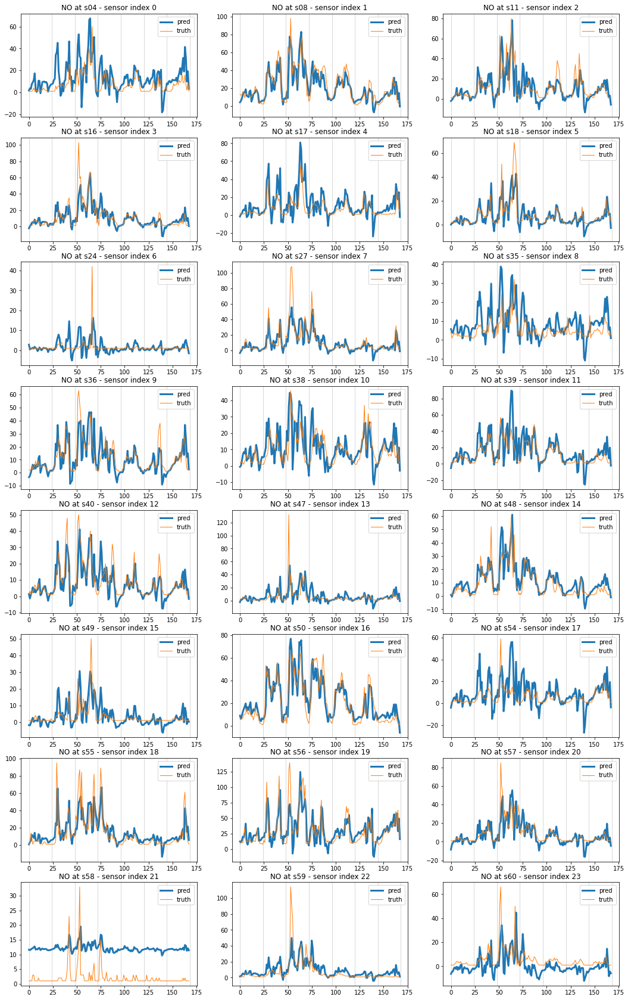

In [355]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_NO'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

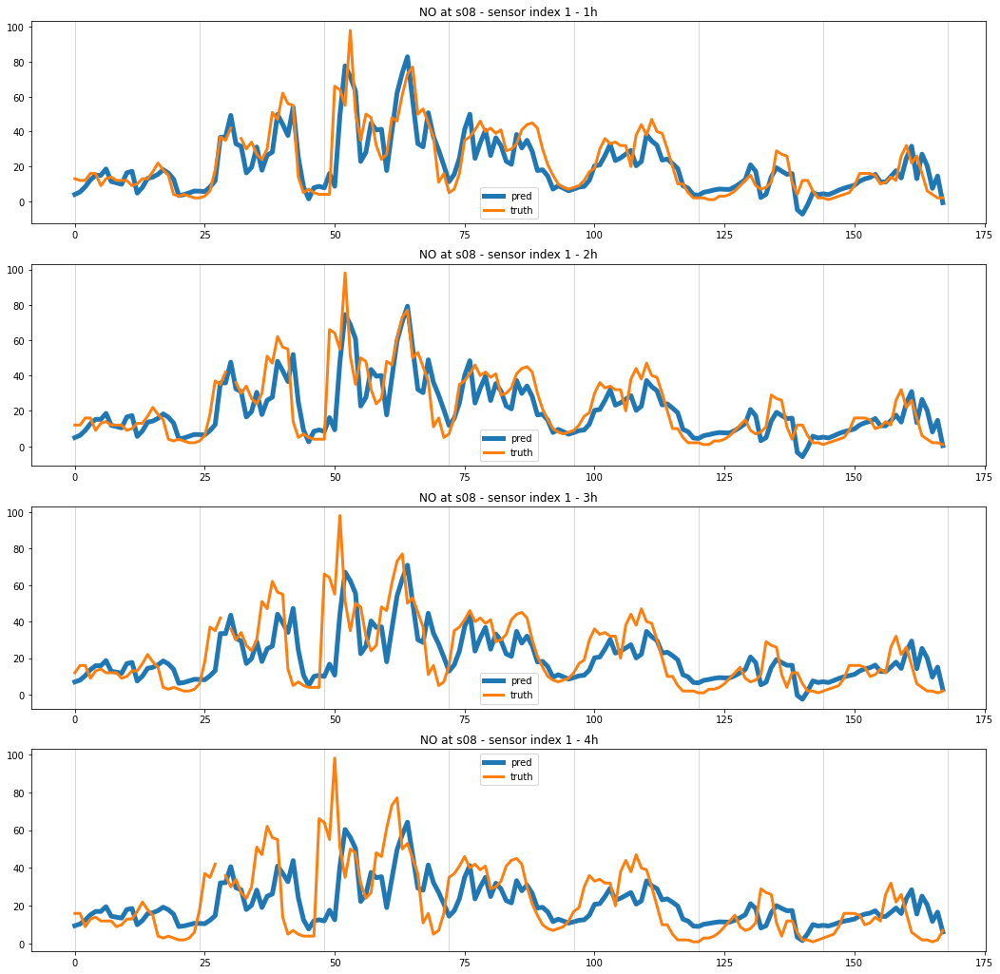

In [356]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_NO'.format(model, scaling, method, ep)
vi = 0
si = 1

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

## NOx

In [358]:
# ------------------------------ #
l.set_idx_v([6]) # --> Only NOx
# ------------------------------ #

### Table comparison

RMSE:

In [275]:
result_table(experiment='experiment-n_x', idx_v=6, normalized=False)
result_table(experiment='experiment-n_x', idx_v=6, normalized=True)

RMSE h0  RMSE h1  \
NOx                                   n_x ep  time                      
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:17   36.704   41.289   
                                      20  100 02:50   37.251   41.974   
                                      12  100 01:53   38.278   41.124   
                                      16  100 02:22   37.592   41.908   
                                      8   100 01:24   36.830   41.597   
                                      4   100 00:56   34.575   42.291   
                                      3   100 00:50   34.556   42.825   
                                      2   100 00:42   34.473   43.775   
                                      1   100 00:35   34.665   47.187   

                                                     RMSE h2  RMSE h3     avg  
NOx                                   n_x ep  time                             
mse 0.001 ST-AQF nearest stand Adamax 24  100 03:17   50.332   57.009  46.334  
                                      20  100 02:50   50.564   56.927  46.679  
                                      12  100 01:53   50.186   57.229  46.704  
                                      16  100 02:22   50.677   57.103  46.820  
                                      8   100 01:24   51.333   58.335  47.024  
                                      4   100 00:56   53.053   59.793  47.428  
                                      3   100 00:50   53.637   60.357  47.844  
                                      2   100 00:42   54.812   61.425  48.621  
                                      1   100 00:35   57.707   63.795  50.839

Avg on the test set per sensor:
 [ 81.57  90.02  67.7   55.94  80.16  57.22  30.58  58.61  69.05  62.91
  72.69  67.84  57.58  58.82  55.31  40.29  69.48  61.31  68.95 111.64
  50.46  22.23  39.96  43.1 ]


nRMSE h0  nRMSE h1  \
NOx                                   n_x ep  time                        
mse 0.001 ST-AQF nearest stand Adamax 20  100 02:50     0.631     0.698   
                                      24  100 03:17     0.636     0.697   
                                      16  100 02:22     0.644     0.706   
                                      8   100 01:24     0.608     0.692   
                                      12  100 01:53     0.645     0.698   
                                      4   100 00:56     0.612     0.714   
                                      3   100 00:50     0.611     0.726   
                                      2   100 00:42     0.593     0.737   
                                      1   100 00:35     0.603     0.789   

                                                     nRMSE h2  nRMSE h3    avg  
NOx                                   n_x ep  time                              
mse 0.001 ST-AQF nearest stand Adamax 20  100 02:50     0.838     0.958  0.781  
                                      24  100 03:17     0.831     0.965  0.782  
                                      16  100 02:22     0.828     0.956  0.784  
                                      8   100 01:24     0.857     0.998  0.789  
                                      12  100 01:53     0.845     0.984  0.793  
                                      4   100 00:56     0.875     1.009  0.803  
                                      3   100 00:50     0.890     1.025  0.813  
                                      2   100 00:42     0.905     1.039  0.819  
                                      1   100 00:35     0.960     1.079  0.858

In [359]:
l.set_experiment('single-variable')

with pd.ExcelWriter('./results-analysis/single-variable-NOx-RMSE.xlsx', mode='w') as writer:
    for id_v in range(len(l.idx_v)):
        vc = list(l.vn_map.keys())[id_v]
        df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'ep', 'model',
                                   'RMSE h0', 'RMSE h1', 'RMSE h2', 'RMSE h3', 'avg'])
        df.iloc[:, 7:11] = df.iloc[:, 7:11].astype(float)
        for id_m, mod_name in enumerate(os.listdir(l.models_path)):
            fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
            if not os.path.exists(fname) or 'NOx' not in mod_name:
                df.loc[id_m] = np.nan
                continue
            with tb.open_file(fname, mode='r') as h5_in:
                rmse = h5_in.root._v_attrs['rmse_mod']
                loss = h5_in.root._v_attrs['loss']
                lr = h5_in.root._v_attrs['lr']
                interp = h5_in.root._v_attrs['interp']
                scaling = h5_in.root._v_attrs['scaling']
                ep = h5_in.root._v_attrs['epochs']
                model = 'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else h5_in.root._v_attrs['name'].split('_')[0]
                opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
            for h in range(4):
                df.loc[id_m, 'RMSE h'+str(h)] = np.nanmedian(rmse[h, :, id_v])
            df.loc[id_m, ['loss', 'lr','model', 'interp', 'scaling', 'opt', 'ep']] = loss, lr, model, interp, scaling, opt, ep
            df.loc[id_m, 'avg'] = df.iloc[id_m, 7:11].mean()
        df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep'], inplace=True)
        df.sort_index(inplace=True)
        df.sort_values('avg', inplace=True)
        df.index = df.index.set_levels(df.index.levels[-1].astype(int), level=-1)
        df.index.set_names([vc, '', '', '', '', '', ''], inplace=True)
        df.dropna(inplace=True)
        display(df.round(3))
        df.to_excel(writer, sheet_name=vc)

RMSE h0  RMSE h1  RMSE h2  \
NOx                                                                         
mse 0.001 ST-AQF      nearest stand Adamax 100   35.614   42.067   52.669   
          persistence nearest stand Adamax 0     37.086   58.075   71.714   

                                                RMSE h3     avg  
NOx                                                              
mse 0.001 ST-AQF      nearest stand Adamax 100   59.295  47.411  
          persistence nearest stand Adamax 0     80.494  61.842

In [388]:
g = 'NOx'
fname = '../models/madrid/single-variable/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}.h5'
with tb.open_file(fname.format(g, g), mode='r') as h5_in:
    print('It took {} in total'.format(time.strftime('%H:%M:%S', time.gmtime(h5_in.root._v_attrs['train_duration_s']))))

It took 07:41:33 in total


### True vs predicted

All sensors:

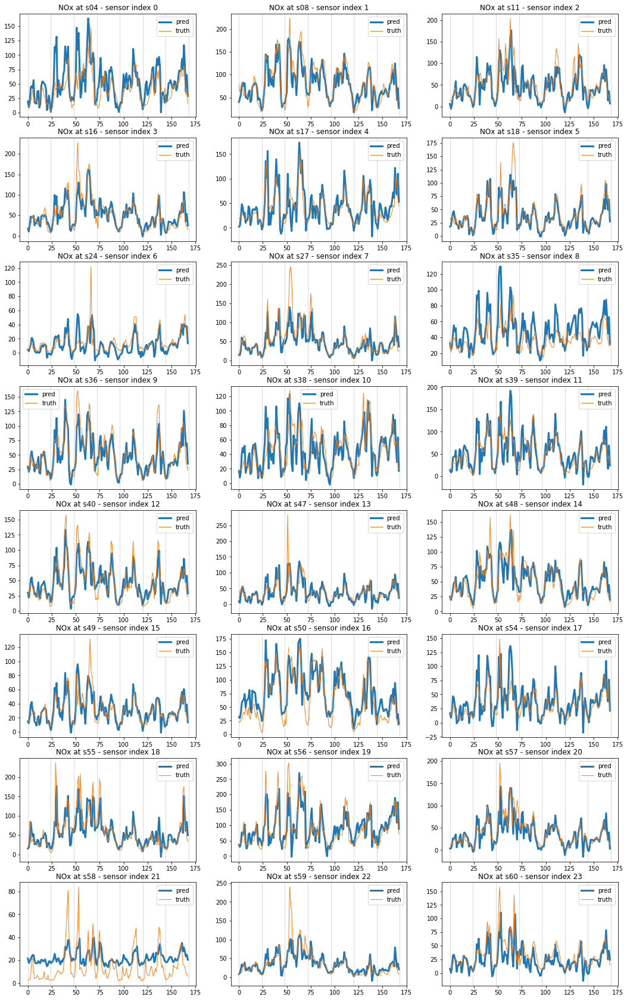

In [360]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_NOx'.format(model, scaling, method, ep)
vi = 0
h = 0

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=None, n_days=7)

One sensor:

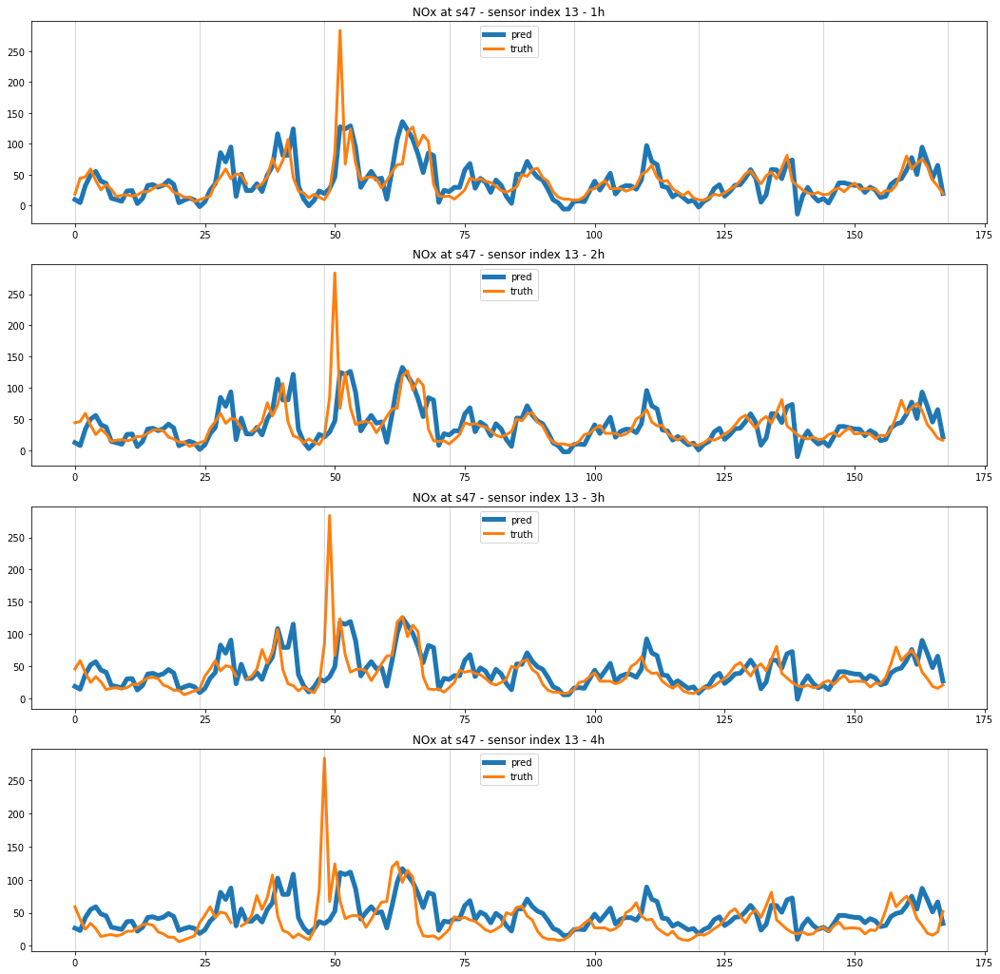

In [361]:
experiment = 'single-variable'
model = 'ST-AQF'
method = 'nearest'
scaling = 'stand'
ep = 100
mod_name = '{}_{}_{}_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep{:03}_NOx'.format(model, scaling, method, ep)
vi = 0
si = 13

true_vs_pred(l, experiment, mod_name, vi=vi, h=h, si=si, n_days=7)

# All variables

In [ ]:
import sys
sys.path.append('../src/')
import learner

import importlib
importlib.reload(learner)

l = learner.DeepLearner()

l.vc_map

In [84]:
def result_table(experiment, n_v=11, normalized=True):
    # Preparation
    l = learner.DeepLearner()
    l.set_idx_v(np.arange(n_v))
    l.set_experiment(experiment)
    err = 'nRMSE' if normalized else 'RMSE'
    df = pd.DataFrame(columns=['loss', 'lr', 'interp', 'scaling', 'opt', 'n_x', 'ep', 'time', 'model', 'vn',
                               err + ' h0', err + ' h1', err + ' h2', err + ' h3', 'avg'])
    df.iloc[:, 9:13] = df.iloc[:, 9:13].astype(float)
    for id_m, mod_name in enumerate(os.listdir(l.models_path)):
        fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
        if not os.path.exists(fname):# or (vn+'.h5') not in fname:
            df.loc[id_m] = np.nan
            continue
        with tb.open_file(fname, mode='r') as h5_in:
            rmse = h5_in.root._v_attrs['rmse_mod']
            loss = h5_in.root._v_attrs['loss']
            lr = h5_in.root._v_attrs['lr']
            interp = h5_in.root._v_attrs['interp']
            scaling = h5_in.root._v_attrs['scaling']
            n_x = h5_in.root._v_attrs['n_x']
            ep = h5_in.root._v_attrs['epochs']
            t = time.strftime('%H:%M', time.gmtime(h5_in.root._v_attrs['train_duration_s']))
            #'ST-AQF' if 'ST' in h5_in.root._v_attrs['name'] else 
            model = h5_in.root._v_attrs['name'].split('_')[0]
            opt = str(h5_in.root._v_attrs['optimizer']).split('.')[-1][:-2]
        for id_v in range(len(l.idx_v)):
            vc = list(l.vc_map.keys())[id_v]
            vn = list(l.vn_map.keys())[id_v]
            # Compute average value of test set:
            with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
                avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0) if normalized else 1
            idx = n_v * id_m + id_v
            for h in range(4):
                df.loc[idx, err+' h'+str(h)] = np.nanmedian(rmse[h, l.vi_si_map[id_v], id_v] / avg_t)
            df.loc[idx, ['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep', 'vn', 'n_x', 'time']] = \
                loss, lr, model, interp, scaling, opt, ep, vn, n_x, t
            df.loc[idx, 'avg'] = df.iloc[idx, 10:14].mean()    
    df.dropna(inplace=True)
    df.iloc[:, 5] = df.iloc[:, 5].astype(int)
    df.set_index(['loss', 'lr', 'model', 'interp', 'scaling', 'opt', 'ep', 'vn', 'n_x', 'time'], inplace=True)
    df.sort_index(inplace=True)
    #df.sort_values('avg', inplace=True)
    #df.index = df.index.set_levels(df.index.levels[-3].astype(int), level=-3)
    #df.index = df.index.set_levels(df.index.levels[-3].astype(int), level=-3)
    #df.index.set_names(['', '', '', '', '', '', 'n_x', 'ep', 'time'], inplace=True)

    display(df.round(3))
    with pd.ExcelWriter('./results-analysis/all-variables-{}.xlsx'.format(err), mode='w') as writer:
        df.to_excel(writer, sheet_name=err)

In [80]:
pd.options.display.max_rows = 11 * 9

## Experiment n_x

In [85]:
result_table(experiment='experiment-n_x', normalized=False)
result_table(experiment='experiment-n_x', normalized=True)

RMSE h0  \
loss lr    model  interp  scaling opt    ep    vn   n_x time             
mse  0.001 ST-AQF nearest stand   Adamax 100.0 BEN  1   00:53    0.580   
                                                    2   01:13    0.462   
                                                    3   01:42    0.458   
                                                    4   00:56    0.491   
                                                    8   02:55    0.492   
                                                    12  04:48    0.489   
                                                    16  04:44    0.479   
                                                    20  04:44    0.487   
                                                    24  05:49    0.531   
                                               CO   1   00:53    0.173   
                                                    2   01:13    0.160   
                                                    3   01:42    0.158   
                                                    4   00:56    0.163   
                                                    8   02:55    0.161   
                                                    12  04:48    0.165   
                                                    16  04:44    0.166   
                                                    20  04:44    0.166   
                                                    24  05:49    0.168   
                                               EBE  1   00:53    0.969   
                                                    2   01:13    0.904   
                                                    3   01:42    0.901   
                                                    4   00:56    0.908   
                                                    8   02:55    0.903   
                                                    12  04:48    0.899   
                                                    16  04:44    0.905   
                                                    20  04:44    0.906   
                                                    24  05:49    0.916   
                                               NO   1   00:53   30.678   
                                                    2   01:13   24.795   
                                                    3   01:42   25.182   
                                                    4   00:56   26.977   
                                                    8   02:55   26.680   
                                                    12  04:48   27.119   
                                                    16  04:44   25.718   
                                                    20  04:44   25.124   
                                                    24  05:49   27.203   
                                               NO2  1   00:53   18.459   
                                                    2   01:13   18.469   
                                                    3   01:42   17.794   
                                                    4   00:56   17.674   
                                                    8   02:55   17.223   
                                                    12  04:48   17.656   
                                                    16  04:44   18.289   
                                                    20  04:44   18.174   
                                                    24  05:49   18.480   
                                               NOx  1   00:53   54.751   
                                                    2   01:13   46.632   
                                                    3   01:42   45.087   
                                                    4   00:56   49.248   
                                                    8   02:55   48.401   
                                                    12  04:48   50.601   
                                                    16  04:44   49.261   
                                                    20  04:44   46.

<ipython-input-84-74d695b9f3e5>:32: RuntimeWarning: Mean of empty slice
  avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0) if normalized else 1


nRMSE h0  \
loss lr    model  interp  scaling opt    ep    vn   n_x time              
mse  0.001 ST-AQF nearest stand   Adamax 100.0 BEN  1   00:53     1.383   
                                                    2   01:13     1.104   
                                                    3   01:42     1.147   
                                                    4   00:56     1.189   
                                                    8   02:55     1.208   
                                                    12  04:48     1.221   
                                                    16  04:44     1.183   
                                                    20  04:44     1.207   
                                                    24  05:49     1.210   
                                               CO   1   00:53     0.523   
                                                    2   01:13     0.505   
                                                    3   01:42     0.500   
                                                    4   00:56     0.494   
                                                    8   02:55     0.498   
                                                    12  04:48     0.511   
                                                    16  04:44     0.509   
                                                    20  04:44     0.506   
                                                    24  05:49     0.506   
                                               EBE  1   00:53     2.169   
                                                    2   01:13     2.144   
                                                    3   01:42     2.186   
                                                    4   00:56     2.195   
                                                    8   02:55     2.194   
                                                    12  04:48     2.181   
                                                    16  04:44     2.193   
                                                    20  04:44     2.193   
                                                    24  05:49     2.216   
                                               NO   1   00:53     1.774   
                                                    2   01:13     1.532   
                                                    3   01:42     1.537   
                                                    4   00:56     1.662   
                                                    8   02:55     1.662   
                                                    12  04:48     1.651   
                                                    16  04:44     1.594   
                                                    20  04:44     1.581   
                                                    24  05:49     1.679   
                                               NO2  1   00:53     0.481   
                                                    2   01:13     0.513   
                                                    3   01:42     0.496   
                                                    4   00:56     0.495   
                                                    8   02:55     0.486   
                                                    12  04:48     0.487   
                                                    16  04:44     0.505   
                                                    20  04:44     0.514   
                                                    24  05:49     0.499   
                                               NOx  1   00:53     0.872   
                                                    2   01:13     0.775   
                                                    3   01:42     0.767   
                                                    4   00:56     0.811   
                                                    8   02:55     0.812   
                                                    12  04:48     0.803   
                                                    16  04:44     0.804   
             

## Experiment integrability

In [86]:
result_table(experiment='experiment-integrability', normalized=False)
result_table(experiment='experiment-integrability', normalized=True)

RMSE h0  \
loss lr    model    interp  scaling opt    ep    vn   n_x time             
mse  0.001 ST-AQF-t nearest stand   Adamax 100.0 BEN  1   00:49    0.602   
                                                      2   01:02    0.463   
                                                      3   01:08    0.484   
                                                      4   00:33    0.450   
                                                      8   02:27    0.497   
                                                      12  02:33    0.463   
                                                      16  03:01    0.479   
                                                      20  03:56    0.468   
                                                      24  03:30    0.453   
                                                 CO   1   00:49    0.179   
                                                      2   01:02    0.159   
                                                      3   01:08    0.163   
                                                      4   00:33    0.164   
                                                      8   02:27    0.166   
                                                      12  02:33    0.161   
                                                      16  03:01    0.161   
                                                      20  03:56    0.162   
                                                      24  03:30    0.158   
                                                 EBE  1   00:49    0.966   
                                                      2   01:02    0.902   
                                                      3   01:08    0.907   
                                                      4   00:33    0.901   
                                                      8   02:27    0.900   
                                                      12  02:33    0.904   
                                                      16  03:01    0.906   
                                                      20  03:56    0.903   
                                                      24  03:30    0.905   
                                                 NO   1   00:49   31.501   
                                                      2   01:02   24.808   
                                                      3   01:08   26.074   
                                                      4   00:33   24.275   
                                                      8   02:27   26.241   
                                                      12  02:33   25.423   
                                                      16  03:01   26.189   
                                                      20  03:56   24.621   
                                                      24  03:30   24.874   
                                                 NO2  1   00:49   18.014   
                                                      2   01:02   17.657   
                                                      3   01:08   18.508   
                                                      4   00:33   17.435   
                                                      8   02:27   18.250   
                                                      12  02:33   17.638   
                                                      16  03:01   18.104   
                                                      20  03:56   18.260   
                                                      24  03:30   17.172   
                                                 NOx  1   00:49   59.202   
                                                      2   01:02   46.062   
                                                      3   01:08   49.316   
                                                      4   00:33   44.812   
                                                      8   02:27   49.929   
                                                      12  02:33   47.376   
                                     

<ipython-input-84-74d695b9f3e5>:32: RuntimeWarning: Mean of empty slice
  avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0) if normalized else 1


nRMSE h0  \
loss lr    model    interp  scaling opt    ep    vn   n_x time              
mse  0.001 ST-AQF-t nearest stand   Adamax 100.0 BEN  1   00:49     1.428   
                                                      2   01:02     1.139   
                                                      3   01:08     1.171   
                                                      4   00:33     1.056   
                                                      8   02:27     1.152   
                                                      12  02:33     1.139   
                                                      16  03:01     1.221   
                                                      20  03:56     1.123   
                                                      24  03:30     1.123   
                                                 CO   1   00:49     0.521   
                                                      2   01:02     0.499   
                                                      3   01:08     0.511   
                                                      4   00:33     0.500   
                                                      8   02:27     0.503   
                                                      12  02:33     0.495   
                                                      16  03:01     0.499   
                                                      20  03:56     0.500   
                                                      24  03:30     0.480   
                                                 EBE  1   00:49     2.203   
                                                      2   01:02     2.185   
                                                      3   01:08     2.168   
                                                      4   00:33     2.201   
                                                      8   02:27     2.174   
                                                      12  02:33     2.181   
                                                      16  03:01     2.189   
                                                      20  03:56     2.164   
                                                      24  03:30     2.206   
                                                 NO   1   00:49     1.877   
                                                      2   01:02     1.552   
                                                      3   01:08     1.581   
                                                      4   00:33     1.512   
                                                      8   02:27     1.642   
                                                      12  02:33     1.556   
                                                      16  03:01     1.602   
                                                      20  03:56     1.560   
                                                      24  03:30     1.545   
                                                 NO2  1   00:49     0.483   
                                                      2   01:02     0.501   
                                                      3   01:08     0.521   
                                                      4   00:33     0.502   
                                                      8   02:27     0.508   
                                                      12  02:33     0.501   
                                                      16  03:01     0.502   
                                                      20  03:56     0.508   
                                                      24  03:30     0.481   
                                                 NOx  1   00:49     0.916   
                                                      2   01:02     0.770   
                                                      3   01:08     0.806   
                                                      4   00:33     0.781   
                                                      8   02:27     0.821   
                                                      12  02:

## Experiment extensibility

# Generate true vs predicted plots

In [4]:
import sys
sys.path.append('../src/')
import learner

import importlib
importlib.reload(learner)

l = learner.DeepLearner()

l.vc_map

OrderedDict([('01', 'SO2'),
             ('06', 'CO'),
             ('07', 'NO'),
             ('08', 'NO2'),
             ('09', 'PM25'),
             ('10', 'PM10'),
             ('12', 'NOx'),
             ('14', 'O3'),
             ('20', 'TOL'),
             ('30', 'BEN'),
             ('35', 'EBE')])

In [6]:
experiment = 'experiment-n_x'
l.set_experiment(experiment)
models_path = l.models_path

for id_m, mod_name in enumerate(os.listdir(models_path)):
    fname = os.path.join(l.models_path, mod_name, mod_name + '.h5')
    if not os.path.exists(fname):
        continue
#    print(fname)
    with tb.open_file(fname, mode='r') as h5_in:
        idx_v = h5_in.root._v_attrs['idx_v']
        n_x = h5_in.root._v_attrs['n_x']
        scaling = h5_in.root._v_attrs['scaling']
    l = learner.DeepLearner()
    l.set_idx_v(idx_v)
    l.set_n_x(n_x)
    l.set_scaling(scaling)
    model = l.models.load_model(fname)
    model.mod_name = mod_name
    l._DeepLearner__test_date(model, date='15/01/2019', n_days=7)
    l._DeepLearner__test_date(model, date='15/04/2019', n_days=7)
    l._DeepLearner__test_date(model, date='15/07/2019', n_days=7)
    l._DeepLearner__test_date(model, date='15/11/2019', n_days=7)
#    break

# n_x comparison

## h vs nRMSE

In [128]:
mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx{:02}_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'
vn = 'O3'
vc = l.vn_map[vn]

<ipython-input-134-afaccadf6984>:8: RuntimeWarning: Mean of empty slice
  avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)


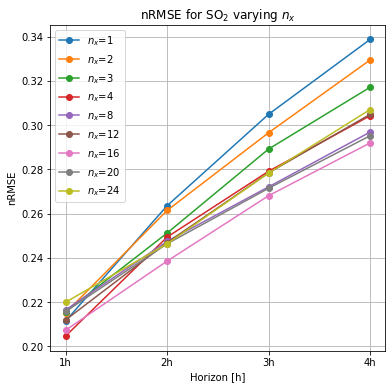

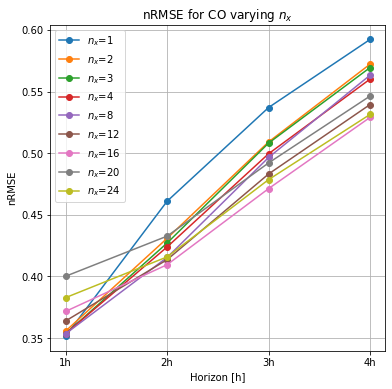

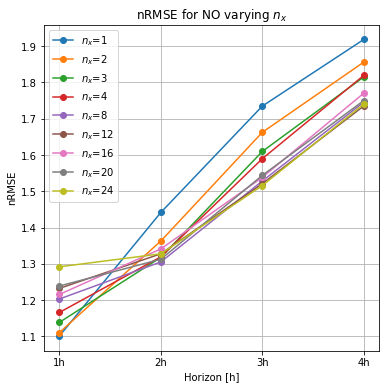

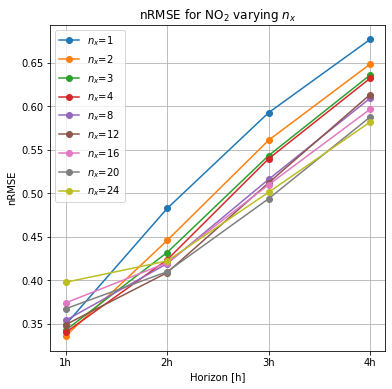

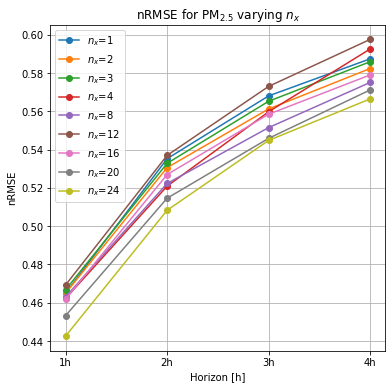

...

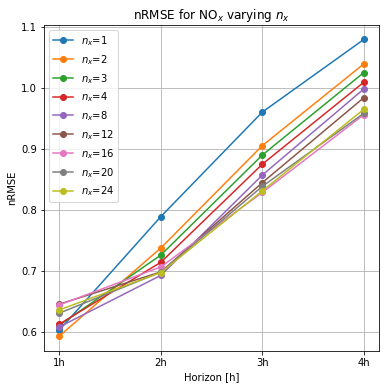

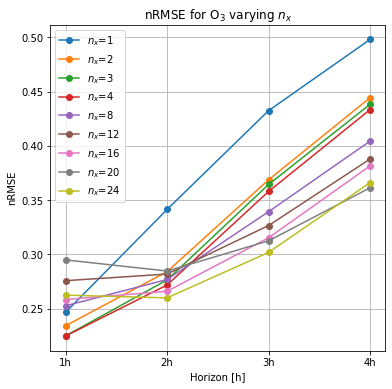

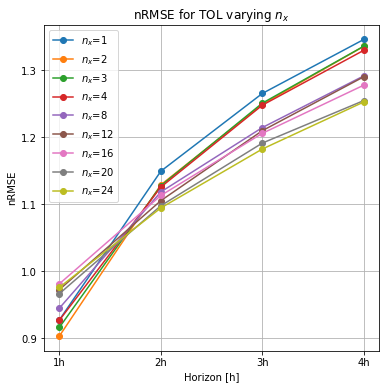

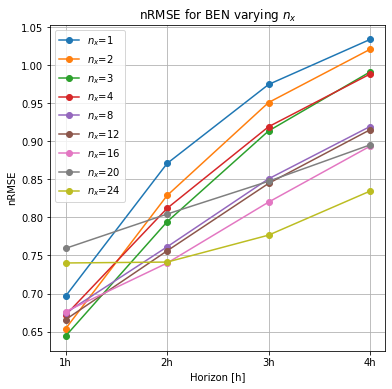

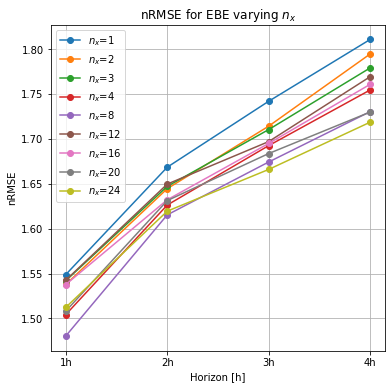

In [134]:
n_xs = [1, 2, 3, 4, 8, 12, 16, 20, 24]
vns = ['PM25', 'PM10', 'O3', 'NO', 'NO2', 'NOx', 'SO2', 'CO' , 'TOL', 'BEN', 'EBE']
nrmse = {}

for id_v, vn in enumerate(list(l.vn_map.keys())):
    vc = l.vn_map[vn]
    with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
        avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)
    
    fig, ax = plt.subplots()
    fig.set_size_inches(6, 6)
    for idx, n_x in enumerate(n_xs):
        with tb.open_file(os.path.join(mod_path, mod_name.format(n_x, vn), mod_name.format(n_x, vn) + '.h5'), mode='r') as h5_in:
            nrmse = np.empty((l.n_y,))
            for h in range(4):
                nrmse[h] = np.nanmedian(h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v], 0] / avg_t)    
        ax.plot(['{}h'.format(i) for i in [1, 2, 3, 4]], nrmse, '-o', label='$n_x$={}'.format(n_x))
        ax.set_title('nRMSE for {} varying $n_x$'.format(l.vc_map_pretty[l.vn_map[vn]]))
        ax.set_xlabel('Horizon [h]')
        ax.set_ylabel('nRMSE')
        ax.grid()
        ax.legend()
    plt.savefig('./graphs/experiment-n_x-{}.pdf'.format(vn), bbox_inches='tight')

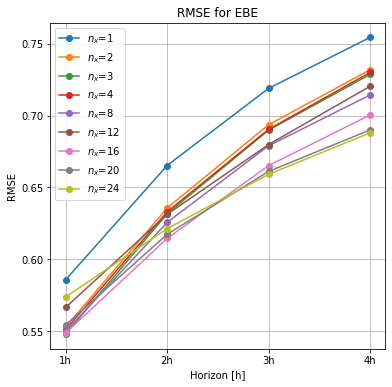

In [135]:
fig, ax = plt.subplots()
fig.set_size_inches(6, 6)
n_xs = [1, 2, 3, 4, 8, 12, 16, 20, 24]
for n_x in n_xs:
    with tb.open_file(os.path.join(mod_path, mod_name.format(n_x, vn), mod_name.format(n_x, vn) + '.h5'), mode='r') as h5_in:
        rmse = h5_in.root._v_attrs['rmse_mod']
        ax.plot(['{}h'.format(i) for i in [1, 2, 3, 4]], np.nanmedian(rmse, axis=1), '-o', label='$n_x$={}'.format(n_x))
ax.set_title('RMSE for ' + l.vc_map_pretty[l.vn_map[vn]])
ax.set_xlabel('Horizon [h]')
ax.set_ylabel('RMSE')
ax.grid()
ax.legend()
plt.show()

## n_x vs nRMSE

<ipython-input-137-5ec23475223b>:10: RuntimeWarning: Mean of empty slice
  avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)


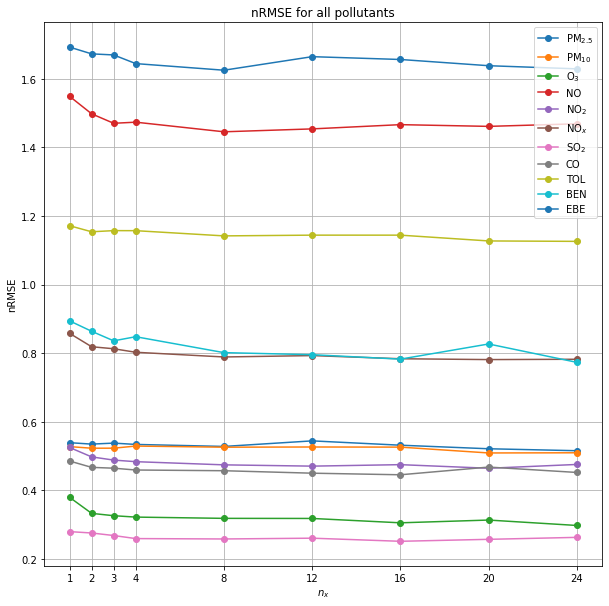

In [137]:
fig, ax = plt.subplots()
fig.set_size_inches(10, 10)
n_xs = [1, 2, 3, 4, 8, 12, 16, 20, 24]
vns = ['PM25', 'PM10', 'O3', 'NO', 'NO2', 'NOx', 'SO2', 'CO' , 'TOL', 'BEN', 'EBE']
nrmse = {}

for id_v, vn in enumerate(list(l.vn_map.keys())):
    vc = l.vn_map[vn]
    with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
        avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)
    
    rmses = np.empty((len(n_xs),))
    for idx, n_x in enumerate(n_xs):
        with tb.open_file(os.path.join(mod_path, mod_name.format(n_x, vn), mod_name.format(n_x, vn) + '.h5'), mode='r') as h5_in:
            aux = np.empty((l.n_y,))
            for h in range(4):
                aux[h] = np.nanmedian(h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v], 0] / avg_t)
            rmses[idx] = np.mean(aux)
    nrmse[vn] = rmses
for vn in vns:
    ax.plot(n_xs, nrmse[vn], '-o', label=l.vc_map_pretty[l.vn_map[vn]])
ax.set_title('nRMSE for all pollutants')
ax.set_xlabel('$n_x$')
ax.set_xticks(n_xs)
ax.set_ylabel('nRMSE')
ax.grid()
ax.legend()
plt.savefig('./graphs/experiment-n_x_allComb.pdf', bbox_inches='tight')
plt.show()

<ipython-input-132-2a1b95409c44>:11: RuntimeWarning: Mean of empty slice
  avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)


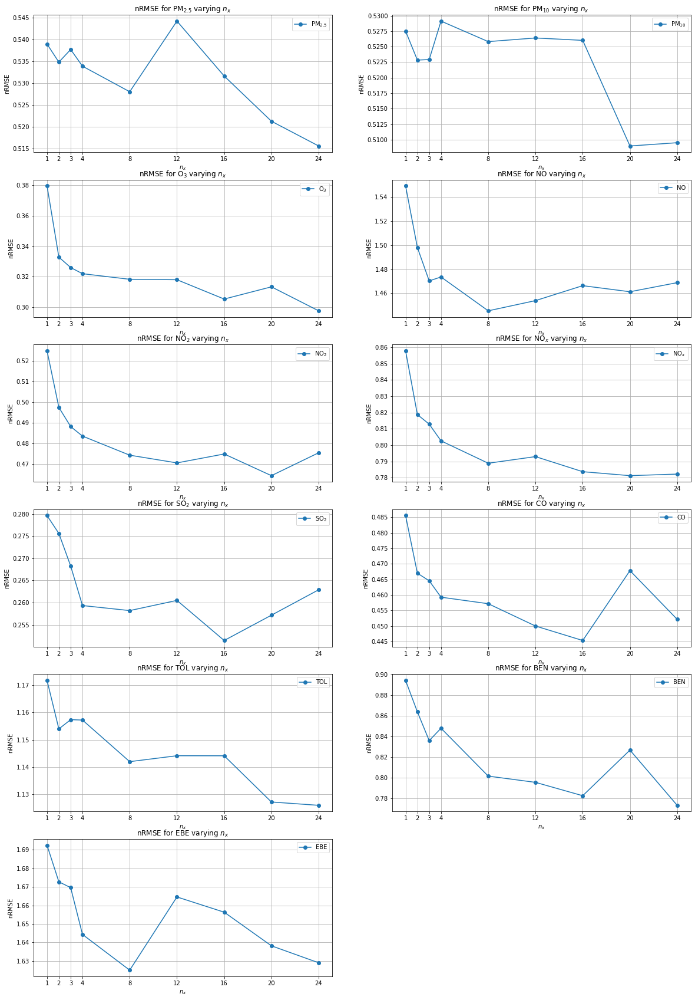

In [132]:
fig, ax = plt.subplots(6,2)
axs = ax.ravel()
fig.set_size_inches(20, 30)
n_xs = [1, 2, 3, 4, 8, 12, 16, 20, 24]
vns = ['PM25', 'PM10', 'O3', 'NO', 'NO2', 'NOx', 'SO2', 'CO' , 'TOL', 'BEN', 'EBE']
nrmse = {}

for id_v, vn in enumerate(list(l.vn_map.keys())):
    vc = l.vn_map[vn]
    with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
        avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)
    
    rmses = np.empty((len(n_xs),))
    for idx, n_x in enumerate(n_xs):
        with tb.open_file(os.path.join(mod_path, mod_name.format(n_x, vn), mod_name.format(n_x, vn) + '.h5'), mode='r') as h5_in:
            aux = np.empty((l.n_y,))
            for h in range(4):
                aux[h] = np.nanmedian(h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v], 0] / avg_t)
            rmses[idx] = np.mean(aux)
    nrmse[vn] = rmses
for id_ax, vn in enumerate(vns):
    axs[id_ax].plot(n_xs, nrmse[vn], '-o', label=l.vc_map_pretty[l.vn_map[vn]])
    axs[id_ax].set_title('nRMSE for {} varying $n_x$'.format(l.vc_map_pretty[l.vn_map[vn]]))
    axs[id_ax].set_xlabel('$n_x$')
    axs[id_ax].set_xticks(n_xs)
    axs[id_ax].set_ylabel('nRMSE')
    axs[id_ax].grid()
    axs[id_ax].legend()
axs[-1].set_axis_off()
plt.savefig('./graphs/experiment-n_x.pdf', bbox_inches='tight')
plt.show()

# Extensibility

In [4]:
mod_path = '../models/madrid/experiment-extensibility-NO2-PM10/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'
subsets = ['NO2',
           'PM10',
           'NO2-PM10',
           'SO2-CO-NO2-PM10',
           'SO2-CO-NO-NO2-PM25-PM10',
           'SO2-CO-NO-NO2-PM25-PM10-NOx-O3',
           'all']

## Line plots

Here, `all` ($n_v = 11$) was taken from limonero (named `ALL_LIMONERO` now):

NO2
[0.33987355 0.42331983 0.53940589 0.63177356]
NO2-PM10
[0.46161785 0.51403539 0.59485694 0.65517058]
SO2-CO-NO2-PM10
[0.51190999 0.55762787 0.61719933 0.67574714]
SO2-CO-NO-NO2-PM25-PM10
[0.54307448 0.57774087 0.63465613 0.67940334]
SO2-CO-NO-NO2-PM25-PM10-NOx-O3
[0.59217442 0.60642232 0.64558819 0.68282342]
all
[0.49496233 0.53866777 0.60627018 0.66431156]


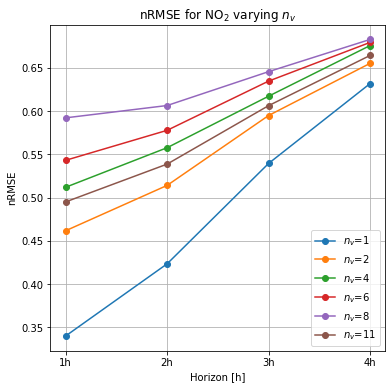

PM10
[0.43548783 0.51637887 0.56338924 0.60122257]
NO2-PM10
[0.62167533 0.61977463 0.62674603 0.65973887]
SO2-CO-NO2-PM10
[0.71340746 0.71791141 0.72104651 0.73382373]
SO2-CO-NO-NO2-PM25-PM10
[0.77343407 0.77202098 0.74202531 0.73958169]
SO2-CO-NO-NO2-PM25-PM10-NOx-O3
[0.82402442 0.79251949 0.76735601 0.7603686 ]
all
[0.72318687 0.71948929 0.72402108 0.73736629]


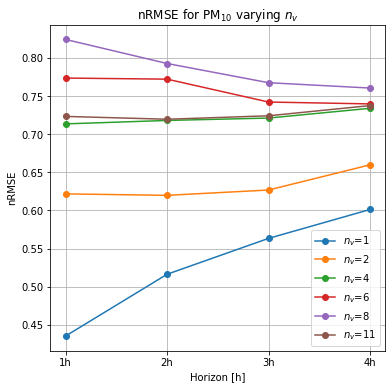

In [11]:
vns = ['NO2', 'PM10']
nrmse = {}

for id_v, vn in enumerate(list(l.vn_map.keys())):
    if vn not in vns:
        continue
    vc = l.vn_map[vn]
    with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
        avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)
    
    fig, ax = plt.subplots()
    fig.set_size_inches(6, 6)
    for sub in subsets:
        if vn not in sub and 'all' not in sub:
            continue
        n_v = len(sub.split('-')) if 'all' not in sub else 11
        idx = sub.split('-').index(vn) if 'all' not in sub else id_v
        print(sub)
        with tb.open_file(os.path.join(mod_path, mod_name.format(sub), mod_name.format(sub) + '.h5'), mode='r') as h5_in:
            nrmse = np.empty((l.n_y,))
            for h in range(4):
                nrmse[h] = np.nanmedian(h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v], idx] / avg_t)   
        ax.plot(['{}h'.format(i) for i in [1, 2, 3, 4]], nrmse, '-o', label='$n_v$={}'.format(n_v))
        print(nrmse)
    ax.set_title('nRMSE for {} varying $n_v$'.format(l.vc_map_pretty[l.vn_map[vn]]))
    ax.set_xlabel('Horizon [h]')
    ax.set_ylabel('nRMSE')
    ax.grid()
    ax.legend()
    plt.show()
    #plt.savefig('./graphs/experiment-n_x-{}.pdf'.format(vn), bbox_inches='tight')

Here, `all` ($n_v = 11$) was taken from espino:

NO2
0.3398735540195833
NO2-PM10
0.46161785340012274
SO2-CO-NO2-PM10
0.5119099857568441
SO2-CO-NO-NO2-PM25-PM10
0.5430744834294076
SO2-CO-NO-NO2-PM25-PM10-NOx-O3
0.5921744210084636
all
0.5174842073514909
PM10
0.4354878270344999
NO2-PM10
0.6216753344540019
SO2-CO-NO2-PM10
0.7134074584722607
SO2-CO-NO-NO2-PM25-PM10
0.7734340714886371
SO2-CO-NO-NO2-PM25-PM10-NOx-O3
0.8240244150256412
all
0.7092865919441608


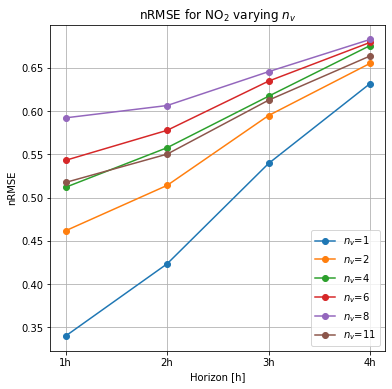

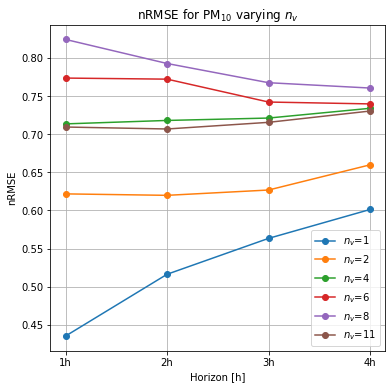

In [123]:
vns = ['NO2', 'PM10']
nrmse = {}

for id_v, vn in enumerate(list(l.vn_map.keys())):
    if vn not in vns:
        continue
    vc = l.vn_map[vn]
    with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
        avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)
    
    fig, ax = plt.subplots()
    fig.set_size_inches(6, 6)
    for sub in subsets:
        if vn not in sub and 'all' not in sub:
            continue
        n_v = len(sub.split('-')) if 'all' not in sub else 11
        idx = sub.split('-').index(vn) if 'all' not in sub else id_v
        print(sub)
        with tb.open_file(os.path.join(mod_path, mod_name.format(sub), mod_name.format(sub) + '.h5'), mode='r') as h5_in:
            nrmse = np.empty((l.n_y,))
            for h in range(4):
                nrmse[h] = np.nanmedian(h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v], idx] / avg_t)
        ax.plot(['{}h'.format(i) for i in [1, 2, 3, 4]], nrmse, '-o', label='$n_v$={}'.format(n_v))
        print(nrmse[0])
    ax.set_title('nRMSE for {} varying $n_v$'.format(l.vc_map_pretty[l.vn_map[vn]]))
    ax.set_xlabel('Horizon [h]')
    ax.set_ylabel('nRMSE')
    ax.grid()
    ax.legend()
    plt.savefig('./graphs/experiment-extensibility-{}.pdf'.format(vn), bbox_inches='tight')

## Heat maps

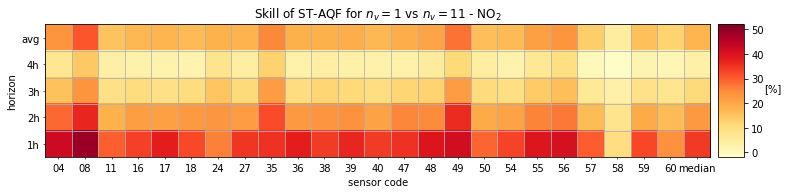

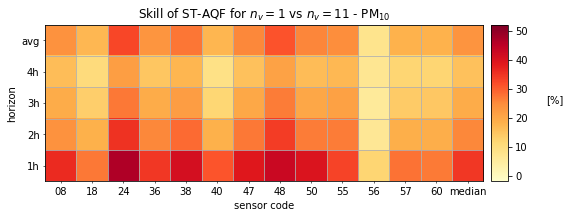

In [12]:
vns = ['NO2', 'PM10']

for id_v, vn in enumerate(list(l.vn_map.keys())):
    if vn not in vns:
        continue
    vc = l.vn_map[vn]
    with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
        avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)

    fig, ax = plt.subplots()
    aux = (8, 6) if vn == 'PM10' else (11, 8)
    fig.set_size_inches(aux)
    # n_v = 1
    fname = os.path.join(mod_path, mod_name.format(vn), mod_name.format(vn) + '.h5')
    with tb.open_file(fname, mode='r') as h5_in:
        nrmse1 = np.empty((l.n_y, len(l.vi_si_map[id_v])))
        for h in range(4):
            nrmse1[h] = h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v], 0] / avg_t
    # n_v = 11
    fname = os.path.join(mod_path, mod_name.format('all'), mod_name.format('all') + '.h5')
    with tb.open_file(fname, mode='r') as h5_in:
        nrmse2 = np.empty((l.n_y, len(l.vi_si_map[id_v])))
        for h in range(4):
            nrmse2[h] = h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v], id_v] / avg_t
    diff = (1 - nrmse1/nrmse2) * 100
    
    diff = np.hstack([diff, np.expand_dims(np.nanmedian(diff, axis=1), axis=1)])
    diff = np.vstack([diff, np.nanmean(diff, axis=0)])
    mini, maxi = -2, 52 #diff.max() #diff.min()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='4%', pad=0.1)
    im = ax.imshow(diff, vmin=mini, vmax=maxi,# extent=(-0.5, 24+0.5, -.5, 4.5),
                   origin='lower', cmap='YlOrRd')
    fig.colorbar(im, cax=cax, orientation='vertical')
    ax.set_title('Skill of ST-AQF for $n_v = 1$ vs $n_v = 11$ - {}'.format(l.vc_map_pretty[vc]))
    ax.set_xlabel('sensor code')
    ax.set_ylabel('horizon')
    ax.text(s='[%]', x=diff.shape[1] + 1.5, y=2)
    
    prettify_ax(ax, [list(l.sc_map.keys())[si] for si in l.vi_si_map[id_v]] + ['median'],
                ['{}h'.format(h+1) for h in range(l.n_y)] + ['avg'])
    #if np.isnan(arr[0, :]).sum() > 0:
    #    sidx = [l.vi_si_map[id_v][i]
    #            for i in np.argwhere(np.isnan(arr[0, :]))[0]]
    #    sns = [list(l.sc_map.keys())[i] for i in sidx]
    #    print('{} (idx {}) has no error at sensor {} (idx {})'.format(
    #        vn, id_v, sns, sidx))
    plt.tight_layout()
    plt.savefig('./graphs/experiment-extensibility-{}-heatmap.pdf'.format(vn), bbox_inches='tight')
    plt.show()

In [6]:
mod_path = '../models/madrid/experiment-extensibility-others/'

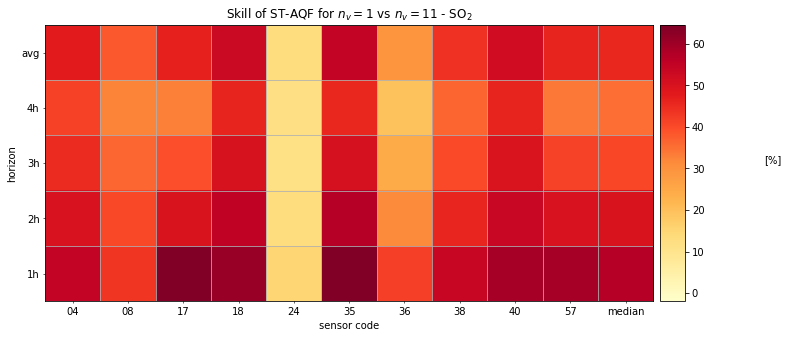

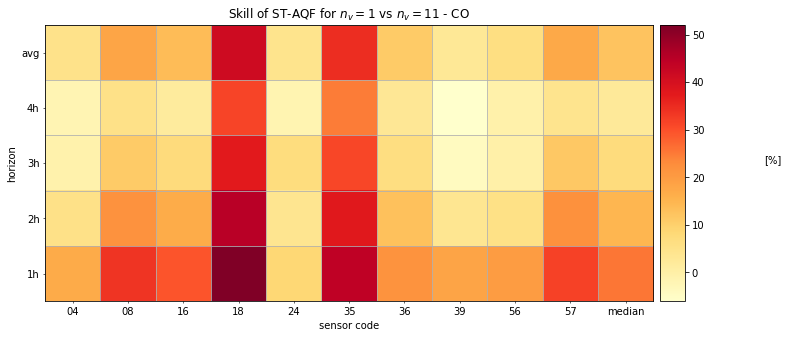

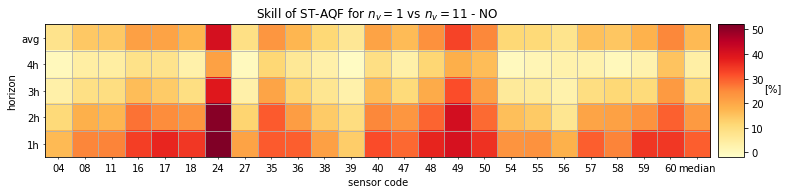

<ipython-input-14-7a06f920d503>:8: RuntimeWarning: Mean of empty slice
  avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)
<ipython-input-14-7a06f920d503>:28: RuntimeWarning: Mean of empty slice
  diff = np.vstack([diff, np.nanmean(diff, axis=0)])


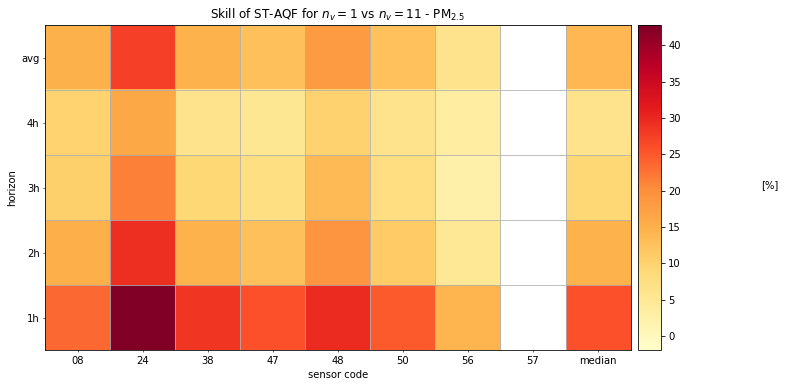

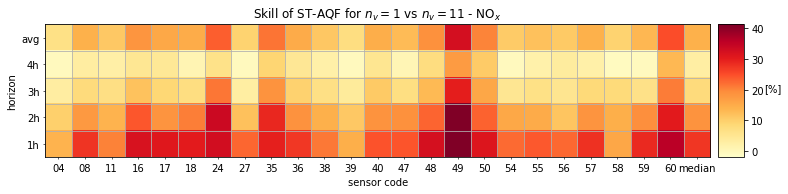

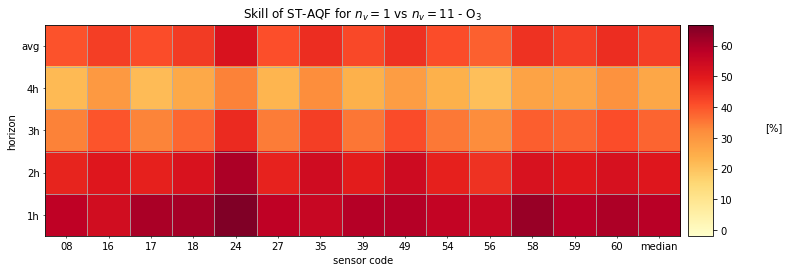

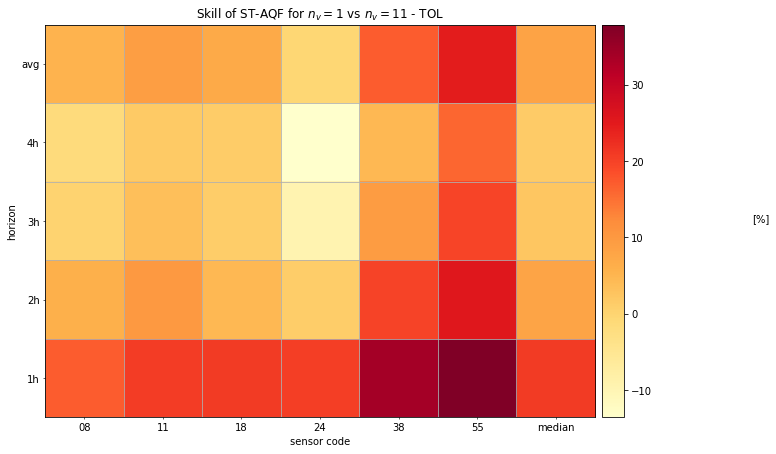

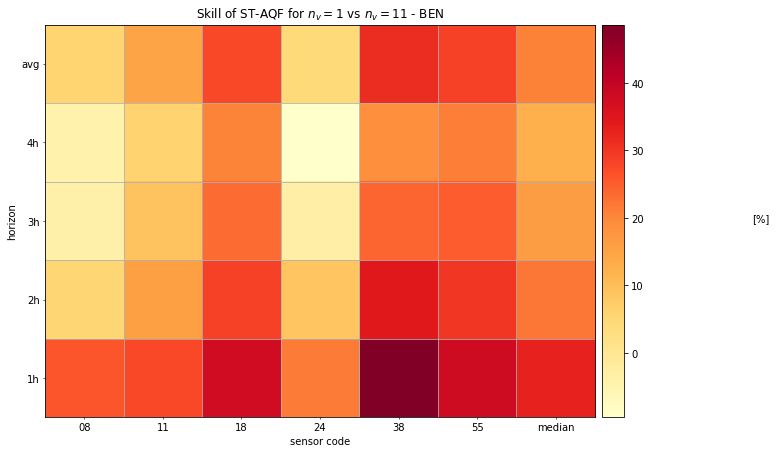

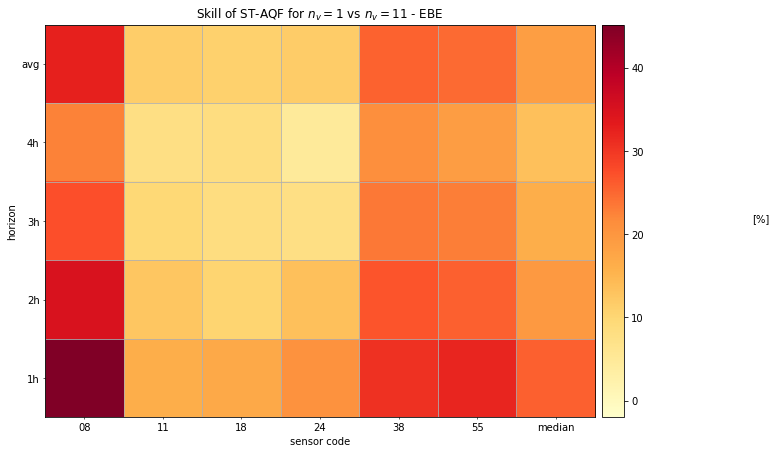

In [14]:
vns = ['PM25', 'O3', 'NO', 'NOx', 'SO2', 'CO', 'TOL', 'BEN', 'EBE']

for id_v, vn in enumerate(list(l.vn_map.keys())):
    if vn not in vns:
        continue
    vc = l.vn_map[vn]
    with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
        avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)

    fig, ax = plt.subplots()
    aux = (8, 6) if vn == 'PM10' else (11, 8)
    fig.set_size_inches(aux)
    # n_v = 1
    fname = os.path.join(mod_path, mod_name.format(vn), mod_name.format(vn) + '.h5')
    with tb.open_file(fname, mode='r') as h5_in:
        nrmse1 = np.empty((l.n_y, len(l.vi_si_map[id_v])))
        for h in range(4):
            nrmse1[h] = h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v], 0] / avg_t
    # n_v = 11
    fname = os.path.join(mod_path, mod_name.format('all'), mod_name.format('all') + '.h5')
    with tb.open_file(fname, mode='r') as h5_in:
        nrmse2 = np.empty((l.n_y, len(l.vi_si_map[id_v])))
        for h in range(4):
            nrmse2[h] = h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v], id_v] / avg_t
    diff = (1 - nrmse1/nrmse2) * 100
    
    diff = np.hstack([diff, np.expand_dims(np.nanmedian(diff, axis=1), axis=1)])
    diff = np.vstack([diff, np.nanmean(diff, axis=0)])
    mini, maxi = -2, 52 #diff.max() #diff.min()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='4%', pad=0.1)
    im = ax.imshow(diff, vmin=min(mini, diff.min()),# vmax=maxi,# extent=(-0.5, 24+0.5, -.5, 4.5),
                   origin='lower', cmap='YlOrRd')
    fig.colorbar(im, cax=cax, orientation='vertical')
    ax.set_title('Skill of ST-AQF for $n_v = 1$ vs $n_v = 11$ - {}'.format(l.vc_map_pretty[vc]))
    ax.set_xlabel('sensor code')
    ax.set_ylabel('horizon')
    ax.text(s='[%]', x=diff.shape[1] + 1.5, y=2)
    
    prettify_ax(ax, [list(l.sc_map.keys())[si] for si in l.vi_si_map[id_v]] + ['median'],
                ['{}h'.format(h+1) for h in range(l.n_y)] + ['avg'])
    #if np.isnan(arr[0, :]).sum() > 0:
    #    sidx = [l.vi_si_map[id_v][i]
    #            for i in np.argwhere(np.isnan(arr[0, :]))[0]]
    #    sns = [list(l.sc_map.keys())[i] for i in sidx]
    #    print('{} (idx {}) has no error at sensor {} (idx {})'.format(
    #        vn, id_v, sns, sidx))
    plt.tight_layout()
    plt.savefig('./graphs/experiment-extensibility-{}-heatmap.pdf'.format(vn), bbox_inches='tight')
    plt.show()

# Integrability

In [14]:
mod_path = '../models/madrid/experiment-integrability/'
mod_name = 'ST-AQF{}_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'

## Line plots

With 16 neurons in the temporal module and 32 in the weather one:

[0.21885714 0.25885357 0.29756406 0.33541596]
[0.2235597  0.26000612 0.29935637 0.33329159]
[0.22513045 0.26115939 0.29339497 0.32798804]
[0.22691657 0.26049872 0.29569591 0.32685151]
[-2.86639137 -0.89078317  1.4010729   2.21453947]


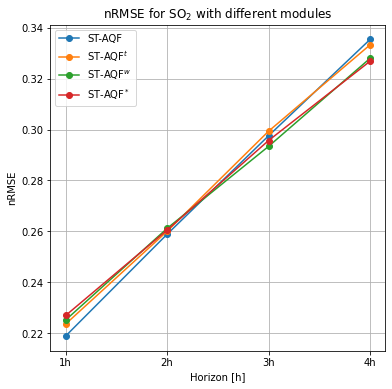

[0.35522759 0.43009439 0.50696147 0.56189549]
[0.36287941 0.43000356 0.50590593 0.56344195]
[0.3655284  0.41585549 0.47742969 0.5424831 ]
[0.38354302 0.41841214 0.47899491 0.53375071]
[-2.89977792  3.31064367  5.82525189  3.45480499]


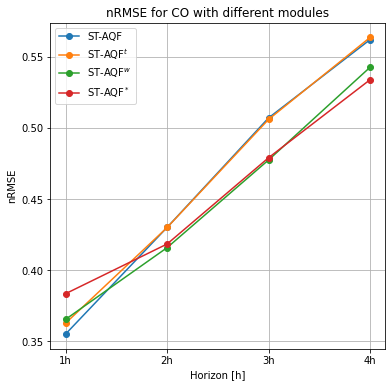

[1.15023391 1.31281994 1.57926437 1.79659767]
[1.15209575 1.31360114 1.57424886 1.79573826]
[1.17676105 1.28744524 1.53467584 1.74359181]
[1.17552516 1.30114791 1.5450382  1.75959936]
[-2.30623873  1.93283884  2.82337365  2.95034672]


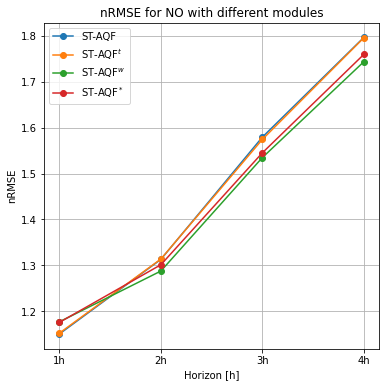

[0.34043487 0.42578053 0.53606607 0.62540659]
[0.33679521 0.42455034 0.54010795 0.63040246]
[0.34744842 0.40925647 0.50939305 0.59596781]
[0.35181662 0.41199097 0.51374529 0.60304631]
[-2.0601744   3.88088666  4.97569538  4.70714216]


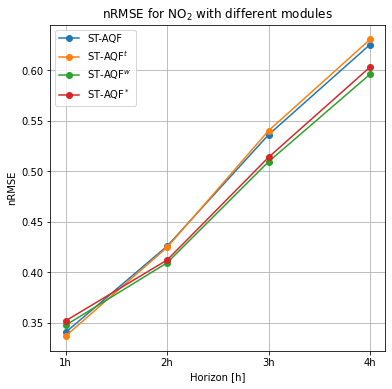

<ipython-input-194-70bc3e0e56fd>:9: RuntimeWarning: Mean of empty slice
  avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)


[0.47124923 0.55457587 0.59366844 0.61532946]
[0.46407332 0.5429268  0.58217546 0.60807464]
[0.45840528 0.51516921 0.55215469 0.58957624]
[0.45561353 0.52330056 0.5662245  0.59546708]
[2.72551035 7.10572951 6.99275002 4.18527298]


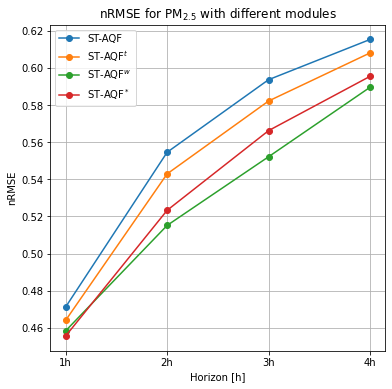

[0.47729828 0.54470335 0.59109835 0.63499273]
[0.4782231  0.55226905 0.59535129 0.62901851]
[0.49118457 0.54569776 0.58228561 0.62642877]
[0.46942153 0.53907444 0.58227982 0.61761049]
[-2.90935401 -0.18256084  1.49090831  1.3486698 ]


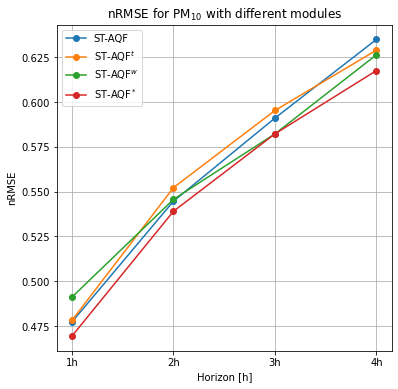

[0.60008928 0.71195093 0.88260304 1.01834468]
[0.61128204 0.71341646 0.8796087  1.01045318]
[0.62766652 0.6889693  0.84564506 0.97803894]
[0.63226313 0.70082526 0.84558914 0.97691592]
[-4.59552208  3.22797885  4.18738375  3.95796639]


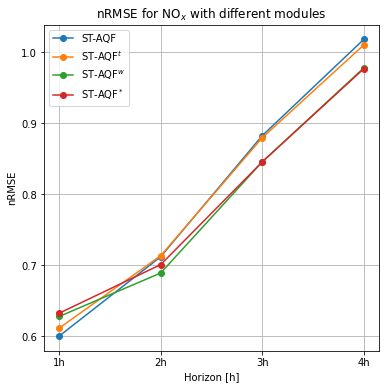

[0.22288615 0.27470336 0.356972   0.43177979]
[0.23181401 0.27715979 0.35646198 0.43056322]
[0.25251219 0.25555344 0.30789371 0.37677024]
[0.25864667 0.25644115 0.30925287 0.37856058]
[-13.2920013    6.97112707  13.74850031  12.74018748]


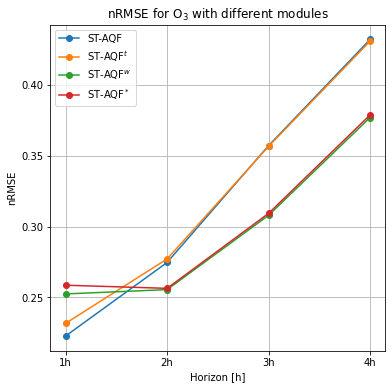

[0.94980885 1.13664842 1.2588211  1.32960641]
[0.97633621 1.14905812 1.27201626 1.35379125]
[0.99469905 1.12507466 1.22980729 1.30017212]
[1.05943596 1.1717919  1.25831603 1.32384222]
[-4.72623519  1.01823557  2.3048396   2.21375971]


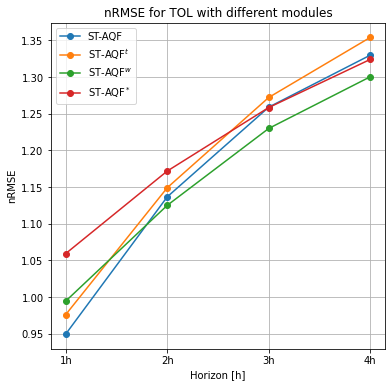

[0.72249854 0.88544889 1.00530249 1.08113761]
[0.70640516 0.85234248 0.99070385 1.08126337]
[0.73573795 0.84196421 0.9452647  1.02705042]
[0.72667269 0.80988953 0.92998522 1.01787998]
[-1.83244792  4.91103161  5.97211199  5.00280302]


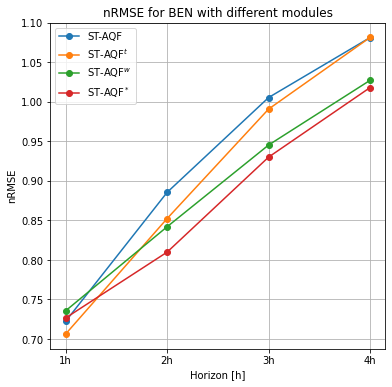

[1.50427471 1.629723   1.69605335 1.75811872]
[1.52200411 1.63333141 1.69782243 1.77022998]
[1.49986378 1.60641709 1.67512256 1.73506398]
[1.50998662 1.62421793 1.68475622 1.74824318]
[0.29322631 1.4300533  1.2340879  1.31133023]


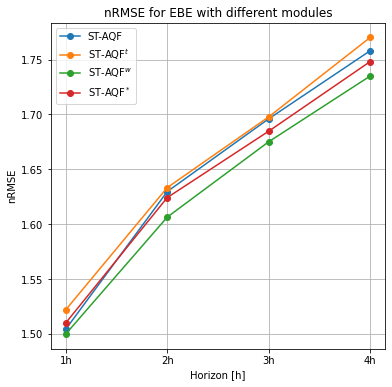

In [194]:
vns = list(l.vn_map.keys()) # ['NO2', 'NOx', 'PM25', 'PM10', 'O3', 'SO2', '']
kind_d = {'': 'ST-AQF', '-t': 'ST-AQF$^t$', '-w': 'ST-AQF$^w$', '-star': 'ST-AQF$^*$'}

for id_v, vn in enumerate(list(l.vn_map.keys())):
    if vn not in vns:
        continue
    vc = l.vn_map[vn]
    with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
        avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)
    
    fig, ax = plt.subplots()
    fig.set_size_inches(6, 6)
    for kind in ['', '-t', '-w', '-star']:
        with tb.open_file(os.path.join(mod_path, mod_name.format(kind, vn),
                                       mod_name.format(kind, vn) + '.h5'), mode='r') as h5_in:
            nrmse = np.empty((l.n_y,))
            for h in range(4):
                nrmse[h] = np.nanmedian(h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v]] / avg_t)   
        ax.plot(['{}h'.format(i) for i in [1, 2, 3, 4]], nrmse, '-o', label=kind_d[kind])
        if kind == '-w':
            a = nrmse
        if kind == '':
            b = nrmse
        print(nrmse)
    print((1-a/b)*100)
    ax.set_title('nRMSE for {} with different modules'.format(l.vc_map_pretty[l.vn_map[vn]]))
    ax.set_xlabel('Horizon [h]')
    ax.set_ylabel('nRMSE')
    ax.grid()
    ax.legend()
    #plt.savefig('./graphs/experiment-integrability-{}.pdf'.format(vn), bbox_inches='tight')
    plt.show()

With 64 neurons in the temporal module and 64 in the weather one:

skill w vs baseline [-0.31262182  2.75494779  4.15934707  4.89435772] --> 2.9
skill star vs baseline [-0.91958638  2.77567841  4.46658668  6.17761054] --> 3.1


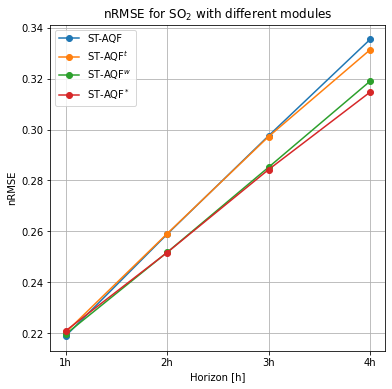

skill w vs baseline [-3.83008538  4.53458917  6.88744233  6.34700648] --> 3.5
skill star vs baseline [-5.91212087  4.50239488  6.34452272  4.6689442 ] --> 2.4


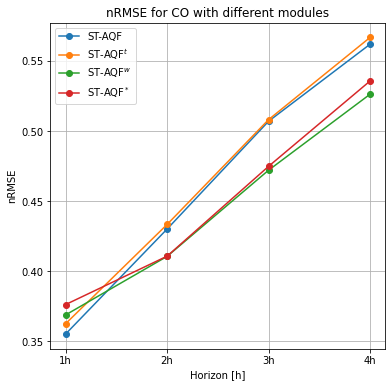

skill w vs baseline [-4.32580043  0.60775329  3.60934273  3.35629776] --> 0.8
skill star vs baseline [-3.88728241  1.40104742  3.77222496  4.04549251] --> 1.3


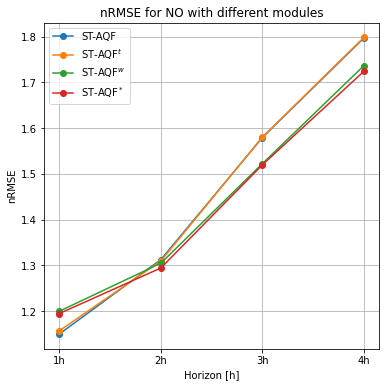

skill w vs baseline [-6.06261095  3.62774695  6.13793201  5.42068683] --> 2.3
skill star vs baseline [-3.44966953  4.55192678  5.3996669   4.73597548] --> 2.8


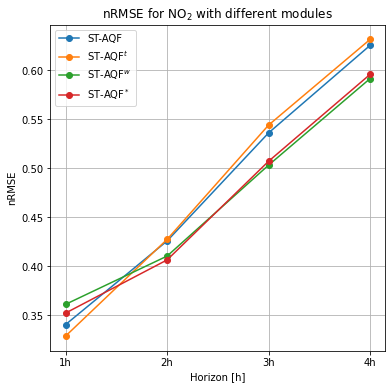

<ipython-input-15-70bc2e20b07d>:9: RuntimeWarning: Mean of empty slice
  avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)


skill w vs baseline [0.96533172 6.76276375 7.32988907 4.55665512] --> 4.9
skill star vs baseline [-0.09645137  5.59478445  5.54493647  3.78909255] --> 3.7


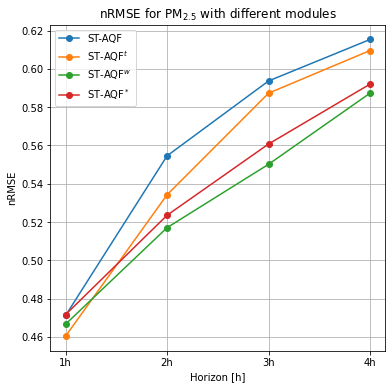

skill w vs baseline [-0.59119188  1.43612852  1.5991155   2.09579727] --> 1.1
skill star vs baseline [-0.99007192  0.73431156  1.83461562  2.43619487] --> 1.0


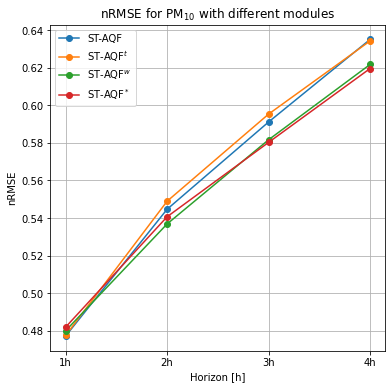

skill w vs baseline [-6.41031183  3.37777263  5.68193268  5.65615802] --> 2.1
skill star vs baseline [-4.90869227  3.17980176  5.09717757  4.9123218 ] --> 2.1


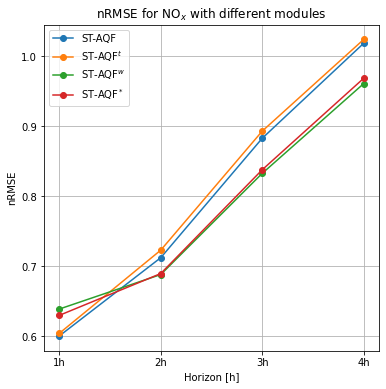

skill w vs baseline [-8.25492835 10.80495682 14.37629767 12.21491088] --> 7.3
skill star vs baseline [-11.6407761    8.11802902  13.49479014  12.50279068] --> 5.6


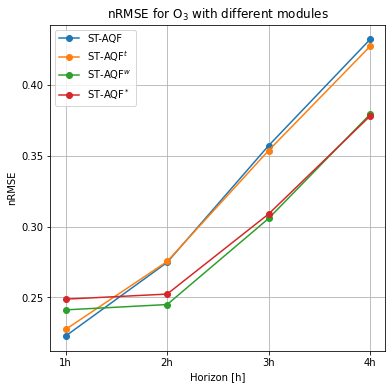

skill w vs baseline [-7.64827519  0.1158195   2.29117647  2.49832786] --> -0.7
skill star vs baseline [-12.03379453  -3.95206839  -0.08207527  -0.03125058] --> -4.0


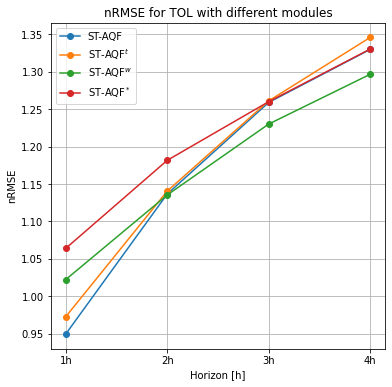

skill w vs baseline [-10.75154154   2.56093621   7.27537217   5.87661755] --> 1.2
skill star vs baseline [-4.24602636  6.49258422  8.02874257  6.12173312] --> 4.1


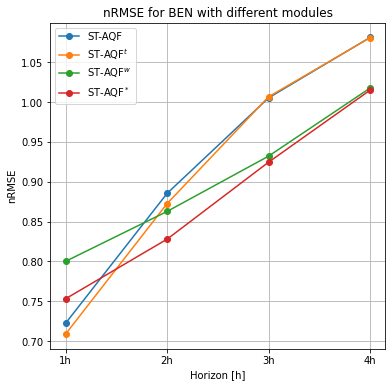

skill w vs baseline [-1.36076133 -0.41682448 -0.12034579  0.03792282] --> -0.5
skill star vs baseline [-4.25048935 -2.13839251 -1.1478066  -0.95820205] --> -2.1


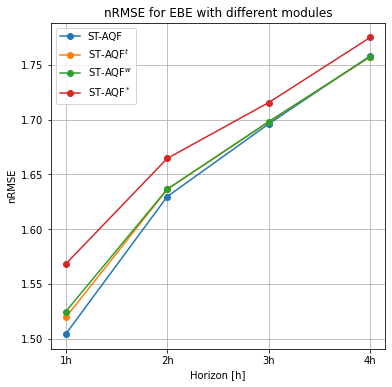

In [15]:
vns = list(l.vn_map.keys()) # ['NO2', 'NOx', 'PM25', 'PM10', 'O3', 'SO2', '']
kind_d = {'': 'ST-AQF', '-t': 'ST-AQF$^t$', '-w': 'ST-AQF$^w$', '-star': 'ST-AQF$^*$'}

for id_v, vn in enumerate(list(l.vn_map.keys())):
    if vn not in vns:
        continue
    vc = l.vn_map[vn]
    with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
        avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)
    
    fig, ax = plt.subplots()
    fig.set_size_inches(6, 6)
    for kind in ['', '-t', '-w', '-star']:
        with tb.open_file(os.path.join(mod_path, mod_name.format(kind, vn),
                                       mod_name.format(kind, vn) + '.h5'), mode='r') as h5_in:
            nrmse = np.empty((l.n_y,))
            for h in range(4):
                nrmse[h] = np.nanmedian(h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v]] / avg_t)   
        ax.plot(['{}h'.format(i) for i in [1, 2, 3, 4]], nrmse, '-o', label=kind_d[kind])
        if kind == '-w':
            w = nrmse
        if kind == '-star':
            star = nrmse
        if kind == '':
            a = nrmse
        #print(nrmse)
    print('skill w vs baseline', (1-w/a)*100, '-->', ((1-w/a)*100).mean().round(1))
    print('skill star vs baseline', (1-star/a)*100, '-->', ((1-star/a)*100).mean().round(1))
    ax.set_title('nRMSE for {} with different modules'.format(l.vc_map_pretty[l.vn_map[vn]]))
    ax.set_xlabel('Horizon [h]')
    ax.set_ylabel('nRMSE')
    ax.grid()
    ax.legend()
    #plt.savefig('./graphs/experiment-integrability-64neurons-{}.pdf'.format(vn), bbox_inches='tight')
    plt.show()

With 128 neurons in the temporal module and 128 in the weather one:

skill w vs baseline [-3.7218125   1.92543851  3.53262288  5.45261279] --> 1.8
skill star vs baseline [3.21226672 5.49926777 5.8905421  6.19960975] --> 5.2


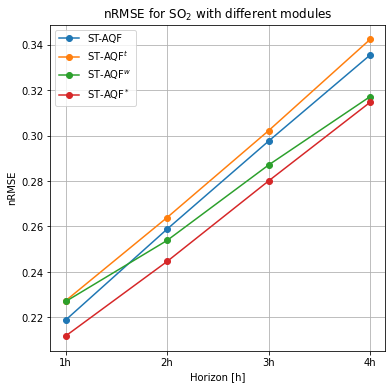

skill w vs baseline [-7.39510347  5.91506832  8.57069065  7.30094887] --> 3.6
skill star vs baseline [-6.9201682   5.41356955  8.33311653  7.0473739 ] --> 3.5


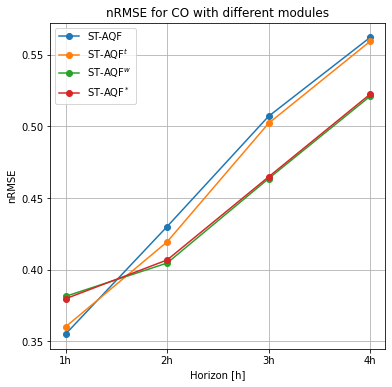

skill w vs baseline [-3.57628728  2.94907658  5.32709945  4.73221894] --> 2.4
skill star vs baseline [-4.25908291  2.33822535  4.58119781  4.43624547] --> 1.8


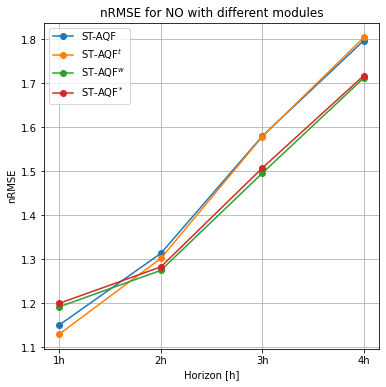

skill w vs baseline [-5.56399777  4.7254949   6.53660946  5.66737557] --> 2.8
skill star vs baseline [-5.43970307  4.26436185  5.9482352   5.72242467] --> 2.6


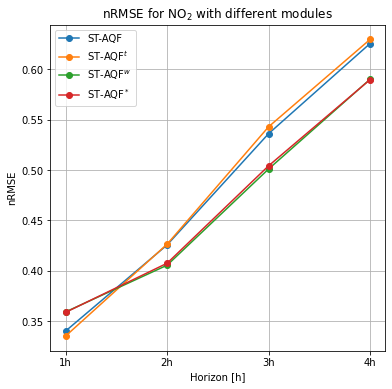

<ipython-input-13-7f0736586d39>:9: RuntimeWarning: Mean of empty slice
  avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)


skill w vs baseline [2.58441351 5.98241033 6.65162413 4.59045422] --> 5.0
skill star vs baseline [3.29837649 5.77436531 6.858198   4.67620699] --> 5.2


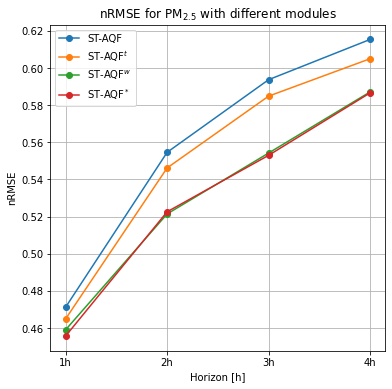

skill w vs baseline [-0.9463507   1.69177567  2.14538993  2.97460778] --> 1.5
skill star vs baseline [-0.9347239   0.8917144   2.21700418  3.63052383] --> 1.5


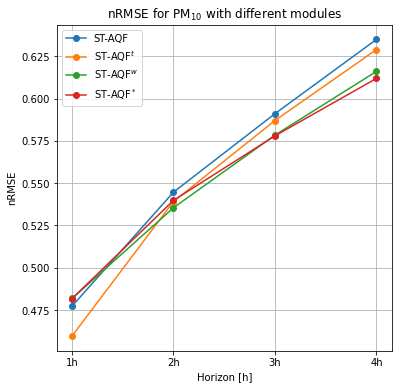

skill w vs baseline [-6.84298035  3.34571544  6.72132876  6.13529392] --> 2.3
skill star vs baseline [-7.57944958  1.69432388  5.1854994   4.62552771] --> 1.0


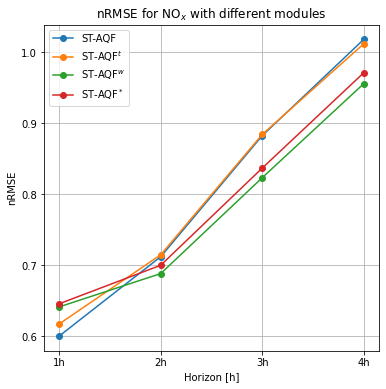

skill w vs baseline [-13.72281453   7.88667067  14.54695553  13.23675486] --> 5.5
skill star vs baseline [-12.83914198   7.78136116  13.54602302  12.62315085] --> 5.3


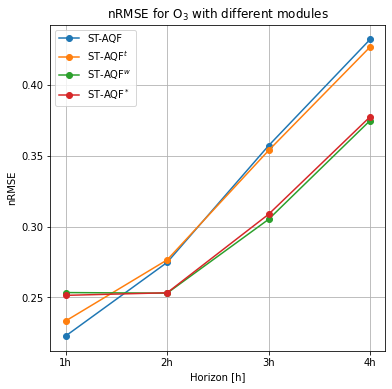

skill w vs baseline [-13.95633711  -1.8719095    1.30718718   1.88751582] --> -3.2
skill star vs baseline [-13.8431169   -3.98886634   0.10742892   0.34585332] --> -4.3


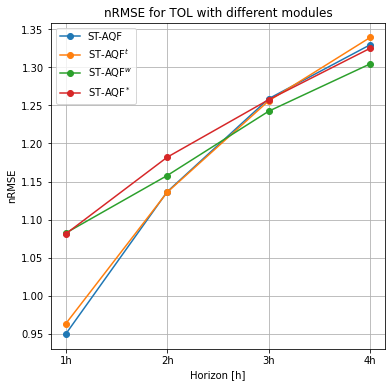

skill w vs baseline [-8.5808637   6.43143951  8.8299213   7.00981361] --> 3.4
skill star vs baseline [-10.23280728   3.47694146   7.46881969   6.21223466] --> 1.7


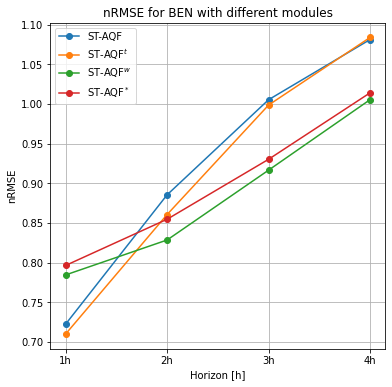

skill w vs baseline [-0.08638828  1.39721829  1.68057458  1.7699503 ] --> 1.2
skill star vs baseline [-2.76513011 -1.31362747 -0.649078   -0.32460893] --> -1.3


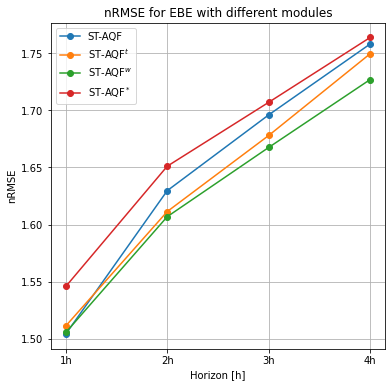

In [13]:
vns = list(l.vn_map.keys()) # ['NO2', 'NOx', 'PM25', 'PM10', 'O3', 'SO2', '']
kind_d = {'': 'ST-AQF', '-t': 'ST-AQF$^t$', '-w': 'ST-AQF$^w$', '-star': 'ST-AQF$^*$'}

for id_v, vn in enumerate(list(l.vn_map.keys())):
    if vn not in vns:
        continue
    vc = l.vn_map[vn]
    with tb.open_file(l.dataset_d_raw['time_series'], mode='r') as h5_raw:
        avg_t = np.nanmean(h5_raw.root['/v{}'.format(vc)][slice(*l.test_extent), 1:], axis=0)
    
    fig, ax = plt.subplots()
    fig.set_size_inches(6, 6)
    for kind in ['', '-t', '-w', '-star']:
        with tb.open_file(os.path.join(mod_path, mod_name.format(kind, vn),
                                       mod_name.format(kind, vn) + '.h5'), mode='r') as h5_in:
            nrmse = np.empty((l.n_y,))
            for h in range(4):
                nrmse[h] = np.nanmedian(h5_in.root._v_attrs['rmse_mod'][h, l.vi_si_map[id_v]] / avg_t)   
        ax.plot(['{}h'.format(i) for i in [1, 2, 3, 4]], nrmse, '-o', label=kind_d[kind])
        if kind == '-w':
            w = nrmse
        if kind == '-star':
            star = nrmse
        if kind == '':
            a = nrmse
        #print(nrmse)
    print('skill w vs baseline', (1-w/a)*100, '-->', ((1-w/a)*100).mean().round(1))
    print('skill star vs baseline', (1-star/a)*100, '-->', ((1-star/a)*100).mean().round(1))
    ax.set_title('nRMSE for {} with different modules'.format(l.vc_map_pretty[l.vn_map[vn]]))
    ax.set_xlabel('Horizon [h]')
    ax.set_ylabel('nRMSE')
    ax.grid()
    ax.legend()
    plt.savefig('./graphs/experiment-integrability-128neurons-{}.pdf'.format(vn), bbox_inches='tight')
    plt.show()

# Robustness

In [230]:
importlib.reload(learner)

l = learner.DeepLearner()

l.set_idx_v([3])
vc = list(l.vc_map.keys())[0]
vn = l.vc_map[vc]
l.set_experiment('experiment-n_x')
l.set_scaling('stand')

mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'.format(vn)

model = l.models.load_model(model_path=os.path.join(mod_path, mod_name, mod_name + '.h5'))
model.mod_name = mod_name

tic = time.time()
l._DeepLearner__robustness_test(model=model)#, n_reps=5, up_to=6)
print('\n{}'.format(time.strftime('%H:%M:%S', time.gmtime(time.time() - tic))))

Working on NO2...
	for 01 sensor(s) excluded...
	for 02 sensor(s) excluded...
	for 03 sensor(s) excluded...
	for 04 sensor(s) excluded...
	for 05 sensor(s) excluded...
	for 06 sensor(s) excluded...
	for 07 sensor(s) excluded...
	for 08 sensor(s) excluded...
	for 09 sensor(s) excluded...
	for 10 sensor(s) excluded...
	for 11 sensor(s) excluded...
	for 12 sensor(s) excluded...
{'1h': array([ -1.71234415,  -9.75087162,  -5.37140339, -16.19764478,
        -9.31713999, -22.56366429, -15.78658556, -15.97248629,
       -19.03214993, -17.47379555, -20.77322889, -18.36344968]), '2h': array([ -1.66802768,  -7.47222584,  -6.1026653 , -14.69465746,
        -9.63759423, -19.02126364, -15.34869442, -15.96989791,
       -17.82011144, -18.8718876 , -20.90175973, -21.23693611]), '3h': array([ -1.20939017,  -4.55243217,  -4.37202746,  -9.92854185,
        -7.02578362, -12.43021895, -10.9987119 , -11.29983901,
       -11.45048092, -13.65148514, -14.4527213 , -15.35169187]), '4h': array([-0.78559013, -2.8

In [233]:
l = learner.DeepLearner()

l.set_idx_v([4])

l.vi_si_map

{0: [1, 6, 10, 13, 14, 16, 19, 20]}

In [248]:
importlib.reload(learner)

l = learner.DeepLearner()

l.set_idx_v([4])
###########
l.vi_si_map = {0: [1, 6, 10, 13, 14, 16, 19]}
###########
vc = list(l.vc_map.keys())[0]
vn = l.vc_map[vc]
l.set_experiment('experiment-n_x')
l.set_scaling('stand')

mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'.format(vn)

model = l.models.load_model(model_path=os.path.join(mod_path, mod_name, mod_name + '.h5'))
model.mod_name = mod_name

tic = time.time()
sse_mod = l._DeepLearner__robustness_test(model=model)#, n_reps=5, up_to=6)
print('\n{}'.format(time.strftime('%H:%M:%S', time.gmtime(time.time() - tic))))

Working on PM25...
	for 01 sensor(s) excluded...
	for 03 sensor(s) excluded...
	for 04 sensor(s) excluded...
{'1h': array([-11.19268269, -15.38522784, -16.93213257, -21.68886615]), '2h': array([ -5.57702325,  -7.58031171,  -7.7618465 , -11.73597236]), '3h': array([-3.74712208, -5.59320943, -5.54089255, -8.33342428]), '4h': array([-2.97357003, -4.01524723, -4.33937143, -6.80155977])}

	Plot saved to ../models/madrid/experiment-n_x/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_PM25/robustness-test/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_PM25_rob_test.pdf

00:31:44


In [232]:
importlib.reload(learner)

l = learner.DeepLearner()

l.set_idx_v([7])
vc = list(l.vc_map.keys())[0]
vn = l.vc_map[vc]
l.set_experiment('experiment-n_x')
l.set_scaling('stand')

mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'.format(vn)

model = l.models.load_model(model_path=os.path.join(mod_path, mod_name, mod_name + '.h5'))
model.mod_name = mod_name

tic = time.time()
l._DeepLearner__robustness_test(model=model)#, n_reps=5, up_to=6)
print('\n{}'.format(time.strftime('%H:%M:%S', time.gmtime(time.time() - tic))))

Working on O3...
	for 01 sensor(s) excluded...
	for 02 sensor(s) excluded...
	for 03 sensor(s) excluded...
	for 04 sensor(s) excluded...
	for 05 sensor(s) excluded...
	for 06 sensor(s) excluded...
	for 07 sensor(s) excluded...
{'1h': array([-26.39484006, -27.8254364 , -30.63504034, -31.20153852,
       -27.66281451, -32.74351778, -32.68793228]), '2h': array([-20.06121963, -20.96606041, -22.44653258, -21.05303059,
       -20.87887907, -22.93451859, -23.68592173]), '3h': array([-12.89418939, -13.88554706, -14.56705464, -14.06772247,
       -12.86369113, -13.83145447, -15.62401507]), '4h': array([ -7.87393484,  -9.08183863,  -9.1429406 ,  -8.99818198,
        -7.80718037,  -8.84899904, -10.09175362])}

	Plot saved to ../models/madrid/experiment-n_x/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_O3/robustness-test/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_O3_rob_test.pdf

01:00:22


In [249]:
importlib.reload(learner)

l = learner.DeepLearner()

l.set_idx_v([0])
vc = list(l.vc_map.keys())[0]
vn = l.vc_map[vc]
l.set_experiment('experiment-n_x')
l.set_scaling('stand')

mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'.format(vn)

model = l.models.load_model(model_path=os.path.join(mod_path, mod_name, mod_name + '.h5'))
model.mod_name = mod_name

tic = time.time()
l._DeepLearner__robustness_test(model=model)#, n_reps=5, up_to=6)
print('\n{}'.format(time.strftime('%H:%M:%S', time.gmtime(time.time() - tic))))

Working on SO2...
	for 01 sensor(s) excluded...
	for 02 sensor(s) excluded...
	for 03 sensor(s) excluded...
	for 04 sensor(s) excluded...
	for 05 sensor(s) excluded...
{'1h': array([-129.1153627 , -133.6009022 , -131.4207937 , -139.7590881 ,
       -143.04555923]), '2h': array([ -99.75151491, -105.54804396, -100.15451079,  -99.86525663,
       -110.22644243]), '3h': array([-81.28759419, -80.35049584, -81.71171257, -80.39492141,
       -88.19132904]), '4h': array([-63.42775349, -62.29790705, -66.76032257, -66.06426309,
       -70.85369029])}

	Plot saved to ../models/madrid/experiment-n_x/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_SO2/robustness-test/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_SO2_rob_test.pdf

00:41:35


In [250]:
importlib.reload(learner)

l = learner.DeepLearner()

l.set_idx_v([1])
vc = list(l.vc_map.keys())[0]
vn = l.vc_map[vc]
l.set_experiment('experiment-n_x')
l.set_scaling('stand')

mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'.format(vn)

model = l.models.load_model(model_path=os.path.join(mod_path, mod_name, mod_name + '.h5'))
model.mod_name = mod_name

tic = time.time()
l._DeepLearner__robustness_test(model=model)#, n_reps=5, up_to=6)
print('\n{}'.format(time.strftime('%H:%M:%S', time.gmtime(time.time() - tic))))

Working on CO...
	for 01 sensor(s) excluded...
	for 02 sensor(s) excluded...
	for 03 sensor(s) excluded...
	for 04 sensor(s) excluded...
	for 05 sensor(s) excluded...
{'1h': array([-63.43789063, -60.86257446, -66.69661155, -68.60962759,
       -51.45240307]), '2h': array([-47.8710637 , -46.35430426, -49.7535497 , -52.04271857,
       -38.69503411]), '3h': array([-33.44733265, -31.32562276, -32.2344839 , -36.43154453,
       -25.69055201]), '4h': array([-21.62314683, -20.53493875, -21.04980896, -23.82151761,
       -16.50970551])}

	Plot saved to ../models/madrid/experiment-n_x/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_CO/robustness-test/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_CO_rob_test.pdf

00:41:45


In [251]:
importlib.reload(learner)

l = learner.DeepLearner()

l.set_idx_v([2])
vc = list(l.vc_map.keys())[0]
vn = l.vc_map[vc]
l.set_experiment('experiment-n_x')
l.set_scaling('stand')

mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'.format(vn)

model = l.models.load_model(model_path=os.path.join(mod_path, mod_name, mod_name + '.h5'))
model.mod_name = mod_name

tic = time.time()
l._DeepLearner__robustness_test(model=model)#, n_reps=5, up_to=6)
print('\n{}'.format(time.strftime('%H:%M:%S', time.gmtime(time.time() - tic))))

Working on NO...
	for 01 sensor(s) excluded...
	for 02 sensor(s) excluded...
	for 03 sensor(s) excluded...
	for 04 sensor(s) excluded...
	for 05 sensor(s) excluded...
	for 06 sensor(s) excluded...
	for 07 sensor(s) excluded...
	for 08 sensor(s) excluded...
	for 09 sensor(s) excluded...
	for 10 sensor(s) excluded...
	for 11 sensor(s) excluded...
	for 12 sensor(s) excluded...
{'1h': array([ -0.36851071,  -2.20784975,  -5.0077809 ,  -5.18827519,
        -9.37787292,  -6.6989526 , -11.53254791, -14.19220326,
       -20.18004326, -16.22165047, -20.46848592, -29.91054733]), '2h': array([ -1.30867805,  -4.12409746,  -5.52105021,  -6.42385599,
       -10.03565715,  -9.12051648, -13.75056819, -13.89823936,
       -17.66397361, -16.18453665, -19.41237046, -27.23004289]), '3h': array([ -0.755344  ,  -3.11581505,  -4.12958796,  -4.51156159,
        -7.06445321,  -6.33124775,  -9.90637739,  -9.48905721,
       -11.88040617, -12.14765187, -14.53027991, -18.73011822]), '4h': array([ -0.40009518,  -1.

In [252]:
importlib.reload(learner)

l = learner.DeepLearner()

l.set_idx_v([5])
vc = list(l.vc_map.keys())[0]
vn = l.vc_map[vc]
l.set_experiment('experiment-n_x')
l.set_scaling('stand')

mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'.format(vn)

model = l.models.load_model(model_path=os.path.join(mod_path, mod_name, mod_name + '.h5'))
model.mod_name = mod_name

tic = time.time()
l._DeepLearner__robustness_test(model=model)#, n_reps=5, up_to=6)
print('\n{}'.format(time.strftime('%H:%M:%S', time.gmtime(time.time() - tic))))

Working on PM10...
	for 01 sensor(s) excluded...
	for 02 sensor(s) excluded...
	for 03 sensor(s) excluded...
	for 04 sensor(s) excluded...
	for 05 sensor(s) excluded...
	for 06 sensor(s) excluded...
	for 07 sensor(s) excluded...
{'1h': array([-24.46278902, -21.64520733, -20.52799343, -21.19199284,
       -18.9987666 , -25.20691781, -17.59212365]), '2h': array([-12.45361315, -13.74402259, -12.91816867, -11.26750429,
        -9.59585929, -15.39211144, -12.50609806]), '3h': array([ -9.09392308,  -9.88402938,  -9.04011926,  -9.05476378,
        -7.83496732, -11.20860524, -10.49469098]), '4h': array([-6.94438303, -7.61799229, -6.54714045, -7.35608548, -6.83498678,
       -8.15217676, -9.26887992])}

	Plot saved to ../models/madrid/experiment-n_x/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_PM10/robustness-test/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_PM10_rob_test.pdf

00:59:13


In [253]:
importlib.reload(learner)

l = learner.DeepLearner()

l.set_idx_v([6])
vc = list(l.vc_map.keys())[0]
vn = l.vc_map[vc]
l.set_experiment('experiment-n_x')
l.set_scaling('stand')

mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'.format(vn)

model = l.models.load_model(model_path=os.path.join(mod_path, mod_name, mod_name + '.h5'))
model.mod_name = mod_name

tic = time.time()
l._DeepLearner__robustness_test(model=model)#, n_reps=5, up_to=6)
print('\n{}'.format(time.strftime('%H:%M:%S', time.gmtime(time.time() - tic))))

Working on NOx...
	for 01 sensor(s) excluded...
	for 02 sensor(s) excluded...
	for 03 sensor(s) excluded...
	for 04 sensor(s) excluded...
	for 05 sensor(s) excluded...
	for 06 sensor(s) excluded...
	for 07 sensor(s) excluded...
	for 08 sensor(s) excluded...
	for 09 sensor(s) excluded...
	for 10 sensor(s) excluded...
	for 11 sensor(s) excluded...
	for 12 sensor(s) excluded...
{'1h': array([ -1.01891616,  -2.79139486,  -3.59669421,  -5.58136568,
        -5.6594385 ,  -8.25931775, -10.80714312, -14.78082749,
       -12.42336882, -13.0190784 , -21.1638302 , -21.41530513]), '2h': array([ -1.58477137,  -2.92200485,  -3.7132391 ,  -6.48896485,
        -4.80870834, -10.15845663, -12.65251664, -15.58086007,
       -12.43259767, -16.13086974, -22.50971225, -22.87010682]), '3h': array([ -1.1120634 ,  -1.95903011,  -2.62131353,  -4.52790773,
        -3.44387228,  -6.64693629,  -8.75617699, -10.60578577,
        -8.14476107, -10.50210967, -13.84323709, -15.10471815]), '4h': array([-0.74994833, -1.2

In [254]:
importlib.reload(learner)

l = learner.DeepLearner()

l.set_idx_v([8])
vc = list(l.vc_map.keys())[0]
vn = l.vc_map[vc]
l.set_experiment('experiment-n_x')
l.set_scaling('stand')

mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'.format(vn)

model = l.models.load_model(model_path=os.path.join(mod_path, mod_name, mod_name + '.h5'))
model.mod_name = mod_name

tic = time.time()
l._DeepLearner__robustness_test(model=model)#, n_reps=5, up_to=6)
print('\n{}'.format(time.strftime('%H:%M:%S', time.gmtime(time.time() - tic))))

Working on TOL...
	for 01 sensor(s) excluded...
	for 02 sensor(s) excluded...
	for 03 sensor(s) excluded...
{'1h': array([-39.2891982 , -38.09009715, -46.26145628]), '2h': array([-20.00611037, -19.50803461, -22.99380853]), '3h': array([-11.86659157, -11.75448954, -14.73394501]), '4h': array([ -7.88811971,  -8.432491  , -10.50833285])}

	Plot saved to ../models/madrid/experiment-n_x/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_TOL/robustness-test/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_TOL_rob_test.pdf

00:23:43


In [255]:
importlib.reload(learner)

l = learner.DeepLearner()

l.set_idx_v([9])
vc = list(l.vc_map.keys())[0]
vn = l.vc_map[vc]
l.set_experiment('experiment-n_x')
l.set_scaling('stand')

mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'.format(vn)

model = l.models.load_model(model_path=os.path.join(mod_path, mod_name, mod_name + '.h5'))
model.mod_name = mod_name

tic = time.time()
l._DeepLearner__robustness_test(model=model)#, n_reps=5, up_to=6)
print('\n{}'.format(time.strftime('%H:%M:%S', time.gmtime(time.time() - tic))))

Working on BEN...
	for 01 sensor(s) excluded...
	for 02 sensor(s) excluded...
	for 03 sensor(s) excluded...
{'1h': array([-40.80981153, -45.23525478, -47.4691189 ]), '2h': array([-23.5351338 , -26.03123945, -24.53197109]), '3h': array([-14.24943873, -15.92403778, -14.10740797]), '4h': array([ -9.56843786, -10.89007168,  -9.5696803 ])}

	Plot saved to ../models/madrid/experiment-n_x/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_BEN/robustness-test/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_BEN_rob_test.pdf

00:26:23


In [256]:
importlib.reload(learner)

l = learner.DeepLearner()

l.set_idx_v([10])
vc = list(l.vc_map.keys())[0]
vn = l.vc_map[vc]
l.set_experiment('experiment-n_x')
l.set_scaling('stand')

mod_path = '../models/madrid/experiment-n_x/'
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_{}'.format(vn)

model = l.models.load_model(model_path=os.path.join(mod_path, mod_name, mod_name + '.h5'))
model.mod_name = mod_name

tic = time.time()
l._DeepLearner__robustness_test(model=model)#, n_reps=5, up_to=6)
print('\n{}'.format(time.strftime('%H:%M:%S', time.gmtime(time.time() - tic))))

Working on EBE...
	for 01 sensor(s) excluded...
	for 02 sensor(s) excluded...
	for 03 sensor(s) excluded...
{'1h': array([-50.68318546, -55.83806459, -60.05850802]), '2h': array([-37.85138106, -42.11381875, -45.32293612]), '3h': array([-30.16653208, -33.74099983, -36.23383089]), '4h': array([-25.33294369, -28.43424147, -29.57078983])}

	Plot saved to ../models/madrid/experiment-n_x/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_EBE/robustness-test/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_EBE_rob_test.pdf

00:23:59


In [297]:
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_PM25'
data = np.load('../models/madrid/experiment-n_x/{}/robustness-test/skill_per_horizon_20reps.npy'.format(mod_name))

In [305]:
def plot_robustness(arr, name, tickers, plt_path):
    series_d = dict(zip(['{}h'.format(1 * (l.shift + h)) for h in range(l.n_y)],
                        (*np.median(arr.mean(axis=1), axis=-1).T,)))
    print(series_d)
    l.plotter.series({'Skill with respect to the original model - {}'.format(name): series_d},
                        ('Number of active sensors', 'Worsening [%]'), tickers=tickers, style='o-',
                        out_path=plt_path, ylim=(-27,0.4), xlim=(6.1, 2.9))

l = learner.DeepLearner()
l.set_experiment('experiment-n_x')
l.set_idx_v([4])
excl = np.arange(start=1, stop=5)
n_reps = 20
rob_path = os.path.join(l.models_path, mod_name, 'robustness-test')
###########
l.vi_si_map = {0: [1, 6, 10, 13, 14, 16, 19]}
###########
plot_robustness(data, name=l.vc_map_pretty['09'], tickers=[7 - i for i in excl],
                               plt_path=os.path.join(rob_path, model.mod_name + '_rob_test_{}repsAA.pdf'.format(n_reps)))



{'1h': array([-11.75564418, -14.51846967, -17.68935936, -21.7775428 ]), '2h': array([ -4.68077218,  -6.55441276,  -9.34601582, -12.57045894]), '3h': array([-3.23512575, -4.9556935 , -6.30058745, -7.8702085 ]), '4h': array([-2.68823238, -3.71705914, -4.82314361, -6.04018926])}

	Plot saved to ../models/madrid/experiment-n_x/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_PM25/robustness-test/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_EBE_rob_test_20repsAA.pdf


In [309]:
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_NO2'
data = np.load('../models/madrid/experiment-n_x/{}/robustness-test/skill_per_horizon_20reps.npy'.format(mod_name))

In [314]:
def plot_robustness(arr, name, tickers, plt_path):
    series_d = dict(zip(['{}h'.format(1 * (l.shift + h)) for h in range(l.n_y)],
                        (*np.median(arr.mean(axis=1), axis=-1).T,)))
    print(series_d)
    l.plotter.series({'Skill with respect to the original model - {}'.format(name): series_d},
                        ('Number of active sensors', 'Worsening [%]'), tickers=tickers, style='o-',
                        out_path=plt_path, ylim=(-27,0.4), xlim=(23.4, 11.6))

l = learner.DeepLearner()
l.set_experiment('experiment-n_x')
l.set_idx_v([3])
excl = np.arange(start=1, stop=13)
n_reps = 20
rob_path = os.path.join(l.models_path, mod_name, 'robustness-test')
plot_robustness(data, name=l.vc_map_pretty['08'], tickers=[24 - i for i in excl],
                               plt_path=os.path.join(rob_path, model.mod_name + '_rob_test_{}repsAA.pdf'.format(n_reps)))



{'1h': array([ -1.66184451,  -7.35441722,  -6.22472297,  -6.19092526,
       -12.42073768, -14.90369053, -17.94010641, -22.16036882,
       -24.12979171, -23.63791605, -25.57761851, -24.61581674]), '2h': array([ -1.59701053,  -6.35944887,  -6.99784857,  -7.74734243,
       -11.45863891, -13.1259444 , -15.75209559, -18.47134895,
       -21.51312481, -21.04286535, -21.81691702, -23.29879626]), '3h': array([ -1.09019884,  -4.08018154,  -5.09584761,  -5.57131237,
        -7.72126542,  -9.88552017, -10.8172732 , -12.34742594,
       -15.00587325, -14.64407433, -14.88866759, -16.60546648]), '4h': array([ -0.76056084,  -2.40575124,  -3.13680127,  -3.75078504,
        -5.18454765,  -6.51020451,  -7.06099234,  -8.21554379,
        -9.18233711,  -9.58801906,  -9.94347671, -10.61058232])}

	Plot saved to ../models/madrid/experiment-n_x/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_NO2/robustness-test/ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_EBE_rob_tes

In [257]:
mod_name = 'ST-AQF_stand_nearest_J0.0_nx04_ny04_sh01_mse_lr0.001_Adamax_ep100_NO2'
data = np.load('../models/madrid/experiment-n_x/{}/robustness-test/skill_per_horizon.npy'.format(mod_name))

In [ ]:
# (len(excl), n_reps, self.n_y, max_s)) # --> (5, 1, 4, 10)
# np.median(data.mean(axis=1), axis=-1)

In [294]:
data.shape

(4, 20, 4, 7)

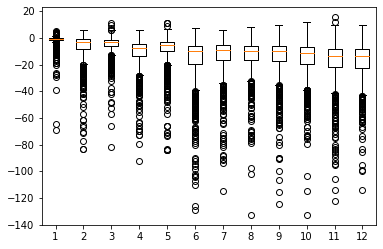

In [261]:
plt.boxplot(data.reshape(12, -1).T)
plt.show()

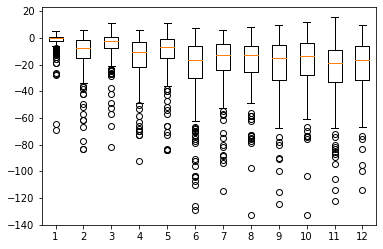

In [262]:
# 1h ahead
plt.boxplot(data[:, :, 0].reshape(12, -1).T)
plt.show()

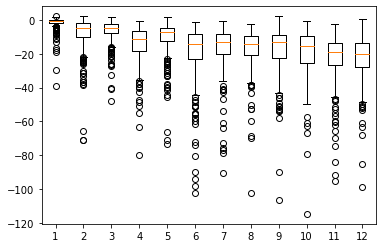

In [263]:
# 2h ahead
plt.boxplot(data[:, :, 1].reshape(12, -1).T)
plt.show()

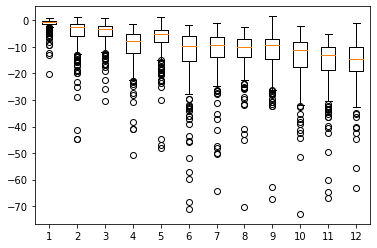

In [264]:
# 3h ahead
plt.boxplot(data[:, :, 2].reshape(12, -1).T)
plt.show()

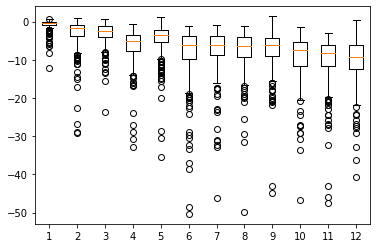

In [265]:
# 4h ahead
plt.boxplot(data[:, :, 3].reshape(12, -1).T)
plt.show()